In [1]:
import numpy as np
import pandas as pd
import pylab as plt
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit
# import seaborn as sns
# sns.set(style="ticks", context="poster")

import astropy.coordinates as ac
_ = ac.galactocentric_frame_defaults.set('v4.0') 
from astropy.coordinates import Angle
import astropy.units as u
from astropy.table import Table
from astropy.io import fits
import gala.coordinates as gc
import galstreams

from pyia import GaiaData

from xdgmm import XDGMM
from sklearn.mixture import GaussianMixture
from astroML.utils import log_multivariate_gaussian

import datetime

import warnings
warnings.filterwarnings('ignore')

In [2]:
mwsts = galstreams.MWStreams(verbose=False, implement_Off=True)

Initializing galstreams library from master_log... 


In [44]:
#without width
pd.set_option('display.max_columns', None)
mwsts.summary

,Imp,On,TrackName,Name,TrackRefs,TrackRefsLatex,Notes,length,ra_o,dec_o,distance_o,ra_f,dec_f,distance_f,ra_mid,dec_mid,distance_mid,ra_pole,dec_pole,InfoFlags,has_empirical_track,has_D,has_pm,has_vrad,DiscoveryRefs,ID
TrackName,,,,,,,,,,,,,,,,,,,,,,,,,,
20.0-1-M18,po,True,20.0-1-M18,20.0-1,mateu2018,Mateu2018,-,36.619756,280.225879,-41.031405,27.652559,311.522817,-16.281973,25.126725,298.182168,-29.913159,26.839948,235.758575,38.821881,0000,0,0,0,0,Mateu2018,1
300S-F18,st,True,300S-F18,300S,fu2018,Fu2018,-,11.084050,151.800005,16.046962,17.963333,163.170009,14.448969,14.350060,157.510431,15.343949,15.929409,308.056470,72.509388,1101,1,1,0,1,"NiedersteOstholt2009,Simon2011",2
AAU-AliqaUma-L21,st,True,AAU-AliqaUma-L21,AAU-AliqaUma,li2021,Li2021,-,9.677187,31.157872,-32.879053,25.609823,40.876171,-38.486811,30.845905,20.293004,-26.233552,21.981943,74.259068,47.933124,1111,1,1,1,1,Shipp2018,3
AAU-ATLAS-L21,st,True,AAU-ATLAS-L21,AAU-ATLAS,li2021,Li2021,-,23.561680,8.928511,-20.206287,18.995105,30.745903,-33.545164,25.557784,19.837356,-26.863125,21.478244,74.259068,47.933124,1111,1,1,1,1,Koposov2014,4
ATLAS-I21,st,False,ATLAS-I21,AAU-ATLAS,ibata2021,Ibata2021,-,18.115243,17.350232,-25.248735,24.839015,35.120208,-34.861329,20.394279,25.819117,-30.331205,24.642130,80.544842,44.626077,1110,1,1,1,0,Koposov2014,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Turbio-S18,ep,True,Turbio-S18,Turbio,shipp2018,"Shipp2018,Shipp2019",-,15.000114,28.000000,-61.000000,16.600000,27.900000,-46.000000,16.600000,27.941104,-53.500010,16.600000,297.765257,-0.130120,0020,0,0,2,0,Shipp2018,91
Turranburra-S19,st,True,Turranburra-S19,Turranburra,shipp2019,"Shipp2019,Shipp2018",-,13.729050,59.707970,-18.554702,27.500000,72.587631,-25.275911,27.500000,67.141164,-22.183041,27.500000,123.473122,53.283631,1010,1,0,1,0,Shipp2018,92
Wambelong-S18,ep,True,Wambelong-S18,Wambelong,shipp2018,"Shipp2018,Shipp2019",-,14.162214,90.500000,-45.600000,15.100000,79.300000,-34.300000,15.100000,84.434473,-40.084053,15.100000,328.673187,-27.312855,0020,0,0,2,0,Shipp2018,93


In [3]:
#with widths
pd.set_option('display.max_columns', None)
mwsts.summary

,Imp,On,TrackName,Name,TrackRefs,TrackRefsLatex,from-Members,Notes,width_phi2,width_phi2_Ref,width_pm_phi1_cosphi2,width_pm_phi1_cosphi2_Ref,width_pm_phi2,width_pm_phi2_Ref,total_v_sigma,total_v_sigma_Ref,Lv_stream,L_Ref,length,ra_o,dec_o,distance_o,ra_f,dec_f,distance_f,ra_mid,dec_mid,distance_mid,ra_pole,dec_pole,InfoFlags,has_empirical_track,has_D,has_pm,has_vrad,DiscoveryRefs,ID
TrackName,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
20.0-1-M18,po,True,20.0-1-M18,20.0-1,mateu2018,Mateu2018,False,-,1.80,Riley2020,-9.00,-----------,-9.00,------------,-9.0,-----------,0.0,--------,36.619756,280.225879,-41.031405,27.652559,311.522817,-16.281973,25.126725,298.182168,-29.913159,26.839948,235.758575,38.821881,0000,0,0,0,0,Mateu2018,1
300S-F18,st,True,300S-F18,300S,fu2018,Fu2018,False,-,0.40,Fu2018,-9.00,-----------,-9.00,------------,-9.0,-----------,0.0,--------,11.084050,151.800005,16.046962,17.963333,163.170009,14.448969,14.350060,157.510431,15.343949,15.929409,308.056470,72.509388,1101,1,1,0,1,"NiedersteOstholt2009,Simon2011",2
AAU-AliqaUma-L21,st,True,AAU-AliqaUma-L21,AAU-AliqaUma,li2021,Li2021,True,-,0.26,from-Members,0.16,from-Members,0.09,from-Members,-1.0,from-Members,0.0,--------,9.677187,31.157872,-32.879053,25.609823,40.876171,-38.486811,30.845905,20.293004,-26.233552,21.981943,74.259068,47.933124,1111,1,1,1,1,Shipp2018,3
AAU-ATLAS-L21,st,True,AAU-ATLAS-L21,AAU-ATLAS,li2021,Li2021,True,-,0.30,from-Members,0.14,from-Members,0.13,from-Members,-1.0,from-Members,0.0,--------,23.561680,8.928511,-20.206287,18.995105,30.745903,-33.545164,25.557784,19.837356,-26.863125,21.478244,74.259068,47.933124,1111,1,1,1,1,Koposov2014,4
ATLAS-I21,st,False,ATLAS-I21,AAU-ATLAS,ibata2021,Ibata2021,True,-,0.30,from-Members,0.30,from-Members,0.30,from-Members,-1.0,from-Members,0.0,--------,18.115243,17.350232,-25.248735,24.839015,35.120208,-34.861329,20.394279,25.819117,-30.331205,24.642130,80.544842,44.626077,1110,1,1,1,0,Koposov2014,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Turbio-S18,ep,True,Turbio-S18,Turbio,shipp2018,"Shipp2018,Shipp2019",False,-,0.20,Riley2020,-9.00,-----------,-9.00,------------,-9.0,-----------,0.0,--------,15.000114,28.000000,-61.000000,16.600000,27.900000,-46.000000,16.600000,27.941104,-53.500010,16.600000,297.765257,-0.130120,0020,0,0,2,0,Shipp2018,122
Turranburra-S19,st,True,Turranburra-S19,Turranburra,shipp2019,"Shipp2019,Shipp2018",True,-,0.50,from-Members,0.10,from-Members,0.10,from-Members,-1.0,from-Members,0.0,--------,13.729050,59.707970,-18.554702,27.500000,72.587631,-25.275911,27.500000,67.141164,-22.183041,27.500000,123.473122,53.283631,1010,1,0,1,0,Shipp2018,123
Wambelong-S18,ep,True,Wambelong-S18,Wambelong,shipp2018,"Shipp2018,Shipp2019",False,-,0.40,Riley2020,-9.00,-----------,-9.00,------------,-9.0,-----------,0.0,--------,14.162214,90.500000,-45.600000,15.100000,79.300000,-34.300000,15.100000,84.434473,-40.084053,15.100000,328.673187,-27.312855,0020,0,0,2,0,Shipp2018,124


In [9]:
has_pm = (mwsts.summary.has_pm == 1) 
has_pm2 = (mwsts.summary.has_pm == 2)
(has_pm | has_pm2).sum()

81

In [763]:
mwsts.summary[mwsts.summary.TrackName == 'Pal5-PW19']

,Imp,On,TrackName,Name,TrackRefs,TrackRefsLatex,from-Members,Notes,width_phi2,width_phi2_Ref,width_pm_phi1_cosphi2,width_pm_phi1_cosphi2_Ref,width_pm_phi2,width_pm_phi2_Ref,total_v_sigma,total_v_sigma_Ref,Lv_stream,L_Ref,length,ra_o,dec_o,distance_o,ra_f,dec_f,distance_f,ra_mid,dec_mid,distance_mid,ra_pole,dec_pole,InfoFlags,has_empirical_track,has_D,has_pm,has_vrad,DiscoveryRefs,ID
TrackName,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Pal5-PW19,st,True,Pal5-PW19,Pal5,pricewhelan2019,"PriceWhelan2019_pal5,Bonaca2020",True,GC,0.0,from-Members,0.0,from-Members,0.0,from-Members,-1.0,from-Members,0.0,--------,21.38902,242.093825,6.883095,22.023408,224.65739,-4.800515,19.088234,229.005945,-0.105794,20.537974,319.205273,-56.489779,1110,1,1,1,0,Odenkirchen2001,99


In [33]:
mwsts.get_track_names_for_stream('M3')

['M30-S20']

In [3]:
f = fits.open('../catalogs/globular_clusters_Vasiliev&Baumgardt2021.fit')
globs = f[1].data
Name = 'NGC 7089'

vasiliev_st = globs[globs['Name'] == Name]
Table(vasiliev_st)


_RAJ2000,_DEJ2000,Name,OName,RAJ2000,DEJ2000,pmRA,e_pmRA,pmDE,e_pmDE,corr,plx,e_plx,Rscale,Nstar,SimbadName,recno
float64,float64,str12,str10,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32,str26,int32
323.363,-0.823,NGC 7089,M 2,323.363,-0.823,3.435,0.025,-2.159,0.024,0.01,0.082,0.011,3.52,3091,NGC 7089,166


In [4]:
globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')

Name_d = 'NGC_7089'
globs_d[globs_d.Cluster == Name_d]

,Cluster,RA,DEC,l,b,Rsun,e_Rsun,R_GC,RV,e_RV,...,U,DU,V,DV,W,DW,R_PERI,e_R_PERI,R_APO,e_R_APO
163,NGC_7089,323.362579,-0.823250,53.371,-35.770,11.69,0.11,10.54,-3.78,0.30,...,73.27,0.47,146.63,0.42,-173.80,0.45,0.88,0.06,18.74,0.22


In [6]:
from astropy.coordinates import Angle

f = fits.open('../catalogs/darwf_galaxies_localgroup_McConnachie2012.fit')
darwf_galax = f[1].data

# skip_galax = darwf_galax[(Angle(darwf_galax['RAJ2000'] + 'hours').value*15 > ra_lim[0]) & (Angle(darwf_galax['RAJ2000'] + 'hours').value*15 < ra_lim[1]) & 
                         # (Angle(darwf_galax['DEJ2000'] + 'degrees').value > dec_lim[0]) & (Angle(darwf_galax['DEJ2000'] + 'degrees').value < dec_lim[1])]

In [8]:
Tucana_g = ac.SkyCoord(ra=359.15*u.deg,
                      dec=-59.15*u.deg,
                      distance=25.1*u.kpc) #Drlica-Wagner
Tucana_st = Tucana_g.transform_to(mwsts['TucanaIII-S19'].stream_frame)

In [764]:
st_names = ['Fimbulthul-I21', 'OmegaCen-I21', 'Fjorm-I21', 'M68-I21', 'M68-P19', 'Gjoll-I21', 'NGC3201-I21', 'NGC3201-P21', 'M2-G22', 'M2-I21', 'M5-G19', 'M5-I21', 'M92-I21', 'NGC288-I21', 'NGC2298-I21', 'NGC5466-I21', 'NGC5466-J21', 'Pal5-I21', 'Pal5-PW19', 'TucanaIII-S19', 'NGC1261-I21', 'NGC1851-I21', 'NGC2808-I21', 'NGC6101-I21', 'NGC6397-I21']
c_names = ['NGC 5139', 'NGC 4590', 'NGC 3201', 'NGC 7089', 'NGC 5904', 'NGC 6341', 'NGC 288', 'NGC 2298', 'NGC 5466', 'Pal 5', 'NGC 1261', 'NGC 1851', 'NGC 2808', 'NGC 6101', 'NGC 6397']
d_names = ['NGC_5139', 'NGC_4590','NGC_3201', 'NGC_7089', 'NGC_5904', 'NGC_6341', 'NGC_288', 'NGC_2298', 'NGC_5466', 'Pal_5', 'NGC_1261', 'NGC_1851', 'NGC_2808', 'NGC_6101', 'NGC_6397']

In [361]:
st = 'Pal5-PW19'

if (st == 'Fimbulthul-I21') | (st == 'OmgeaCen-I21'):
    Name, Name_d = 'NGC 5139', 'NGC_5139'
if (st == 'Fjorm-I21') | (st == 'M68-I21') | (st == 'M68-P19'):
    Name, Name_d = 'NGC 4509', 'NGC_4509'
if (st == 'Gjoll-I21') | (st == 'NGC3201-I21') | (st == 'NGC3201-P21'):
    Name, Name_d = 'NGC 3201', 'NGC_3201'
if (st == 'M2-G22') | (st == 'M2-I21') | (st == 'M5-G19'):
    Name, Name_d = 'NGC 7089', 'NGC_7089'
if (st == 'M5-G19') | (st == 'M5-I21'):
    Name, Name_d = 'NGC 5904', 'NGC_5904'
if (st == 'M92-I21'):
    Name, Name_d = 'NGC 6341', 'NGC_6341'
if (st == 'NGC288-I21'):
    Name, Name_d = 'NGC 288', 'NGC_288'
if (st == 'NGC2298-I21'):
    Name, Name_d = 'NGC 2298', 'NGC_2298'
if (st == 'NGC5466-I21') | (st == 'NGC5466-J21'):
    Name, Name_d = 'NGC 5466', 'NGC_5466'
if (st == 'Pal5-I21') | (st == 'Pal5-PW19'):
    Name, Name_d = 'Pal 5', 'Pal_5'
if (st == 'NGC1261-I21'):
    Name, Name_d = 'NGC 1261', 'NGC_1261'
if (st == 'NGC1851-I21'):
    Name, Name_d = 'NGC 1851', 'NGC_1851'
if (st == 'NGC2808-I21'):
    Name, Name_d = 'NGC 2808', 'NGC_2808'
if (st == 'NGC6101-I21'):
    Name, Name_d = 'NGC 6101', 'NGC_6101'
if (st == 'NGC6397-I21'):
    Name, Name_d = 'NGC 6397', 'NGC_6397'


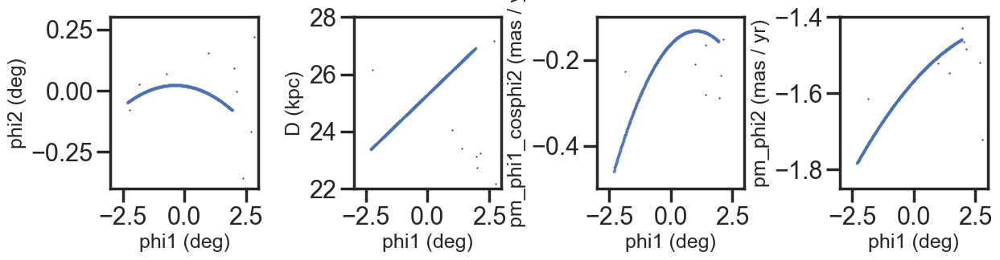

In [130]:
st = 'TucanaIII-S19'

scat_kwds = dict(marker='.',label=st, s=1)#, fontsize=10)
# galstreams.plot_5D_tracks_subplots_row(mwsts[st].track, frame = ac.ICRS(), show_ylabels=True, scat_kwds=scat_kwds )
# galstreams.plot_5D_tracks_subplots_row(mwsts[st].track, frame = ac.Galactic(), show_ylabels=True, scat_kwds=scat_kwds )

fig,axs = plt.subplots(1,4, figsize=(12,3))
plt.tight_layout(pad=1.1, w_pad=3)
galstreams.plot_5D_tracks_subplots_row(mwsts[st].track, axs=axs, frame = mwsts[st].stream_frame, show_ylabels=True, scat_kwds=scat_kwds)
axs[0].set_ylim(-.4,.3)
axs[1].set_ylim(22,28)
axs[2].set_ylim(-.5,-.1)
axs[3].set_ylim(-1.85,-1.4)
# axs[0].plot(phi1,phi2,'.k',ms=1)
# axs[1].plot(phi1,d,'.k',ms=1)
# axs[2].plot(phi1,pmphi1,'.k',ms=1)
# axs[3].plot(phi1,pmphi2,'.k',ms=1)
for axs in axs:
    axs.set_xlabel(axs.get_xlabel(), fontsize=18)
    axs.set_ylabel(axs.get_ylabel(), fontsize=18)
    axs.set_xlim(-3,3)

# Widths

In [3]:
st_names = ['Fimbulthul-I21', 'OmegaCen-I21', 'Fjorm-I21', 'M68-I21', 'M68-P19', 'Gjoll-I21', 'NGC3201-I21', 'NGC3201-P21', 'M2-G22', 'M2-I21', 'M5-G19', 'M5-I21', 'M92-I21', 'NGC288-I21', 'NGC2298-I21', 'NGC5466-I21', 'NGC5466-J21', 'Pal5-I21', 'Pal5-PW19', 'TucanaIII-S19', 'NGC1261-I21', 'NGC1851-I21', 'NGC2808-I21', 'NGC6101-I21', 'NGC6397-I21']
print(len(st_names))

25


In [766]:
widths_galstreams = mwsts.summary.loc[mwsts.summary.TrackName.isin(st_names), ['width_phi2', 'width_phi2_Ref', 'width_pm_phi1_cosphi2',	'width_pm_phi1_cosphi2_Ref', 'width_pm_phi2', 'width_pm_phi2_Ref']].sort_values('TrackName')
widths_galstreams

,width_phi2,width_phi2_Ref,width_pm_phi1_cosphi2,width_pm_phi1_cosphi2_Ref,width_pm_phi2,width_pm_phi2_Ref
TrackName,,,,,,
Fimbulthul-I21,0.1,from-Members,0.4,from-Members,0.2,from-Members
Fjorm-I21,0.0,from-Members,0.0,from-Members,0.0,from-Members
Gjoll-I21,0.7,from-Members,1.0,from-Members,0.3,from-Members
M2-G22,0.8,from-Members,0.2,from-Members,0.2,from-Members
M2-I21,0.2,visual,-9.0,-----------,-9.0,------------
M5-G19,0.0,from-Members,0.5,from-Members,0.4,from-Members
M5-I21,0.4,from-Members,0.8,from-Members,0.9,from-Members
M68-I21,0.0,from-Members,0.0,from-Members,0.0,from-Members
M68-P19,0.7,from-Members,0.3,from-Members,0.5,from-Members


In [66]:
# widths = pd.DataFrame(columns = ['width_phi2', 'width_dist', 'width_pmphi1', 'width_pmphi2'], index = st_names)
# widths.index.name = 'TrackName'
widths = pd.read_csv('../census/widths_st_cluster.csv').set_index('TrackName')
widths.sort_values('TrackName')
# widths.to_csv('../census/widths_st_cluster.csv')

,width_phi2,width_dist,width_pmphi1,width_pmphi2
TrackName,,,,
Fimbulthul-I21,1.615398,2.972061e-01,1.298302,0.966300
Fjorm-I21,1.208934,9.331871e-01,0.941996,0.544913
Gjoll-I21,0.693553,2.452847e-01,1.009405,0.284369
M2-G22,0.818921,5.370032e-15,0.186119,0.180632
M2-I21,0.218136,9.761900e-01,0.378506,0.214660
M5-G19,1.162249,6.374546e-02,0.497548,0.383908
M5-I21,0.415699,6.087622e-01,0.816215,0.910467
M68-I21,0.443117,3.942288e-01,0.784263,0.381131
M68-P19,0.684169,3.011427e+00,0.287443,0.452563


In [5]:
I21 = pd.read_csv('../catalogs/streams/members/ibata2021.tab01.wnames.cat', header=0, sep=' ')

M68_P19 = pd.read_csv('../catalogs/streams/members/palau2019.m68.tableE1.csv')

NGC3201_P21 = pd.read_csv('../catalogs/streams/members/palau2020.ngc3201.tableC1.csv')

M2_G22 =  pd.read_csv('../catalogs/streams/members/grillmair2022.m2.tables1and2.dat', header=0, sep='\s+')

M2_I21radec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_M2_radec.csv', header=None)
M2_I21rad = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_M2_rad.csv', header=None)
M2_I21rapmra = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_M2_rapmra.csv', header=None)
M2_I21rapmdec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_M2_rapmdec.csv', header=None)

M5_G19 =  pd.read_csv('../catalogs/streams/members/grillmair2019.m5.table1.dat', header=0, sep='\s+')

NGC2298_I21radec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC2298_radec.csv', header=None)
NGC2298_I21rad = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC2298_rad.csv', header=None)
NGC2298_I21rapmra = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC2298_rapmra.csv', header=None)
NGC2298_I21rapmdec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC2298_rapmdec.csv', header=None)

NGC1261_I21radec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC1261_radec.csv', header=None)
NGC1261_I21rad = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC1261_rad.csv', header=None)
NGC1261_I21rapmra = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC1261_rapmra.csv', header=None)
NGC1261_I21rapmdec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC1261_rapmdec.csv', header=None)

NGC1851_I21radec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC1851_radec.csv', header=None)
NGC1851_I21rad = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC1851_rad.csv', header=None)
NGC1851_I21rapmra = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC1851_rapmra.csv', header=None)
NGC1851_I21rapmdec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC1851_rapmdec.csv', header=None)

NGC2808_I21radec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC2808_radec.csv', header=None)
NGC2808_I21rad = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC2808_rad.csv', header=None)
NGC2808_I21rapmra = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC2808_rapmra.csv', header=None)
NGC2808_I21rapmdec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC2808_rapmdec.csv', header=None)

NGC288_I21radec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC288_radec.csv', header=None)
NGC288_I21rad = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC288_rad.csv', header=None)
NGC288_I21rapmra = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC288_rapmra.csv', header=None)
NGC288_I21rapmdec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC288_rapmdec.csv', header=None)

NGC5466_I21radec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC5466_radec.csv', header=None)
NGC5466_I21rad = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC5466_rad.csv', header=None)
NGC5466_I21rapmra = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC5466_rapmra.csv', header=None)
NGC5466_I21rapmdec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC5466_rapmdec.csv', header=None)

NGC5466_J21 = pd.read_csv('../catalogs/streams/members/jensen2021.ngc5466.csv')

NGC6101_I21radec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC6101_radec.csv', header=None)
NGC6101_I21rad = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC6101_rad.csv', header=None)
NGC6101_I21rapmra = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC6101_rapmra.csv', header=None)
NGC6101_I21rapmdec = pd.read_csv('../catalogs/streams/members/ibata21_figs13_14/Ibata21_Fig14_NGC6101_rapmdec.csv', header=None)

f = fits.open('../catalogs/streams/pal5/RRLwithprobthin.fit')
Pal5_PW19 = f[1].data

S19 = pd.read_csv('../catalogs/streams/members/shipp2019.stream_members.tab7.gedr3.csv')



f = fits.open('../catalogs/globular_clusters_Vasiliev&Baumgardt2021.fit')
globs = f[1].data
globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')

## Fimbulthul - OmegaCen

Fimbulthul-21 y OmegaCen-21 son iguales en galstreams?? Capaz que solo en la versión de width-track, chequear.. (en el paper no son iguales), en la tabla de ibata (wnames) no hay distinción entre ambos: OmegaCen-Fimbulthul 
Update: Enel galstreams de main los tracks de OmegaCen y Fimbulthul son diferentes (por ahora sigo teniendo datos para los dos combinados)

In [6]:
globs_ = globs[globs['Name'] == 'NGC 5139']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_5139']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

width_phi2: 1.6153976611508631
width_pmphi1: 1.29830180110172
width_pmphi2: 0.9662997741059767
width_dist: 0.2972061361970378


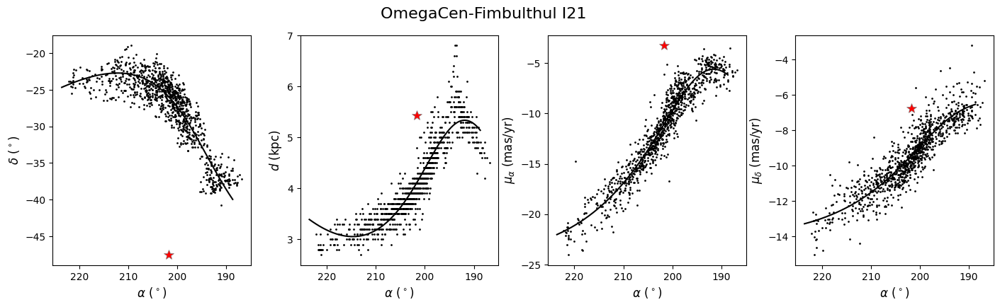

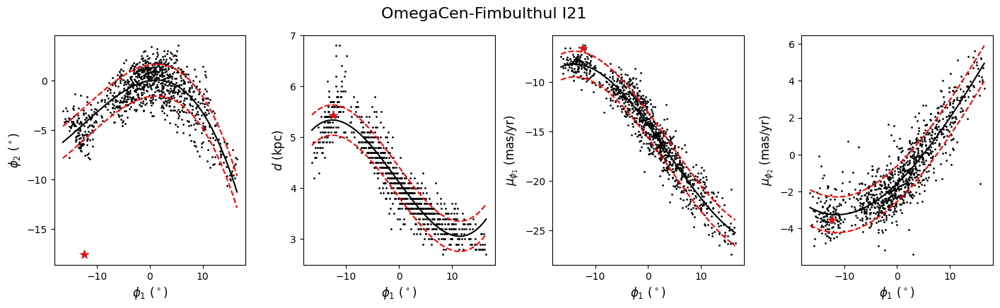

In [7]:
glob_st = glob_g.transform_to(mwsts['Fimbulthul-I21'].stream_frame)
n=2 #numero de medios sigmas a cada lado de la media (n=2 hay 1sigma a cada lado)

Fimbulthul_I21 = I21[I21.StreamName == 'OmegaCen-Fimbulthul']
Fimbulthul_I21_g = ac.SkyCoord(ra=np.array(Fimbulthul_I21.ra_epoch2000)*u.deg,
                                  dec=np.array(Fimbulthul_I21.dec_epoch2000)*u.deg,
                                  distance=np.array(Fimbulthul_I21.dis)*u.kpc,
                                  pm_ra_cosdec=np.array(Fimbulthul_I21.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(Fimbulthul_I21.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(Fimbulthul_I21.pmdec))*u.km/u.s)
    
Fimbulthul_I21_c = Fimbulthul_I21_g.transform_to(mwsts['Fimbulthul-I21'].stream_frame)

fphi2 = interp1d(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1.value, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1.value, mwsts['Fimbulthul-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1.value, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1.value, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_c.pm_phi2.value))
print('width_dist:',np.std(fd(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_g.distance.value))

widths.loc['Fimbulthul-I21'].width_phi2 = np.std(fphi2(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_c.phi2.value)
widths.loc['Fimbulthul-I21'].width_dist = np.std(fd(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_g.distance.value)
widths.loc['Fimbulthul-I21'].width_pmphi1 = np.std(fpmphi1(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_c.pm_phi1_cosphi2.value)
widths.loc['Fimbulthul-I21'].width_pmphi2 = np.std(fpmphi2(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_c.pm_phi2.value)

widths.loc['OmegaCen-I21'].width_phi2 = np.std(fphi2(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_c.phi2.value)
widths.loc['OmegaCen-I21'].width_dist = np.std(fd(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_g.distance.value)
widths.loc['OmegaCen-I21'].width_pmphi1 = np.std(fpmphi1(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_c.pm_phi1_cosphi2.value)
widths.loc['OmegaCen-I21'].width_pmphi2 = np.std(fpmphi2(Fimbulthul_I21_c.phi1.value)-Fimbulthul_I21_c.pm_phi2.value)

fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['Fimbulthul-I21'].track.ra, mwsts['Fimbulthul-I21'].track.dec,'-k', lw=1.5, zorder=99)
# ax.plot(mwsts['OmegaCen-I21'].track.ra, mwsts['OmegaCen-I21'].track.dec,'-',c='red', lw=1.5,zorder=98)
ax.plot(Fimbulthul_I21_g.ra, Fimbulthul_I21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['Fimbulthul-I21'].track.ra, mwsts['Fimbulthul-I21'].track.distance,'-k', lw=1.5, zorder=99)
# ax.plot(mwsts['OmegaCen-I21'].track.ra, mwsts['OmegaCen-I21'].track.distance,'-',c='red', lw=1.5,zorder=98)
ax.plot(Fimbulthul_I21_g.ra, Fimbulthul_I21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['Fimbulthul-I21'].track.ra, mwsts['Fimbulthul-I21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
# ax.plot(mwsts['OmegaCen-I21'].track.ra, mwsts['OmegaCen-I21'].track.pm_ra_cosdec,'-',c='red', lw=1.5,zorder=98)
ax.plot(Fimbulthul_I21_g.ra, Fimbulthul_I21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()


ax=fig.add_subplot(144)
ax.plot(mwsts['Fimbulthul-I21'].track.ra, mwsts['Fimbulthul-I21'].track.pm_dec,'-k', lw=1.5,zorder=100)
# ax.plot(mwsts['OmegaCen-I21'].track.ra, mwsts['OmegaCen-I21'].track.pm_dec,'-',c='red', lw=1.5,zorder=99)
ax.plot(Fimbulthul_I21_g.ra, Fimbulthul_I21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('OmegaCen-Fimbulthul I21',fontsize=16);



fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
# ax2.plot(mwsts['OmegaCen-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['OmegaCen-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi2,'-',c='red', lw=1.5,zorder=98)
ax2.plot(Fimbulthul_I21_c.phi1, Fimbulthul_I21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi2 + n*widths.loc['Fimbulthul-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi2 - n*widths.loc['Fimbulthul-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.distance,'-k', lw=1.5, zorder=99)
# ax2.plot(mwsts['OmegaCen-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['OmegaCen-I21'].track.distance,'-',c='red', lw=1.5,zorder=98)
ax2.plot(Fimbulthul_I21_c.phi1, Fimbulthul_I21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.distance + n*widths.loc['Fimbulthul-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.distance - n*widths.loc['Fimbulthul-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
# ax2.plot(mwsts['OmegaCen-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['OmegaCen-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi1_cosphi2,'-',c='red', lw=1.5,zorder=98)
ax2.plot(Fimbulthul_I21_c.phi1, Fimbulthul_I21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['Fimbulthul-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['Fimbulthul-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
# ax2.plot(mwsts['OmegaCen-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['OmegaCen-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi2,'-',c='red', lw=1.5,zorder=99)
ax2.plot(Fimbulthul_I21_c.phi1, Fimbulthul_I21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi2 + n*widths.loc['Fimbulthul-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).phi1, mwsts['Fimbulthul-I21'].track.transform_to(mwsts['Fimbulthul-I21'].stream_frame).pm_phi2 - n*widths.loc['Fimbulthul-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('OmegaCen-Fimbulthul I21',fontsize=16);

## Fjorm - M68

Los tracks de Fjorm-21 y M68-21 en esta versión son iguales también

In [8]:
globs_ = globs[globs['Name'] == 'NGC 4590']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_4590']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

width_phi2: 1.208934433269824
width_pmphi1: 0.9419955804455012
width_pmphi2: 0.5449134373606653
width_dist: 0.9331870986271771


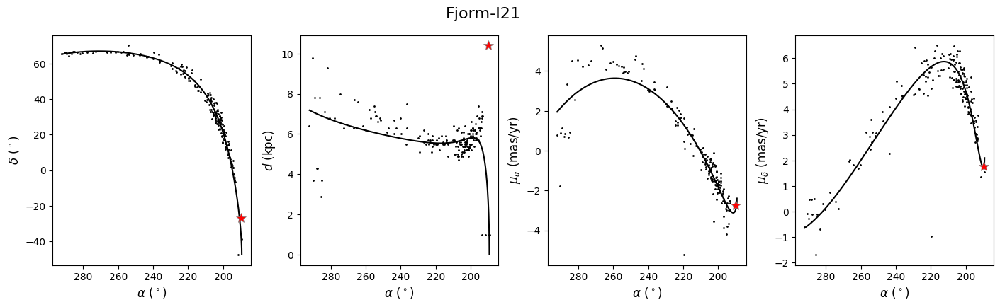

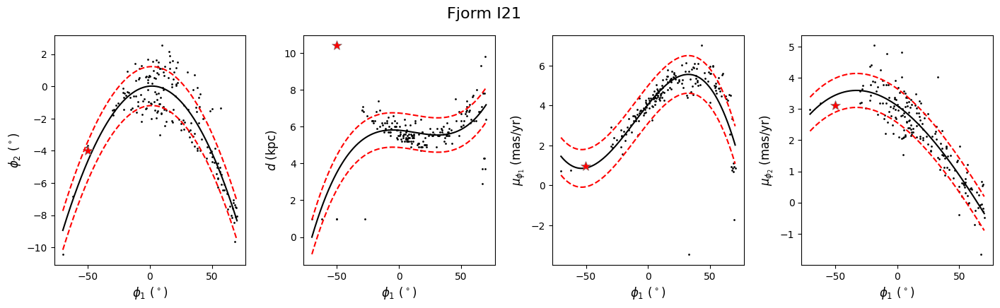

In [9]:
glob_st = glob_g.transform_to(mwsts['Fjorm-I21'].stream_frame)


Fjorm_I21 = I21[I21.StreamName=='Fjorm']

Fjorm_I21_g = ac.SkyCoord(ra=np.array(Fjorm_I21.ra_epoch2000)*u.deg,
                                  dec=np.array(Fjorm_I21.dec_epoch2000)*u.deg,
                                  distance=np.array(Fjorm_I21.dis)*u.kpc,
                                  pm_ra_cosdec=np.array(Fjorm_I21.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(Fjorm_I21.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(Fjorm_I21.pmdec))*u.km/u.s)
    
Fjorm_I21_c = Fjorm_I21_g.transform_to(mwsts['Fjorm-I21'].stream_frame)

fphi2 = interp1d(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1.value, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1.value, mwsts['Fjorm-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1.value, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1.value, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(Fjorm_I21_c.phi1.value)-Fjorm_I21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(Fjorm_I21_c.phi1.value)-Fjorm_I21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(Fjorm_I21_c.phi1.value)-Fjorm_I21_c.pm_phi2.value))
print('width_dist:',np.std(fd(Fjorm_I21_c.phi1.value)-Fjorm_I21_g.distance.value))

widths.loc['Fjorm-I21'].width_phi2 = np.std(fphi2(Fjorm_I21_c.phi1.value)-Fjorm_I21_c.phi2.value)
widths.loc['Fjorm-I21'].width_dist = np.std(fd(Fjorm_I21_c.phi1.value)-Fjorm_I21_g.distance.value)
widths.loc['Fjorm-I21'].width_pmphi1 = np.std(fpmphi1(Fjorm_I21_c.phi1.value)-Fjorm_I21_c.pm_phi1_cosphi2.value)
widths.loc['Fjorm-I21'].width_pmphi2 = np.std(fpmphi2(Fjorm_I21_c.phi1.value)-Fjorm_I21_c.pm_phi2.value)

fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['Fjorm-I21'].track.ra, mwsts['Fjorm-I21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(Fjorm_I21_g.ra, Fjorm_I21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['Fjorm-I21'].track.ra, mwsts['Fjorm-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(Fjorm_I21_g.ra, Fjorm_I21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['Fjorm-I21'].track.ra, mwsts['Fjorm-I21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(Fjorm_I21_g.ra, Fjorm_I21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['Fjorm-I21'].track.ra, mwsts['Fjorm-I21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(Fjorm_I21_g.ra, Fjorm_I21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('Fjorm-I21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(Fjorm_I21_c.phi1, Fjorm_I21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi2 + n*widths.loc['Fjorm-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi2 - n*widths.loc['Fjorm-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(Fjorm_I21_c.phi1, Fjorm_I21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.distance + n*widths.loc['Fjorm-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.distance - n*widths.loc['Fjorm-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(Fjorm_I21_c.phi1, Fjorm_I21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['Fjorm-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['Fjorm-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(Fjorm_I21_c.phi1, Fjorm_I21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).pm_phi2 + n*widths.loc['Fjorm-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).phi1, mwsts['Fjorm-I21'].track.transform_to(mwsts['Fjorm-I21'].stream_frame).pm_phi2 - n*widths.loc['Fjorm-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('Fjorm I21',fontsize=16);

width_phi2: 0.4431172913001987
width_pmphi1: 0.7842626449917623
width_pmphi2: 0.38113087009658697
width_dist: 0.39422875193601975


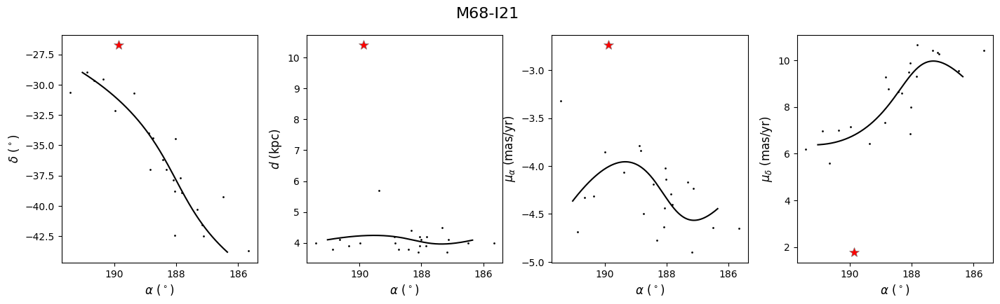

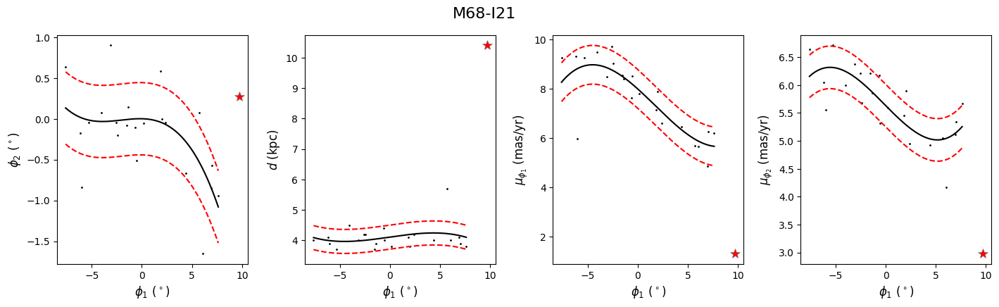

In [10]:
glob_st = glob_g.transform_to(mwsts['M68-I21'].stream_frame)

M68_I21 = I21[I21.StreamName=='M68']

M68_I21_g = ac.SkyCoord(ra=np.array(M68_I21.ra_epoch2000)*u.deg,
                                  dec=np.array(M68_I21.dec_epoch2000)*u.deg,
                                  distance=np.array(M68_I21.dis)*u.kpc,
                                  pm_ra_cosdec=np.array(M68_I21.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(M68_I21.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(M68_I21.pmdec))*u.km/u.s)
    
M68_I21_c = M68_I21_g.transform_to(mwsts['M68-I21'].stream_frame)

fphi2 = interp1d(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1.value, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1.value, mwsts['M68-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1.value, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1.value, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(M68_I21_c.phi1.value)-M68_I21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(M68_I21_c.phi1.value)-M68_I21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(M68_I21_c.phi1.value)-M68_I21_c.pm_phi2.value))
print('width_dist:',np.std(fd(M68_I21_c.phi1.value)-M68_I21_g.distance.value))

widths.loc['M68-I21'].width_phi2 = np.std(fphi2(M68_I21_c.phi1.value)-M68_I21_c.phi2.value)
widths.loc['M68-I21'].width_dist = np.std(fd(M68_I21_c.phi1.value)-M68_I21_g.distance.value)
widths.loc['M68-I21'].width_pmphi1 = np.std(fpmphi1(M68_I21_c.phi1.value)-M68_I21_c.pm_phi1_cosphi2.value)
widths.loc['M68-I21'].width_pmphi2 = np.std(fpmphi2(M68_I21_c.phi1.value)-M68_I21_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['M68-I21'].track.ra, mwsts['M68-I21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(M68_I21_g.ra, M68_I21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['M68-I21'].track.ra, mwsts['M68-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(M68_I21_g.ra, M68_I21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['M68-I21'].track.ra, mwsts['M68-I21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(M68_I21_g.ra, M68_I21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['M68-I21'].track.ra, mwsts['M68-I21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(M68_I21_g.ra, M68_I21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('M68-I21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(M68_I21_c.phi1, M68_I21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi2 + n*widths.loc['M68-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi2 - n*widths.loc['M68-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(M68_I21_c.phi1, M68_I21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.distance + n*widths.loc['M68-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.distance - n*widths.loc['M68-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(M68_I21_c.phi1, M68_I21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['M68-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['M68-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(M68_I21_c.phi1, M68_I21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).pm_phi2 + n*widths.loc['M68-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).phi1, mwsts['M68-I21'].track.transform_to(mwsts['M68-I21'].stream_frame).pm_phi2 - n*widths.loc['M68-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('M68-I21',fontsize=16);

width_phi2: 0.6841685879556385
width_pmphi1: 0.2874431703812163
width_pmphi2: 0.45256315225595334
width_dist: 3.0114274809007813


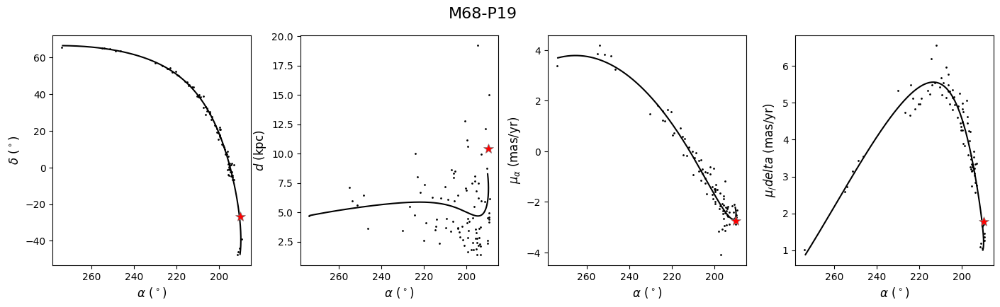

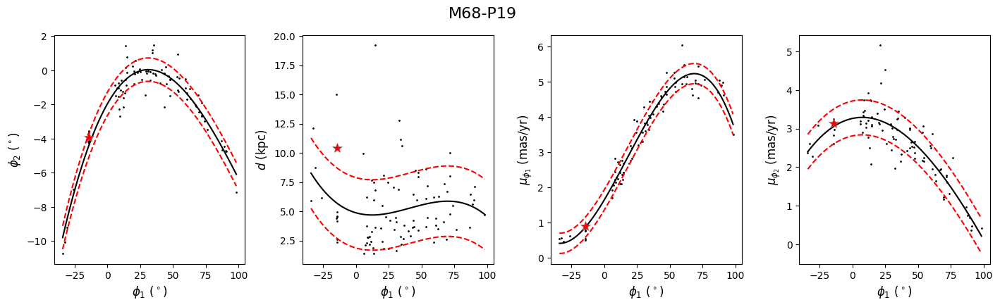

In [11]:
glob_st = glob_g.transform_to(mwsts['M68-P19'].stream_frame)

M68_P19 = M68_P19[M68_P19.parallax>0.05]

M68_P19_g = ac.SkyCoord(ra=np.array(M68_P19.ra)*u.deg,
                                  dec=np.array(M68_P19.dec)*u.deg,
                                  distance=np.array(1/M68_P19.parallax)*u.kpc,
                                  pm_ra_cosdec=np.array(M68_P19.muracosdec)*u.mas/u.yr,
                                  pm_dec=np.array(M68_P19.mudec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(M68_P19.mudec))*u.km/u.s)
    
M68_P19_c = M68_P19_g.transform_to(mwsts['M68-P19'].stream_frame)

fphi2 = interp1d(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1.value, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1.value, mwsts['M68-P19'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1.value, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1.value, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(M68_P19_c.phi1.value)-M68_P19_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(M68_P19_c.phi1.value)-M68_P19_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(M68_P19_c.phi1.value)-M68_P19_c.pm_phi2.value))
print('width_dist:',np.std(fd(M68_P19_c.phi1.value)-M68_P19_g.distance.value))

widths.loc['M68-P19'].width_phi2 = np.std(fphi2(M68_P19_c.phi1.value)-M68_P19_c.phi2.value)
widths.loc['M68-P19'].width_dist = np.std(fd(M68_P19_c.phi1.value)-M68_P19_g.distance.value)
widths.loc['M68-P19'].width_pmphi1 = np.std(fpmphi1(M68_P19_c.phi1.value)-M68_P19_c.pm_phi1_cosphi2.value)
widths.loc['M68-P19'].width_pmphi2 = np.std(fpmphi2(M68_P19_c.phi1.value)-M68_P19_c.pm_phi2.value)

fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['M68-P19'].track.ra, mwsts['M68-P19'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(M68_P19_g.ra, M68_P19_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['M68-P19'].track.ra, mwsts['M68-P19'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(M68_P19_g.ra, M68_P19_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['M68-P19'].track.ra, mwsts['M68-P19'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(M68_P19_g.ra, M68_P19_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['M68-P19'].track.ra, mwsts['M68-P19'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(M68_P19_g.ra, M68_P19_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_/delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('M68-P19',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(M68_P19_c.phi1, M68_P19_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi2 + n*widths.loc['M68-P19'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi2 - n*widths.loc['M68-P19'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(M68_P19_c.phi1, M68_P19_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.distance + n*widths.loc['M68-P19'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.distance - n*widths.loc['M68-P19'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(M68_P19_c.phi1, M68_P19_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['M68-P19'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['M68-P19'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(M68_P19_c.phi1, M68_P19_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).pm_phi2 + n*widths.loc['M68-P19'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).phi1, mwsts['M68-P19'].track.transform_to(mwsts['M68-P19'].stream_frame).pm_phi2 - n*widths.loc['M68-P19'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('M68-P19',fontsize=16);

## Gjoll - NGC3201

Gjoll-I21 y NGC3201-I21 tienen el mismo track...
UPDATE: En mian-galstream son diferentes

In [12]:
globs_ = globs[globs['Name'] == 'NGC 3201']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_3201']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

width_phi2: 0.6935525886984297
width_pmphi1: 1.0094050165049944
width_pmphi2: 0.2843689000274469
width_dist: 0.2452847325500104


Text(0.5, 0.98, 'Gjoll-I21')

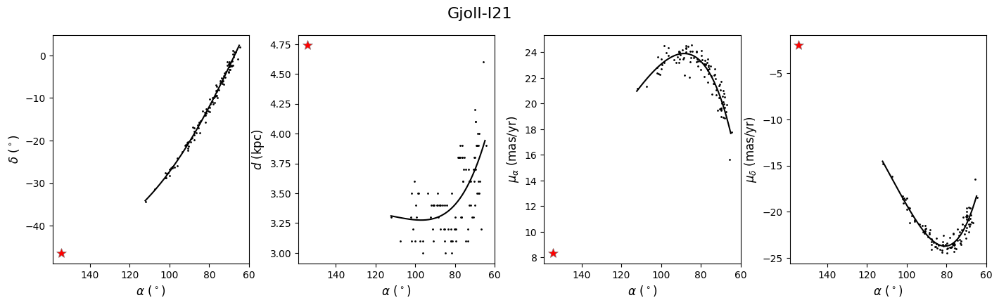

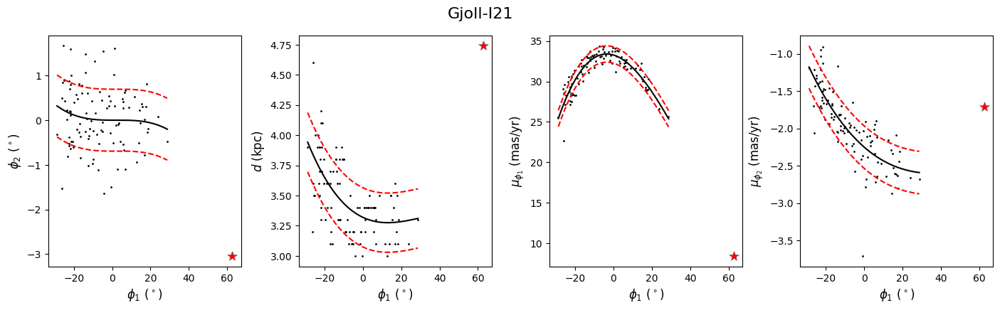

In [13]:
glob_st = glob_g.transform_to(mwsts['Gjoll-I21'].stream_frame)

Gjoll_I21 = I21[I21.StreamName=='Gjoll']

Gjoll_I21_g = ac.SkyCoord(ra=np.array(Gjoll_I21.ra_epoch2000)*u.deg,
                                  dec=np.array(Gjoll_I21.dec_epoch2000)*u.deg,
                                  distance=np.array(Gjoll_I21.dis)*u.kpc,
                                  pm_ra_cosdec=np.array(Gjoll_I21.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(Gjoll_I21.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(Gjoll_I21.pmdec))*u.km/u.s)
    
Gjoll_I21_c = Gjoll_I21_g.transform_to(mwsts['Gjoll-I21'].stream_frame)

fphi2 = interp1d(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1.value, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1.value, mwsts['Gjoll-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1.value, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1.value, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(Gjoll_I21_c.phi1.value)-Gjoll_I21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(Gjoll_I21_c.phi1.value)-Gjoll_I21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(Gjoll_I21_c.phi1.value)-Gjoll_I21_c.pm_phi2.value))
print('width_dist:',np.std(fd(Gjoll_I21_c.phi1.value)-Gjoll_I21_g.distance.value))

widths.loc['Gjoll-I21'].width_phi2 = np.std(fphi2(Gjoll_I21_c.phi1.value)-Gjoll_I21_c.phi2.value)
widths.loc['Gjoll-I21'].width_dist = np.std(fd(Gjoll_I21_c.phi1.value)-Gjoll_I21_g.distance.value)
widths.loc['Gjoll-I21'].width_pmphi1 = np.std(fpmphi1(Gjoll_I21_c.phi1.value)-Gjoll_I21_c.pm_phi1_cosphi2.value)
widths.loc['Gjoll-I21'].width_pmphi2 = np.std(fpmphi2(Gjoll_I21_c.phi1.value)-Gjoll_I21_c.pm_phi2.value)

fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['Gjoll-I21'].track.ra, mwsts['Gjoll-I21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(Gjoll_I21_g.ra, Gjoll_I21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['Gjoll-I21'].track.ra, mwsts['Gjoll-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(Gjoll_I21_g.ra, Gjoll_I21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['Gjoll-I21'].track.ra, mwsts['Gjoll-I21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(Gjoll_I21_g.ra, Gjoll_I21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['Gjoll-I21'].track.ra, mwsts['Gjoll-I21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(Gjoll_I21_g.ra, Gjoll_I21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('Gjoll-I21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(Gjoll_I21_c.phi1, Gjoll_I21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi2 + n*widths.loc['Gjoll-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi2 - n*widths.loc['Gjoll-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(Gjoll_I21_c.phi1, Gjoll_I21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.distance + n*widths.loc['Gjoll-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.distance - n*widths.loc['Gjoll-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(Gjoll_I21_c.phi1, Gjoll_I21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['Gjoll-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['Gjoll-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(Gjoll_I21_c.phi1, Gjoll_I21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).pm_phi2 + n*widths.loc['Gjoll-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).phi1, mwsts['Gjoll-I21'].track.transform_to(mwsts['Gjoll-I21'].stream_frame).pm_phi2 - n*widths.loc['Gjoll-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('Gjoll-I21',fontsize=16)

width_phi2: 0.5402622455766622
width_pmphi1: 1.2129807085482878
width_pmphi2: 0.6025833527265514
width_dist: 0.7874008485871984


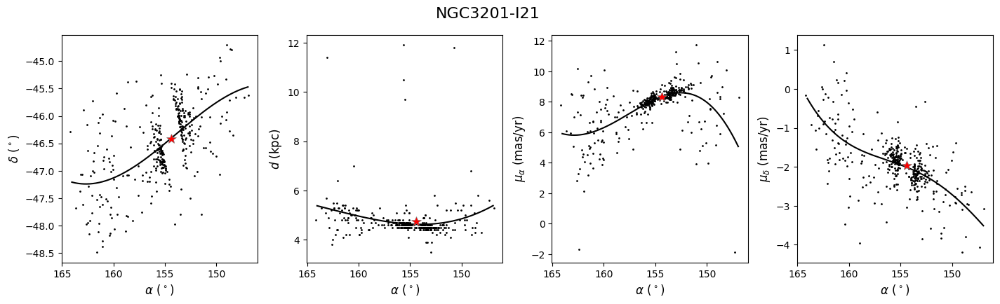

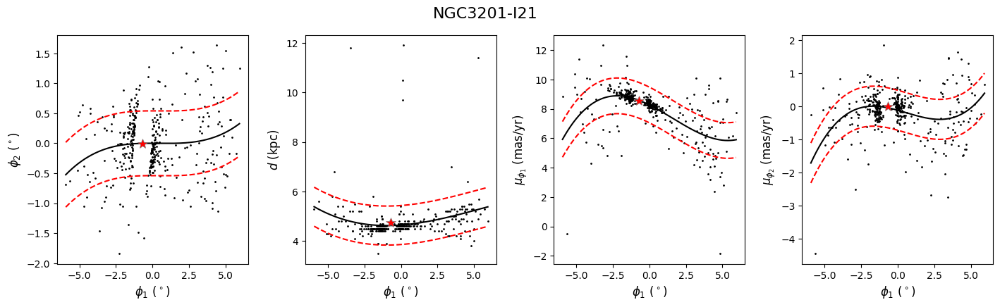

In [14]:
glob_st = glob_g.transform_to(mwsts['NGC3201-I21'].stream_frame)

NGC3201_I21 = I21[I21.StreamName=='NGC3201']

NGC3201_I21_g = ac.SkyCoord(ra=np.array(NGC3201_I21.ra_epoch2000)*u.deg,
                                  dec=np.array(NGC3201_I21.dec_epoch2000)*u.deg,
                                  distance=np.array(NGC3201_I21.dis)*u.kpc,
                                  pm_ra_cosdec=np.array(NGC3201_I21.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(NGC3201_I21.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC3201_I21.pmdec))*u.km/u.s)
    
NGC3201_I21_c = NGC3201_I21_g.transform_to(mwsts['NGC3201-I21'].stream_frame)

fphi2 = interp1d(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1.value, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1.value, mwsts['NGC3201-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1.value, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1.value, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC3201_I21_c.phi1.value)-NGC3201_I21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC3201_I21_c.phi1.value)-NGC3201_I21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(NGC3201_I21_c.phi1.value)-NGC3201_I21_c.pm_phi2.value))
print('width_dist:',np.std(fd(NGC3201_I21_c.phi1.value)-NGC3201_I21_g.distance.value))

widths.loc['NGC3201-I21'].width_phi2 = np.std(fphi2(NGC3201_I21_c.phi1.value)-NGC3201_I21_c.phi2.value)
widths.loc['NGC3201-I21'].width_dist = np.std(fd(NGC3201_I21_c.phi1.value)-NGC3201_I21_g.distance.value)
widths.loc['NGC3201-I21'].width_pmphi1 = np.std(fpmphi1(NGC3201_I21_c.phi1.value)-NGC3201_I21_c.pm_phi1_cosphi2.value)
widths.loc['NGC3201-I21'].width_pmphi2 = np.std(fpmphi2(NGC3201_I21_c.phi1.value)-NGC3201_I21_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC3201-I21'].track.ra, mwsts['NGC3201-I21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(NGC3201_I21_g.ra, NGC3201_I21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC3201-I21'].track.ra, mwsts['NGC3201-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(NGC3201_I21_g.ra, NGC3201_I21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC3201-I21'].track.ra, mwsts['NGC3201-I21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(NGC3201_I21_g.ra, NGC3201_I21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC3201-I21'].track.ra, mwsts['NGC3201-I21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(NGC3201_I21_g.ra, NGC3201_I21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC3201-I21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC3201_I21_c.phi1, NGC3201_I21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi2 + n*widths.loc['NGC3201-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi2 - n*widths.loc['NGC3201-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC3201_I21_c.phi1, NGC3201_I21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.distance + n*widths.loc['NGC3201-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.distance - n*widths.loc['NGC3201-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC3201_I21_c.phi1, NGC3201_I21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC3201-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC3201-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC3201_I21_c.phi1, NGC3201_I21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).pm_phi2 + n*widths.loc['NGC3201-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).phi1, mwsts['NGC3201-I21'].track.transform_to(mwsts['NGC3201-I21'].stream_frame).pm_phi2 - n*widths.loc['NGC3201-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC3201-I21',fontsize=16);

width_phi2: 0.6825662211700942
width_pmphi1: 0.6470036513351887
width_pmphi2: 0.39889854253670054
width_dist: 2.8024748832087325


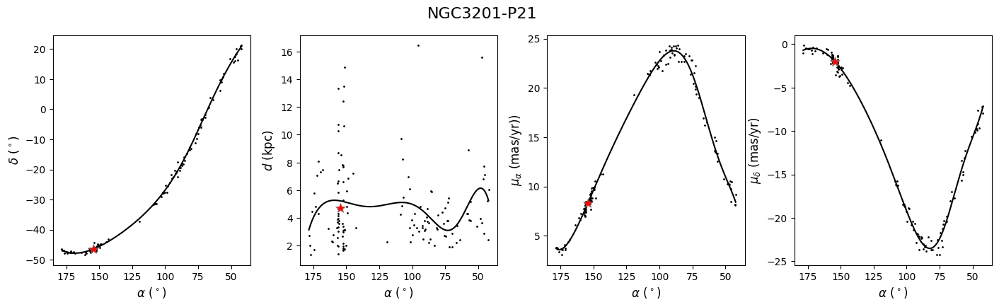

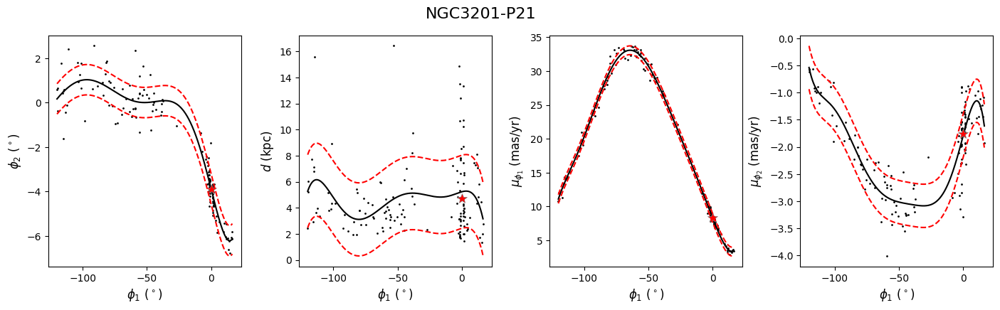

In [15]:
glob_st = glob_g.transform_to(mwsts['NGC3201-P21'].stream_frame)


NGC3201_P21 = NGC3201_P21[NGC3201_P21.parallax>0.05]

NGC3201_P21_g = ac.SkyCoord(ra=np.array(NGC3201_P21.ra)*u.deg,
                                  dec=np.array(NGC3201_P21.dec)*u.deg,
                                  distance=np.array(1/NGC3201_P21.parallax)*u.kpc,
                                  pm_ra_cosdec=np.array(NGC3201_P21.muracosdec)*u.mas/u.yr,
                                  pm_dec=np.array(NGC3201_P21.mudec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC3201_P21.mudec))*u.km/u.s)
    
NGC3201_P21_c = NGC3201_P21_g.transform_to(mwsts['NGC3201-P21'].stream_frame)

fphi2 = interp1d(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1.value, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1.value, mwsts['NGC3201-P21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1.value, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1.value, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC3201_P21_c.phi1.value)-NGC3201_P21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC3201_P21_c.phi1.value)-NGC3201_P21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(NGC3201_P21_c.phi1.value)-NGC3201_P21_c.pm_phi2.value))
print('width_dist:',np.std(fd(NGC3201_P21_c.phi1.value)-NGC3201_P21_g.distance.value))

widths.loc['NGC3201-P21'].width_phi2 = np.std(fphi2(NGC3201_P21_c.phi1.value)-NGC3201_P21_c.phi2.value)
widths.loc['NGC3201-P21'].width_dist = np.std(fd(NGC3201_P21_c.phi1.value)-NGC3201_P21_g.distance.value)
widths.loc['NGC3201-P21'].width_pmphi1 = np.std(fpmphi1(NGC3201_P21_c.phi1.value)-NGC3201_P21_c.pm_phi1_cosphi2.value)
widths.loc['NGC3201-P21'].width_pmphi2 = np.std(fpmphi2(NGC3201_P21_c.phi1.value)-NGC3201_P21_c.pm_phi2.value)

fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC3201-P21'].track.ra, mwsts['NGC3201-P21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(NGC3201_P21_g.ra, NGC3201_P21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC3201-P21'].track.ra, mwsts['NGC3201-P21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(NGC3201_P21_g.ra, NGC3201_P21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC3201-P21'].track.ra, mwsts['NGC3201-P21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(NGC3201_P21_g.ra, NGC3201_P21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr))',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC3201-P21'].track.ra, mwsts['NGC3201-P21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(NGC3201_P21_g.ra, NGC3201_P21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC3201-P21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC3201_P21_c.phi1, NGC3201_P21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi2 + n*widths.loc['NGC3201-P21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi2 - n*widths.loc['NGC3201-P21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC3201_P21_c.phi1, NGC3201_P21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.distance + n*widths.loc['NGC3201-P21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.distance - n*widths.loc['NGC3201-P21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC3201_P21_c.phi1, NGC3201_P21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC3201-P21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC3201-P21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC3201_P21_c.phi1, NGC3201_P21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).pm_phi2 + n*widths.loc['NGC3201-P21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).phi1, mwsts['NGC3201-P21'].track.transform_to(mwsts['NGC3201-P21'].stream_frame).pm_phi2 - n*widths.loc['NGC3201-P21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC3201-P21',fontsize=16);

## M2

In [16]:
globs_ = globs[globs['Name'] == 'NGC 7089']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_7089']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=(float(globs_d_.Rsun.values[0])+0.003)*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

width_phi2: 0.8189209596035613
width_pmphi1: 0.18611898095470464
width_pmphi2: 0.18063163729513346
width_dist: 5.370032462323904e-15


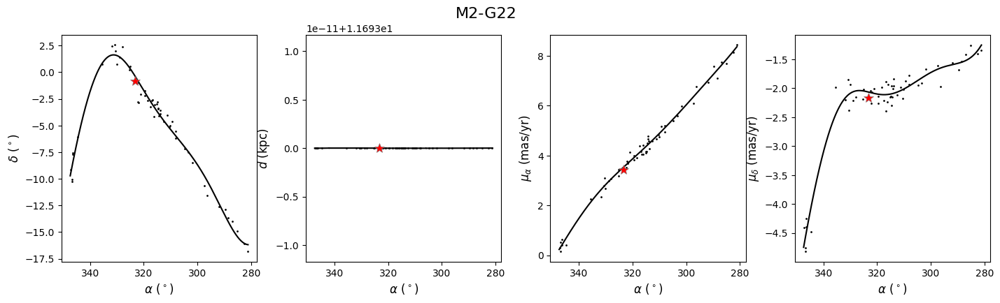

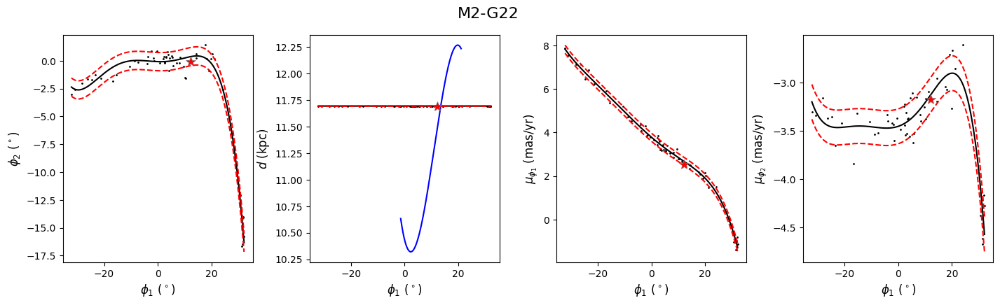

In [17]:
glob_st = glob_g.transform_to(mwsts['M2-G22'].stream_frame)

M2_G22 = M2_G22[M2_G22.weight>0.2]

M2_G22_g = ac.SkyCoord(ra=M2_G22.RA_2016*u.deg,
                          dec=M2_G22.DEC_2016*u.deg,
                          distance=11.693*np.ones(len(M2_G22.pm_dec))*u.kpc,
                          pm_ra_cosdec=M2_G22.pm_ra_cosdec*u.mas/u.yr,
                          pm_dec=M2_G22.pm_dec*u.mas/u.yr,
                          radial_velocity=np.zeros(len(M2_G22.pm_dec))*u.km/u.s)
    
M2_G22_c = M2_G22_g.transform_to(mwsts['M2-G22'].stream_frame)

fphi2 = interp1d(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1.value, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1.value, mwsts['M2-G22'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1.value, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1.value, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(M2_G22_c.phi1.value)-M2_G22_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(M2_G22_c.phi1.value)-M2_G22_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(M2_G22_c.phi1.value)-M2_G22_c.pm_phi2.value))
print('width_dist:',np.std(fd(M2_G22_c.phi1.value)-M2_G22_g.distance.value))

widths.loc['M2-G22'].width_phi2 = np.std(fphi2(M2_G22_c.phi1.value)-M2_G22_c.phi2.value)
widths.loc['M2-G22'].width_dist = np.std(fd(M2_G22_c.phi1.value)-M2_G22_g.distance.value)
widths.loc['M2-G22'].width_pmphi1 = np.std(fpmphi1(M2_G22_c.phi1.value)-M2_G22_c.pm_phi1_cosphi2.value)
widths.loc['M2-G22'].width_pmphi2 = np.std(fpmphi2(M2_G22_c.phi1.value)-M2_G22_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['M2-G22'].track.ra, mwsts['M2-G22'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(M2_G22_g.ra, M2_G22_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['M2-G22'].track.ra, mwsts['M2-G22'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(M2_G22_g.ra, M2_G22_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['M2-G22'].track.ra, mwsts['M2-G22'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(M2_G22_g.ra, M2_G22_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['M2-G22'].track.ra, mwsts['M2-G22'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(M2_G22_g.ra, M2_G22_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('M2-G22',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(M2_G22_c.phi1, M2_G22_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi2 + n*widths.loc['M2-G22'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi2 - n*widths.loc['M2-G22'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-I21'].track.distance,'-b', lw=1.5, zorder=99)
ax2.plot(M2_G22_c.phi1, M2_G22_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.distance + n*widths.loc['M2-G22'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.distance - n*widths.loc['M2-G22'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(M2_G22_c.phi1, M2_G22_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['M2-G22'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['M2-G22'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(M2_G22_c.phi1, M2_G22_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).pm_phi2 + n*widths.loc['M2-G22'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).phi1, mwsts['M2-G22'].track.transform_to(mwsts['M2-G22'].stream_frame).pm_phi2 - n*widths.loc['M2-G22'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('M2-G22',fontsize=16);

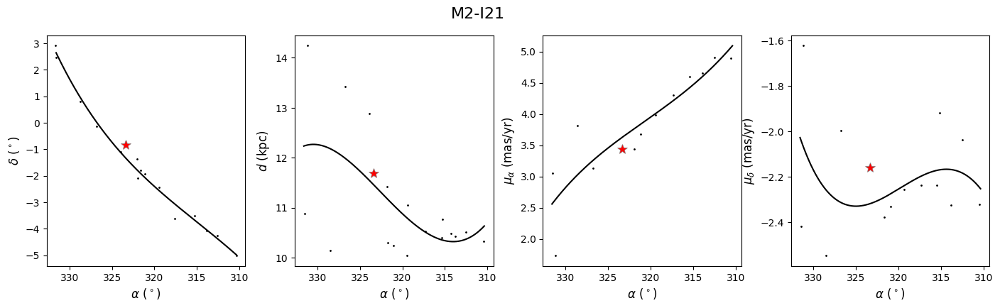

In [18]:
fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['M2-I21'].track.ra, mwsts['M2-I21'].track.dec,'-k', lw=1.5)
ax.plot(M2_I21radec[0],M2_I21radec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['M2-I21'].track.ra, mwsts['M2-I21'].track.distance,'-k', lw=1.5)
ax.plot(M2_I21rad[0],M2_I21rad[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['M2-I21'].track.ra, mwsts['M2-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(M2_I21rapmra[0],M2_I21rapmra[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['M2-I21'].track.ra, mwsts['M2-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(M2_I21rapmdec[0],M2_I21rapmdec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('M2-I21',fontsize=16);


width_phi2: 0.2181361374124675
width_pmphi1: 0.37850554912405293
width_pmphi2: 0.21465967805135985
width_dist: 0.9761900108490028


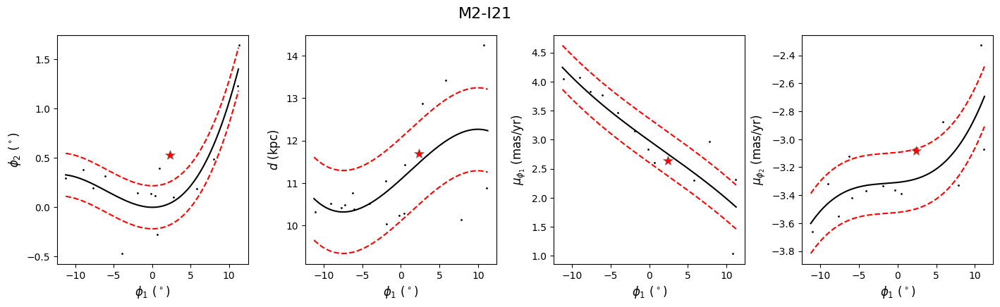

In [19]:
glob_st = glob_g.transform_to(mwsts['M2-I21'].stream_frame)

def model1(phi1, a, b, c, d):
    return a + b*(phi1) + c*(phi1)**2 + d*(phi1)**3

params_radec, _ = curve_fit(model1, mwsts['M2-I21'].track.ra.value, mwsts['M2-I21'].track.dec.value, maxfev=5000)
params_rad, _ = curve_fit(model1, mwsts['M2-I21'].track.ra.value, mwsts['M2-I21'].track.distance.value, maxfev=5000)
params_rapmra, _ = curve_fit(model1, mwsts['M2-I21'].track.ra.value, mwsts['M2-I21'].track.pm_ra_cosdec.value, maxfev=5000)
params_rapmdec, _ = curve_fit(model1, mwsts['M2-I21'].track.ra.value, mwsts['M2-I21'].track.pm_dec.value, maxfev=5000)

decd = model1(M2_I21rad[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmra = model1(M2_I21rapmra[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmdec = model1(M2_I21rapmdec[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])

ddec = model1(M2_I21radec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmra = model1(M2_I21rapmra[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmdec = model1(M2_I21rapmdec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])

pmradec = model1(M2_I21radec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrad = model1(M2_I21rad[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrapmdec = model1(M2_I21rapmdec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])

pmdecdec = model1(M2_I21radec[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecd = model1(M2_I21rad[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecpmra = model1(M2_I21rapmra[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])


M2_radec_g = ac.SkyCoord(ra=M2_I21radec[0].values*u.deg,
                              dec=M2_I21radec[1].values*u.deg)
M2_phi12_c = M2_radec_g.transform_to(mwsts['M2-I21'].stream_frame)



M2_rapmra_g = ac.SkyCoord(ra=M2_I21rapmra[0].values*u.deg,
                                  dec=decpmra*u.deg,
                                  pm_ra_cosdec=M2_I21rapmra[1].values*u.mas/u.yr,
                                  pm_dec=pmdecpmra*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(M2_I21rapmra[0]))*u.km/u.s)  
M2_phi1pmphi1_c = M2_rapmra_g.transform_to(mwsts['M2-I21'].stream_frame)



M2_rapmdec_g = ac.SkyCoord(ra=M2_I21rapmdec[0].values*u.deg,
                                  dec=decpmdec*u.deg,
                                  pm_ra_cosdec=pmrapmdec*u.mas/u.yr,
                                  pm_dec=M2_I21rapmdec[1].values*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(M2_I21rapmdec[0]))*u.km/u.s)  
M2_phi1pmphi2_c = M2_rapmdec_g.transform_to(mwsts['M2-I21'].stream_frame)



M2_rad_g = ac.SkyCoord(ra=M2_I21rad[0].values*u.deg,
                            dec=decd*u.deg,
                            distance=M2_I21rad[1].values*u.kpc)
    
M2_phi1d_c = M2_rad_g.transform_to(mwsts['M2-I21'].stream_frame)


fphi2 = interp1d(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1.value, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1.value, mwsts['M2-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1.value, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1.value, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(M2_phi12_c.phi1.value)-M2_phi12_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(M2_phi1pmphi1_c.phi1.value)-M2_phi1pmphi1_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(M2_phi1pmphi2_c.phi1.value)-M2_phi1pmphi2_c.pm_phi2.value))
print('width_dist:',np.std(fd(M2_phi1d_c.phi1.value)-M2_I21rad[1]))

widths.loc['M2-I21'].width_phi2 = np.std(fphi2(M2_phi12_c.phi1.value)-M2_phi12_c.phi2.value)
widths.loc['M2-I21'].width_dist = np.std(fd(M2_phi1d_c.phi1.value)-M2_I21rad[1])
widths.loc['M2-I21'].width_pmphi1 = np.std(fpmphi1(M2_phi1pmphi1_c.phi1.value)-M2_phi1pmphi1_c.pm_phi1_cosphi2.value)
widths.loc['M2-I21'].width_pmphi2 = np.std(fpmphi2(M2_phi1pmphi2_c.phi1.value)-M2_phi1pmphi2_c.pm_phi2.value)


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(M2_phi12_c.phi1, M2_phi12_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi2 + n*widths.loc['M2-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi2 - n*widths.loc['M2-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(M2_phi1d_c.phi1, M2_phi1d_c.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.distance + n*widths.loc['M2-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.distance - n*widths.loc['M2-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(M2_phi1pmphi1_c.phi1, M2_phi1pmphi1_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['M2-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['M2-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(M2_phi1pmphi2_c.phi1, M2_phi1pmphi2_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).pm_phi2 + n*widths.loc['M2-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).phi1, mwsts['M2-I21'].track.transform_to(mwsts['M2-I21'].stream_frame).pm_phi2 - n*widths.loc['M2-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('M2-I21',fontsize=16);

## M5

In [20]:
globs_ = globs[globs['Name'] == 'NGC 5904']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_5904']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

width_phi2: 1.1622487199308948
width_pmphi1: 0.49754754124707173
width_pmphi2: 0.38390770333649904
width_dist: 0.06374546017052807


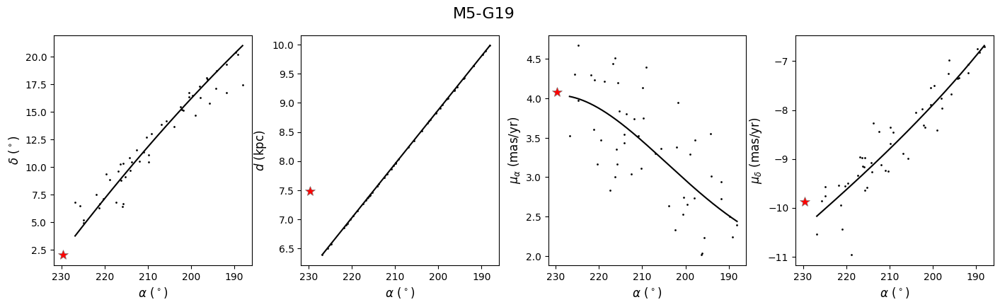

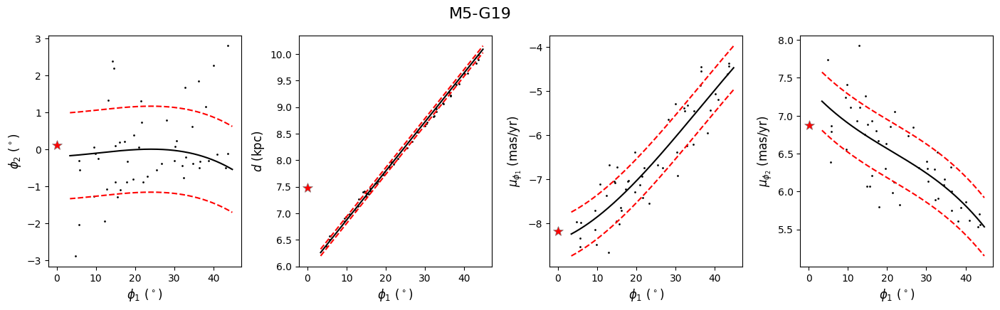

In [21]:
glob_st = glob_g.transform_to(mwsts['M5-G19'].stream_frame)


M5_G19_g = ac.SkyCoord(ra=M5_G19.ra_dr2*u.deg,
                          dec=M5_G19.dec_dr2*u.deg,
                          distance=((15-7.3)/(134-217)*(M5_G19.ra_dr2-217)+7.3)*u.kpc, #Orbit prediction
                          pm_ra_cosdec=M5_G19.pm_ra_cosdec*u.mas/u.yr,
                          pm_dec=M5_G19.pm_dec*u.mas/u.yr,
                          radial_velocity=np.zeros(len(M5_G19.pm_dec))*u.km/u.s)
    
M5_G19_c = M5_G19_g.transform_to(mwsts['M5-G19'].stream_frame)

fphi2 = interp1d(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1.value, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1.value, (max(M5_G19_c.distance.value)-min(M5_G19_c.distance.value))/(max(M5_G19_c.phi1.value) - min(M5_G19_c.phi1.value))*(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1.value - max(M5_G19_c.phi1.value)) + max(M5_G19_c.distance.value), fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1.value, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1.value, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(M5_G19_c.phi1.value)-M5_G19_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(M5_G19_c.phi1.value)-M5_G19_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(M5_G19_c.phi1.value)-M5_G19_c.pm_phi2.value))
print('width_dist:',np.std(fd(M5_G19_c.phi1.value)-M5_G19_g.distance.value))

widths.loc['M5-G19'].width_phi2 = np.std(fphi2(M5_G19_c.phi1.value)-M5_G19_c.phi2.value)
widths.loc['M5-G19'].width_dist = np.std(fd(M5_G19_c.phi1.value)-M5_G19_g.distance.value)
widths.loc['M5-G19'].width_pmphi1 = np.std(fpmphi1(M5_G19_c.phi1.value)-M5_G19_c.pm_phi1_cosphi2.value)
widths.loc['M5-G19'].width_pmphi2 = np.std(fpmphi2(M5_G19_c.phi1.value)-M5_G19_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['M5-G19'].track.ra, mwsts['M5-G19'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(M5_G19_g.ra, M5_G19_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['M5-G19'].track.ra, ((15-7.3)/(134-217)*(mwsts['M5-G19'].track.ra.value-217)+7.3),'-k', lw=1.5, zorder=99) #en galstreams la pendiente está al reves
ax.plot(M5_G19_g.ra, M5_G19_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['M5-G19'].track.ra, mwsts['M5-G19'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(M5_G19_g.ra, M5_G19_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['M5-G19'].track.ra, mwsts['M5-G19'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(M5_G19_g.ra, M5_G19_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('M5-G19',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(M5_G19_c.phi1, M5_G19_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi1, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi2 + n*widths.loc['M5-G19'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi2 - n*widths.loc['M5-G19'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, (max(M5_G19_c.distance.value)-min(M5_G19_c.distance.value))/(max(M5_G19_c.phi1.value) - min(M5_G19_c.phi1.value))*(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1.value - max(M5_G19_c.phi1.value)) + max(M5_G19_c.distance.value),'-k', lw=1.5, zorder=99)
ax2.plot(M5_G19_c.phi1, M5_G19_c.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, (max(M5_G19_c.distance.value)-min(M5_G19_c.distance.value))/(max(M5_G19_c.phi1.value) - min(M5_G19_c.phi1.value))*(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1.value - max(M5_G19_c.phi1.value)) + max(M5_G19_c.distance.value) + n*widths.loc['M5-G19'].width_dist/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, (max(M5_G19_c.distance.value)-min(M5_G19_c.distance.value))/(max(M5_G19_c.phi1.value) - min(M5_G19_c.phi1.value))*(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1.value - max(M5_G19_c.phi1.value)) + max(M5_G19_c.distance.value) - n*widths.loc['M5-G19'].width_dist/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(M5_G19_c.phi1, M5_G19_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['M5-G19'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['M5-G19'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(M5_G19_c.phi1, M5_G19_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).pm_phi2 + n*widths.loc['M5-G19'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).phi1, mwsts['M5-G19'].track.transform_to(mwsts['M5-G19'].stream_frame).pm_phi2 - n*widths.loc['M5-G19'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('M5-G19',fontsize=16);

width_phi2: 0.4156991346060395
width_pmphi1: 0.8162151346699182
width_pmphi2: 0.9104666455961747
width_dist: 0.60876216697687


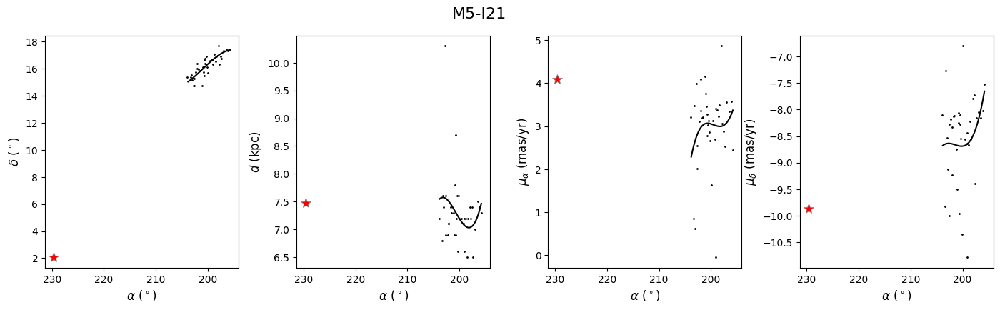

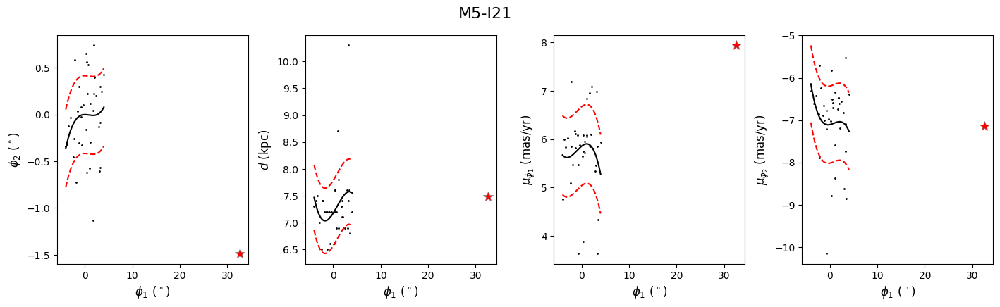

In [22]:
glob_st = glob_g.transform_to(mwsts['M5-I21'].stream_frame)


M5_I21 = I21[I21.StreamName=='M5']

M5_I21_g = ac.SkyCoord(ra=np.array(M5_I21.ra_epoch2000)*u.deg,
                                  dec=np.array(M5_I21.dec_epoch2000)*u.deg,
                                  distance=np.array(M5_I21.dis)*u.kpc,
                                  pm_ra_cosdec=np.array(M5_I21.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(M5_I21.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(M5_I21.pmdec))*u.km/u.s)
    
M5_I21_c = M5_I21_g.transform_to(mwsts['M5-I21'].stream_frame)

fphi2 = interp1d(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1.value, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1.value, mwsts['M5-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1.value, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1.value, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(M5_I21_c.phi1.value)-M5_I21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(M5_I21_c.phi1.value)-M5_I21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(M5_I21_c.phi1.value)-M5_I21_c.pm_phi2.value))
print('width_dist:',np.std(fd(M5_I21_c.phi1.value)-M5_I21_g.distance.value))

widths.loc['M5-I21'].width_phi2 = np.std(fphi2(M5_I21_c.phi1.value)-M5_I21_c.phi2.value)
widths.loc['M5-I21'].width_dist = np.std(fd(M5_I21_c.phi1.value)-M5_I21_g.distance.value)
widths.loc['M5-I21'].width_pmphi1 = np.std(fpmphi1(M5_I21_c.phi1.value)-M5_I21_c.pm_phi1_cosphi2.value)
widths.loc['M5-I21'].width_pmphi2 = np.std(fpmphi2(M5_I21_c.phi1.value)-M5_I21_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['M5-I21'].track.ra, mwsts['M5-I21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(M5_I21_g.ra, M5_I21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['M5-I21'].track.ra, mwsts['M5-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(M5_I21_g.ra, M5_I21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['M5-I21'].track.ra, mwsts['M5-I21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(M5_I21_g.ra, M5_I21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['M5-I21'].track.ra, mwsts['M5-I21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(M5_I21_g.ra, M5_I21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('M5-I21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(M5_I21_c.phi1, M5_I21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi2 + n*widths.loc['M5-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi2 - n*widths.loc['M5-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(M5_I21_c.phi1, M5_I21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.distance + n*widths.loc['M5-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.distance - n*widths.loc['M5-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(M5_I21_c.phi1, M5_I21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['M5-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['M5-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(M5_I21_c.phi1, M5_I21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).pm_phi2 + n*widths.loc['M5-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).phi1, mwsts['M5-I21'].track.transform_to(mwsts['M5-I21'].stream_frame).pm_phi2 - n*widths.loc['M5-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('M5-I21',fontsize=16);

## M92

In [23]:
globs_ = globs[globs['Name'] == 'NGC 6341']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_6341']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

width_phi2: 1.4085896692390136
width_pmphi1: 0.8089472969508853
width_pmphi2: 0.7716836331565378
width_dist: 1.4305203160991102


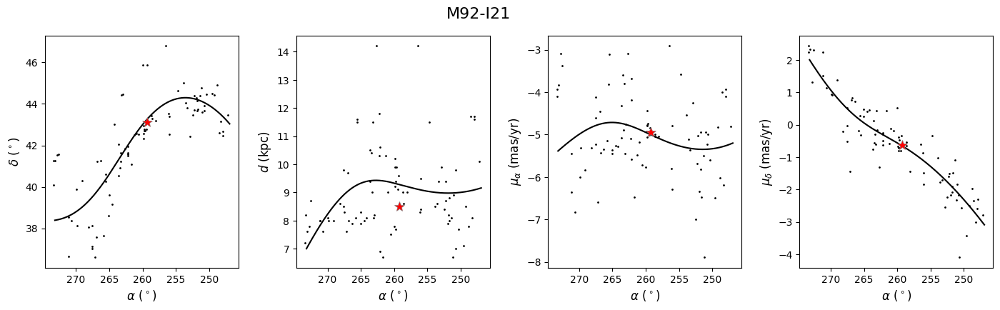

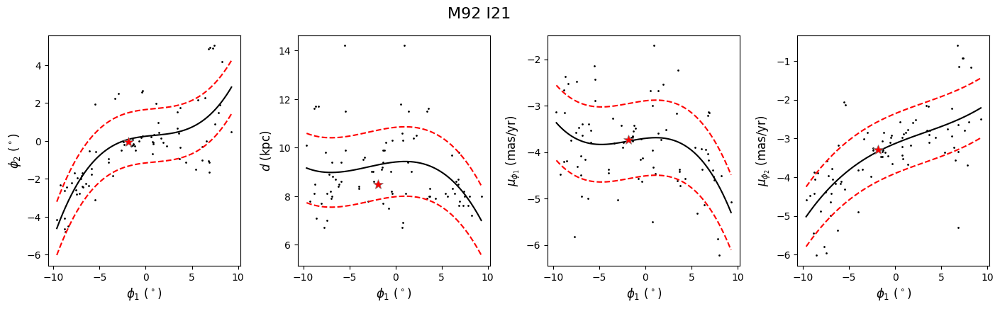

In [24]:
glob_st = glob_g.transform_to(mwsts['M92-I21'].stream_frame)

M92_I21 = I21[I21.StreamName=='M92']

M92_I21_g = ac.SkyCoord(ra=np.array(M92_I21.ra_epoch2000)*u.deg,
                                  dec=np.array(M92_I21.dec_epoch2000)*u.deg,
                                  distance=np.array(M92_I21.dis)*u.kpc,
                                  pm_ra_cosdec=np.array(M92_I21.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(M92_I21.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(M92_I21.pmdec))*u.km/u.s)
    
M92_I21_c = M92_I21_g.transform_to(mwsts['M92-I21'].stream_frame)

fphi2 = interp1d(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1.value, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1.value, mwsts['M92-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1.value, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1.value, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(M92_I21_c.phi1.value)-M92_I21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(M92_I21_c.phi1.value)-M92_I21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(M92_I21_c.phi1.value)-M92_I21_c.pm_phi2.value))
print('width_dist:',np.std(fd(M92_I21_c.phi1.value)-M92_I21_g.distance.value))

widths.loc['M92-I21'].width_phi2 = np.std(fphi2(M92_I21_c.phi1.value)-M92_I21_c.phi2.value)
widths.loc['M92-I21'].width_dist = np.std(fd(M92_I21_c.phi1.value)-M92_I21_g.distance.value)
widths.loc['M92-I21'].width_pmphi1 = np.std(fpmphi1(M92_I21_c.phi1.value)-M92_I21_c.pm_phi1_cosphi2.value)
widths.loc['M92-I21'].width_pmphi2 = np.std(fpmphi2(M92_I21_c.phi1.value)-M92_I21_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['M92-I21'].track.ra, mwsts['M92-I21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(M92_I21_g.ra, M92_I21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['M92-I21'].track.ra, mwsts['M92-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(M92_I21_g.ra, M92_I21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['M92-I21'].track.ra, mwsts['M92-I21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(M92_I21_g.ra, M92_I21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['M92-I21'].track.ra, mwsts['M92-I21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(M92_I21_g.ra, M92_I21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('M92-I21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(M92_I21_c.phi1, M92_I21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi2 + n*widths.loc['M92-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi2 - n*widths.loc['M92-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(M92_I21_c.phi1, M92_I21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.distance + n*widths.loc['M92-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.distance - n*widths.loc['M92-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(M92_I21_c.phi1, M92_I21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['M92-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['M92-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(M92_I21_c.phi1, M92_I21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).pm_phi2 + n*widths.loc['M92-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).phi1, mwsts['M92-I21'].track.transform_to(mwsts['M92-I21'].stream_frame).pm_phi2 - n*widths.loc['M92-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('M92 I21',fontsize=16);

## NGC 1261

In [25]:
globs_ = globs[globs['Name'] == 'NGC 1261']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_1261']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

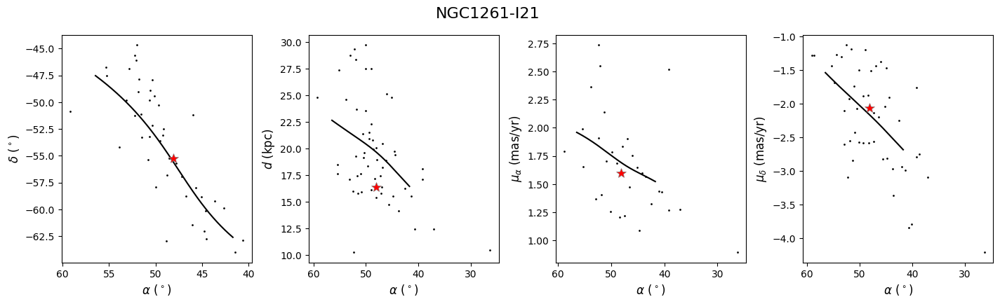

In [26]:
fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC1261-I21'].track.ra, mwsts['NGC1261-I21'].track.dec,'-k', lw=1.5)
ax.plot(NGC1261_I21radec[0],NGC1261_I21radec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC1261-I21'].track.ra, mwsts['NGC1261-I21'].track.distance,'-k', lw=1.5)
ax.plot(NGC1261_I21rad[0],NGC1261_I21rad[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC1261-I21'].track.ra, mwsts['NGC1261-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(NGC1261_I21rapmra[0],NGC1261_I21rapmra[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC1261-I21'].track.ra, mwsts['NGC1261-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(NGC1261_I21rapmdec[0],NGC1261_I21rapmdec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC1261-I21',fontsize=16);

width_phi2: 1.8068518489047718
width_pmphi1: 0.13592366408345447
width_pmphi2: 0.2069226843421819
width_dist: 4.3730662480048785


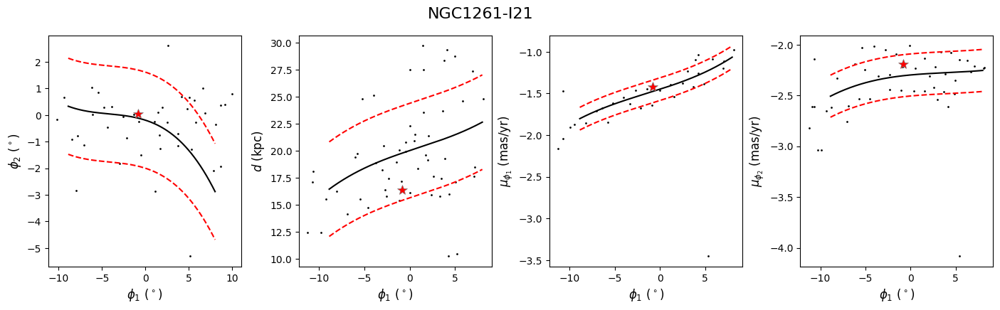

In [27]:
glob_st = glob_g.transform_to(mwsts['NGC1261-I21'].stream_frame)

def model1(phi1, a, b, c, d):
    return a + b*(phi1) + c*(phi1)**2 + d*(phi1)**3

params_radec, _ = curve_fit(model1, mwsts['NGC1261-I21'].track.ra.value, mwsts['NGC1261-I21'].track.dec.value, maxfev=5000)
params_rad, _ = curve_fit(model1, mwsts['NGC1261-I21'].track.ra.value, mwsts['NGC1261-I21'].track.distance.value, maxfev=5000)
params_rapmra, _ = curve_fit(model1, mwsts['NGC1261-I21'].track.ra.value, mwsts['NGC1261-I21'].track.pm_ra_cosdec.value, maxfev=5000)
params_rapmdec, _ = curve_fit(model1, mwsts['NGC1261-I21'].track.ra.value, mwsts['NGC1261-I21'].track.pm_dec.value, maxfev=5000)

decd = model1(NGC1261_I21rad[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmra = model1(NGC1261_I21rapmra[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmdec = model1(NGC1261_I21rapmdec[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])

ddec = model1(NGC1261_I21radec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmra = model1(NGC1261_I21rapmra[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmdec = model1(NGC1261_I21rapmdec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])

pmradec = model1(NGC1261_I21radec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrad = model1(NGC1261_I21rad[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrapmdec = model1(NGC1261_I21rapmdec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])

pmdecdec = model1(NGC1261_I21radec[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecd = model1(NGC1261_I21rad[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecpmra = model1(NGC1261_I21rapmra[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])


NGC1261_radec_g = ac.SkyCoord(ra=NGC1261_I21radec[0].values*u.deg,
                              dec=NGC1261_I21radec[1].values*u.deg)
NGC1261_phi12_c = NGC1261_radec_g.transform_to(mwsts['NGC1261-I21'].stream_frame)



NGC1261_rapmra_g = ac.SkyCoord(ra=NGC1261_I21rapmra[0].values*u.deg,
                                  dec=decpmra*u.deg,
                                  pm_ra_cosdec=NGC1261_I21rapmra[1].values*u.mas/u.yr,
                                  pm_dec=pmdecpmra*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC1261_I21rapmra[0]))*u.km/u.s)  
NGC1261_phi1pmphi1_c = NGC1261_rapmra_g.transform_to(mwsts['NGC1261-I21'].stream_frame)



NGC1261_rapmdec_g = ac.SkyCoord(ra=NGC1261_I21rapmdec[0].values*u.deg,
                                  dec=decpmdec*u.deg,
                                  pm_ra_cosdec=pmrapmdec*u.mas/u.yr,
                                  pm_dec=NGC1261_I21rapmdec[1].values*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC1261_I21rapmdec[0]))*u.km/u.s)  
NGC1261_phi1pmphi2_c = NGC1261_rapmdec_g.transform_to(mwsts['NGC1261-I21'].stream_frame)



NGC1261_rad_g = ac.SkyCoord(ra=NGC1261_I21rad[0].values*u.deg,
                            dec=decd*u.deg,
                            distance=NGC1261_I21rad[1].values*u.kpc)
    
NGC1261_phi1d_c = NGC1261_rad_g.transform_to(mwsts['NGC1261-I21'].stream_frame)


fphi2 = interp1d(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1.value, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1.value, mwsts['NGC1261-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1.value, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1.value, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC1261_phi12_c.phi1.value)-NGC1261_phi12_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC1261_phi1pmphi1_c.phi1.value)[NGC1261_phi1pmphi1_c.pm_phi1_cosphi2.value>-3.]-NGC1261_phi1pmphi1_c.pm_phi1_cosphi2.value[NGC1261_phi1pmphi1_c.pm_phi1_cosphi2.value>-3.]))
print('width_pmphi2:',np.std(fpmphi2(NGC1261_phi1pmphi2_c.phi1.value)[NGC1261_phi1pmphi2_c.pm_phi2.value>-3.5]-NGC1261_phi1pmphi2_c.pm_phi2.value[NGC1261_phi1pmphi2_c.pm_phi2.value>-3.5]))
print('width_dist:',np.std(fd(NGC1261_phi1d_c.phi1.value)-NGC1261_I21rad[1]))

widths.loc['NGC1261-I21'].width_phi2 = np.std(fphi2(NGC1261_phi12_c.phi1.value)-NGC1261_phi12_c.phi2.value)
widths.loc['NGC1261-I21'].width_dist = np.std(fd(NGC1261_phi1d_c.phi1.value)-NGC1261_I21rad[1])
widths.loc['NGC1261-I21'].width_pmphi1 = np.std(fpmphi1(NGC1261_phi1pmphi1_c.phi1.value)[NGC1261_phi1pmphi1_c.pm_phi1_cosphi2.value>-3.]-NGC1261_phi1pmphi1_c.pm_phi1_cosphi2.value[NGC1261_phi1pmphi1_c.pm_phi1_cosphi2.value>-3.])
widths.loc['NGC1261-I21'].width_pmphi2 = np.std(fpmphi2(NGC1261_phi1pmphi2_c.phi1.value)[NGC1261_phi1pmphi2_c.pm_phi2.value>-3.5]-NGC1261_phi1pmphi2_c.pm_phi2.value[NGC1261_phi1pmphi2_c.pm_phi2.value>-3.5])


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC1261_phi12_c.phi1, NGC1261_phi12_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi2 + n*widths.loc['NGC1261-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi2 - n*widths.loc['NGC1261-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC1261_phi1d_c.phi1, NGC1261_phi1d_c.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.distance + n*widths.loc['NGC1261-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.distance - n*widths.loc['NGC1261-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC1261_phi1pmphi1_c.phi1, NGC1261_phi1pmphi1_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC1261-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC1261-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC1261_phi1pmphi2_c.phi1, NGC1261_phi1pmphi2_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).pm_phi2 + n*widths.loc['NGC1261-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).phi1, mwsts['NGC1261-I21'].track.transform_to(mwsts['NGC1261-I21'].stream_frame).pm_phi2 - n*widths.loc['NGC1261-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC1261-I21',fontsize=16);

## NGC 1851

In [28]:
globs_ = globs[globs['Name'] == 'NGC 1851']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_1851']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

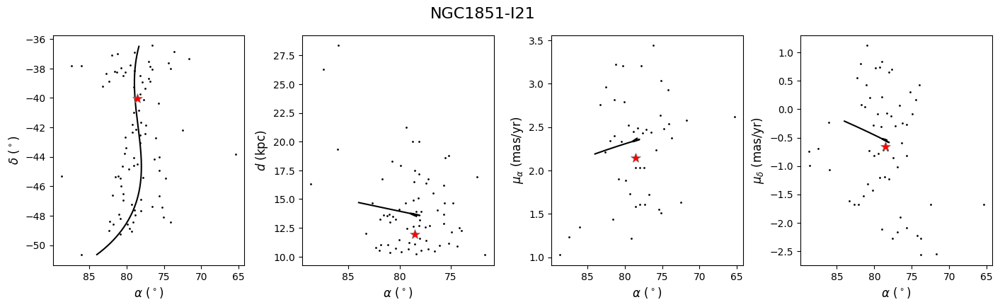

In [29]:
fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC1851-I21'].track.ra, mwsts['NGC1851-I21'].track.dec,'-k', lw=1.5)
ax.plot(NGC1851_I21radec[0],NGC1851_I21radec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC1851-I21'].track.ra, mwsts['NGC1851-I21'].track.distance,'-k', lw=1.5)
ax.plot(NGC1851_I21rad[0],NGC1851_I21rad[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC1851-I21'].track.ra, mwsts['NGC1851-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(NGC1851_I21rapmra[0],NGC1851_I21rapmra[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC1851-I21'].track.ra, mwsts['NGC1851-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(NGC1851_I21rapmdec[0],NGC1851_I21rapmdec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC1851-I21',fontsize=16);

width_phi2: 2.370671664525093
width_pmphi1: 0.07544327512965694
width_pmphi2: 0.0570480350855049
width_dist: 2.9902547282036216


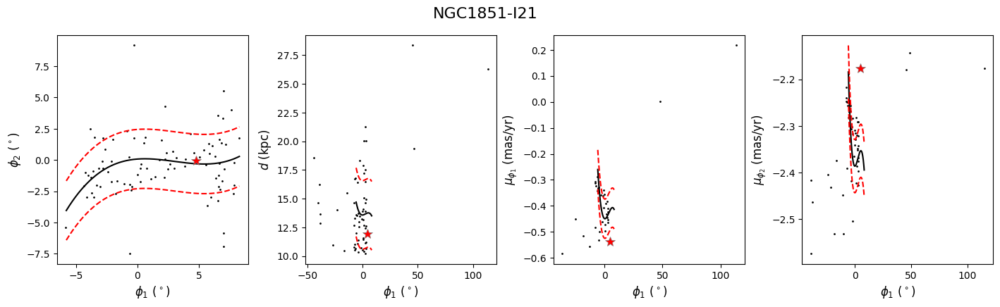

In [30]:
glob_st = glob_g.transform_to(mwsts['NGC1851-I21'].stream_frame)

def model1(phi1, a, b, c, d):
    return a + b*(phi1) + c*(phi1)**2 + d*(phi1)**3

params_radec, _ = curve_fit(model1, mwsts['NGC1851-I21'].track.ra.value, mwsts['NGC1851-I21'].track.dec.value, maxfev=5000)
params_rad, _ = curve_fit(model1, mwsts['NGC1851-I21'].track.ra.value, mwsts['NGC1851-I21'].track.distance.value, maxfev=5000)
params_rapmra, _ = curve_fit(model1, mwsts['NGC1851-I21'].track.ra.value, mwsts['NGC1851-I21'].track.pm_ra_cosdec.value, maxfev=5000)
params_rapmdec, _ = curve_fit(model1, mwsts['NGC1851-I21'].track.ra.value, mwsts['NGC1851-I21'].track.pm_dec.value, maxfev=5000)

decd = model1(NGC1851_I21rad[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmra = model1(NGC1851_I21rapmra[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmdec = model1(NGC1851_I21rapmdec[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])

ddec = model1(NGC1851_I21radec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmra = model1(NGC1851_I21rapmra[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmdec = model1(NGC1851_I21rapmdec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])

pmradec = model1(NGC1851_I21radec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrad = model1(NGC1851_I21rad[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrapmdec = model1(NGC1851_I21rapmdec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])

pmdecdec = model1(NGC1851_I21radec[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecd = model1(NGC1851_I21rad[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecpmra = model1(NGC1851_I21rapmra[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])


NGC1851_radec_g = ac.SkyCoord(ra=NGC1851_I21radec[0].values*u.deg,
                              dec=NGC1851_I21radec[1].values*u.deg)
NGC1851_phi12_c = NGC1851_radec_g.transform_to(mwsts['NGC1851-I21'].stream_frame)



NGC1851_rapmra_g = ac.SkyCoord(ra=NGC1851_I21rapmra[0].values[(decpmra>-90) & (decpmra<90)]*u.deg,
                                  dec=decpmra[(decpmra>-90) & (decpmra<90)]*u.deg,
                                  pm_ra_cosdec=NGC1851_I21rapmra[1].values[(decpmra>-90) & (decpmra<90)]*u.mas/u.yr,
                                  pm_dec=pmdecpmra[(decpmra>-90) & (decpmra<90)]*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC1851_I21rapmra[0][(decpmra>-90) & (decpmra<90)]))*u.km/u.s)  
NGC1851_phi1pmphi1_c = NGC1851_rapmra_g.transform_to(mwsts['NGC1851-I21'].stream_frame)



NGC1851_rapmdec_g = ac.SkyCoord(ra=NGC1851_I21rapmdec[0].values[(decpmdec>-90) & (decpmdec<90)]*u.deg,
                                  dec=decpmdec[(decpmdec>-90) & (decpmdec<90)]*u.deg,
                                  pm_ra_cosdec=pmrapmdec[(decpmdec>-90) & (decpmdec<90)]*u.mas/u.yr,
                                  pm_dec=NGC1851_I21rapmdec[1].values[(decpmdec>-90) & (decpmdec<90)]*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC1851_I21rapmdec[0][(decpmdec>-90) & (decpmdec<90)]))*u.km/u.s)  
NGC1851_phi1pmphi2_c = NGC1851_rapmdec_g.transform_to(mwsts['NGC1851-I21'].stream_frame)



NGC1851_rad_g = ac.SkyCoord(ra=NGC1851_I21rad[0][(decd>-90) & (decd<90)].values*u.deg,
                            dec=decd[(decd>-90) & (decd<90)]*u.deg,
                            distance=NGC1851_I21rad[1].values[(decd>-90) & (decd<90)]*u.kpc)
    
NGC1851_phi1d_c = NGC1851_rad_g.transform_to(mwsts['NGC1851-I21'].stream_frame)


fphi2 = interp1d(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value, mwsts['NGC1851-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC1851_phi12_c.phi1.value)-NGC1851_phi12_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC1851_phi1pmphi1_c.phi1.value[(NGC1851_phi1pmphi1_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1pmphi1_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))])-NGC1851_phi1pmphi1_c.pm_phi1_cosphi2.value[(NGC1851_phi1pmphi1_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1pmphi1_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))]))
print('width_pmphi2:',np.std(fpmphi2(NGC1851_phi1pmphi2_c.phi1.value[(NGC1851_phi1pmphi2_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1pmphi2_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))])-NGC1851_phi1pmphi2_c.pm_phi2.value[(NGC1851_phi1pmphi2_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1pmphi2_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))]))
print('width_dist:',np.std(fd(NGC1851_phi1d_c.phi1.value[(NGC1851_phi1d_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1d_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))])-NGC1851_I21rad[1][(decd>-90) & (decd<90)][(NGC1851_phi1d_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1d_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))]))

widths.loc['NGC1851-I21'].width_phi2 = np.std(fphi2(NGC1851_phi12_c.phi1.value)-NGC1851_phi12_c.phi2.value)
widths.loc['NGC1851-I21'].width_dist = np.std(fd(NGC1851_phi1d_c.phi1.value[(NGC1851_phi1d_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1d_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))])-NGC1851_I21rad[1][(decd>-90) & (decd<90)][(NGC1851_phi1d_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1d_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))])
widths.loc['NGC1851-I21'].width_pmphi1 = np.std(fpmphi1(NGC1851_phi1pmphi1_c.phi1.value[(NGC1851_phi1pmphi1_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1pmphi1_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))])-NGC1851_phi1pmphi1_c.pm_phi1_cosphi2.value[(NGC1851_phi1pmphi1_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1pmphi1_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))])
widths.loc['NGC1851-I21'].width_pmphi2 = np.std(fpmphi2(NGC1851_phi1pmphi2_c.phi1.value[(NGC1851_phi1pmphi2_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1pmphi2_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))])-NGC1851_phi1pmphi2_c.pm_phi2.value[(NGC1851_phi1pmphi2_c.phi1.value>min(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value)) & (NGC1851_phi1pmphi2_c.phi1.value<max(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1.value))])


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC1851_phi12_c.phi1, NGC1851_phi12_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi2 + n*widths.loc['NGC1851-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi2 - n*widths.loc['NGC1851-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC1851_phi1d_c.phi1, NGC1851_phi1d_c.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.distance + n*widths.loc['NGC1851-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.distance - n*widths.loc['NGC1851-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC1851_phi1pmphi1_c.phi1, NGC1851_phi1pmphi1_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC1851-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC1851-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC1851_phi1pmphi2_c.phi1, NGC1851_phi1pmphi2_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).pm_phi2 + n*widths.loc['NGC1851-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).phi1, mwsts['NGC1851-I21'].track.transform_to(mwsts['NGC1851-I21'].stream_frame).pm_phi2 - n*widths.loc['NGC1851-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC1851-I21',fontsize=16);

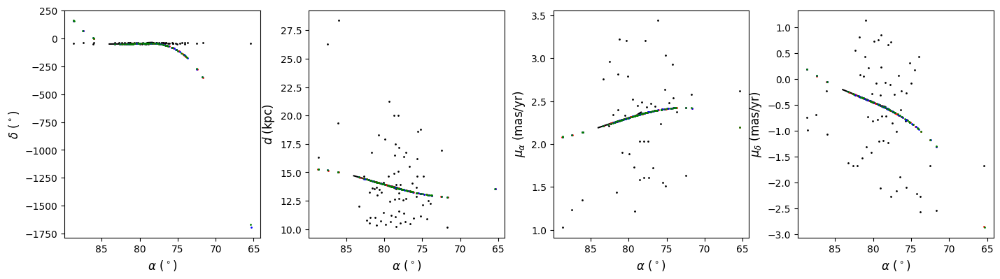

In [31]:
fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC1851-I21'].track.ra, mwsts['NGC1851-I21'].track.dec,'-k', lw=1.5)
ax.plot(NGC1851_I21radec[0],NGC1851_I21radec[1],'.k',ms=2)
ax.plot(NGC1851_I21rad[0],decd,'.r',ms=2)
ax.plot(NGC1851_I21rapmra[0],decpmra,'.b',ms=2)
ax.plot(NGC1851_I21rapmdec[0],decpmdec,'.g',ms=2)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC1851-I21'].track.ra, mwsts['NGC1851-I21'].track.distance,'-k', lw=1.5)
ax.plot(NGC1851_I21rad[0],NGC1851_I21rad[1],'.k',ms=2)
ax.plot(NGC1851_I21radec[0],ddec,'.r',ms=2)
ax.plot(NGC1851_I21rapmra[0],dpmra,'.b',ms=2)
ax.plot(NGC1851_I21rapmdec[0],dpmdec,'.g',ms=2)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC1851-I21'].track.ra, mwsts['NGC1851-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(NGC1851_I21rapmra[0],NGC1851_I21rapmra[1],'.k',ms=2)
ax.plot(NGC1851_I21radec[0],pmradec,'.r',ms=2)
ax.plot(NGC1851_I21rad[0],pmrad,'.b',ms=2)
ax.plot(NGC1851_I21rapmdec[0],pmrapmdec,'.g',ms=2)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC1851-I21'].track.ra, mwsts['NGC1851-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(NGC1851_I21rapmdec[0],NGC1851_I21rapmdec[1],'.k',ms=2)
ax.plot(NGC1851_I21radec[0],pmdecdec,'.r',ms=2)
ax.plot(NGC1851_I21rad[0],pmdecd,'.b',ms=2)
ax.plot(NGC1851_I21rapmra[0],pmdecpmra,'.g',ms=2)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

## NGC 2808

In [32]:
globs_ = globs[globs['Name'] == 'NGC 2808']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_2808']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

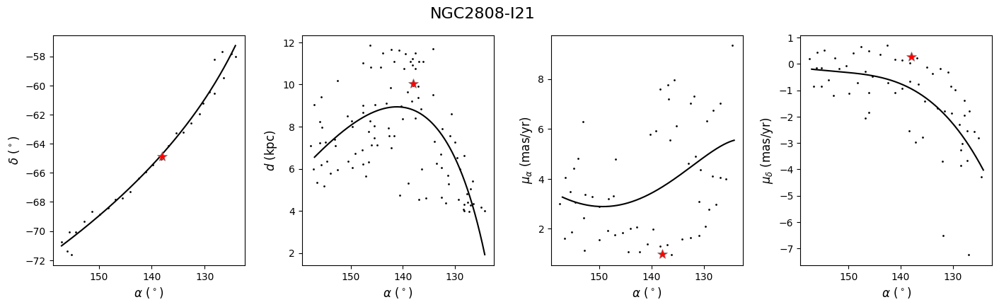

In [33]:
fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC2808-I21'].track.ra, mwsts['NGC2808-I21'].track.dec,'-k', lw=1.5)
ax.plot(NGC2808_I21radec[0],NGC2808_I21radec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC2808-I21'].track.ra, mwsts['NGC2808-I21'].track.distance,'-k', lw=1.5)
ax.plot(NGC2808_I21rad[0],NGC2808_I21rad[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC2808-I21'].track.ra, mwsts['NGC2808-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(NGC2808_I21rapmra[0],NGC2808_I21rapmra[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC2808-I21'].track.ra, mwsts['NGC2808-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(NGC2808_I21rapmdec[0],NGC2808_I21rapmdec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC2808-I21',fontsize=16);

width_phi2: 0.3969196968035457
width_pmphi1: 1.4408484541993218
width_pmphi2: 0.8292637153546579
width_dist: 1.7695453416703397


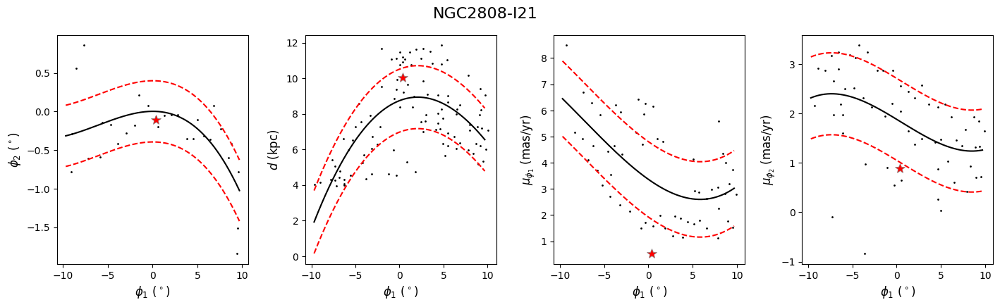

In [34]:
glob_st = glob_g.transform_to(mwsts['NGC2808-I21'].stream_frame)

def model1(phi1, a, b, c, d):
    return a + b*(phi1) + c*(phi1)**2 + d*(phi1)**3

params_radec, _ = curve_fit(model1, mwsts['NGC2808-I21'].track.ra.value, mwsts['NGC2808-I21'].track.dec.value, maxfev=5000)
params_rad, _ = curve_fit(model1, mwsts['NGC2808-I21'].track.ra.value, mwsts['NGC2808-I21'].track.distance.value, maxfev=5000)
params_rapmra, _ = curve_fit(model1, mwsts['NGC2808-I21'].track.ra.value, mwsts['NGC2808-I21'].track.pm_ra_cosdec.value, maxfev=5000)
params_rapmdec, _ = curve_fit(model1, mwsts['NGC2808-I21'].track.ra.value, mwsts['NGC2808-I21'].track.pm_dec.value, maxfev=5000)

decd = model1(NGC2808_I21rad[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmra = model1(NGC2808_I21rapmra[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmdec = model1(NGC2808_I21rapmdec[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])

ddec = model1(NGC2808_I21radec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmra = model1(NGC2808_I21rapmra[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmdec = model1(NGC2808_I21rapmdec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])

pmradec = model1(NGC2808_I21radec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrad = model1(NGC2808_I21rad[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrapmdec = model1(NGC2808_I21rapmdec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])

pmdecdec = model1(NGC2808_I21radec[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecd = model1(NGC2808_I21rad[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecpmra = model1(NGC2808_I21rapmra[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])


NGC2808_radec_g = ac.SkyCoord(ra=NGC2808_I21radec[0].values*u.deg,
                              dec=NGC2808_I21radec[1].values*u.deg)
NGC2808_phi12_c = NGC2808_radec_g.transform_to(mwsts['NGC2808-I21'].stream_frame)



NGC2808_rapmra_g = ac.SkyCoord(ra=NGC2808_I21rapmra[0].values*u.deg,
                                  dec=decpmra*u.deg,
                                  pm_ra_cosdec=NGC2808_I21rapmra[1].values*u.mas/u.yr,
                                  pm_dec=pmdecpmra*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC2808_I21rapmra[0]))*u.km/u.s)  
NGC2808_phi1pmphi1_c = NGC2808_rapmra_g.transform_to(mwsts['NGC2808-I21'].stream_frame)



NGC2808_rapmdec_g = ac.SkyCoord(ra=NGC2808_I21rapmdec[0].values*u.deg,
                                  dec=decpmdec*u.deg,
                                  pm_ra_cosdec=pmrapmdec*u.mas/u.yr,
                                  pm_dec=NGC2808_I21rapmdec[1].values*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC2808_I21rapmdec[0]))*u.km/u.s)  
NGC2808_phi1pmphi2_c = NGC2808_rapmdec_g.transform_to(mwsts['NGC2808-I21'].stream_frame)



NGC2808_rad_g = ac.SkyCoord(ra=NGC2808_I21rad[0].values*u.deg,
                            dec=decd*u.deg,
                            distance=NGC2808_I21rad[1].values*u.kpc)
    
NGC2808_phi1d_c = NGC2808_rad_g.transform_to(mwsts['NGC2808-I21'].stream_frame)


fphi2 = interp1d(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1.value, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1.value, mwsts['NGC2808-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1.value, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1.value, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC2808_phi12_c.phi1.value)-NGC2808_phi12_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC2808_phi1pmphi1_c.phi1.value)-NGC2808_phi1pmphi1_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(NGC2808_phi1pmphi2_c.phi1.value)-NGC2808_phi1pmphi2_c.pm_phi2.value))
print('width_dist:',np.std(fd(NGC2808_phi1d_c.phi1.value)-NGC2808_I21rad[1]))

widths.loc['NGC2808-I21'].width_phi2 = np.std(fphi2(NGC2808_phi12_c.phi1.value)-NGC2808_phi12_c.phi2.value)
widths.loc['NGC2808-I21'].width_dist = np.std(fd(NGC2808_phi1d_c.phi1.value)-NGC2808_I21rad[1])
widths.loc['NGC2808-I21'].width_pmphi1 = np.std(fpmphi1(NGC2808_phi1pmphi1_c.phi1.value)-NGC2808_phi1pmphi1_c.pm_phi1_cosphi2.value)
widths.loc['NGC2808-I21'].width_pmphi2 = np.std(fpmphi2(NGC2808_phi1pmphi2_c.phi1.value)-NGC2808_phi1pmphi2_c.pm_phi2.value)


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC2808_phi12_c.phi1, NGC2808_phi12_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi2 + n*widths.loc['NGC2808-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi2 - n*widths.loc['NGC2808-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC2808_phi1d_c.phi1, NGC2808_phi1d_c.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.distance + n*widths.loc['NGC2808-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.distance - n*widths.loc['NGC2808-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC2808_phi1pmphi1_c.phi1, NGC2808_phi1pmphi1_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC2808-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC2808-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC2808_phi1pmphi2_c.phi1, NGC2808_phi1pmphi2_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).pm_phi2 + n*widths.loc['NGC2808-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).phi1, mwsts['NGC2808-I21'].track.transform_to(mwsts['NGC2808-I21'].stream_frame).pm_phi2 - n*widths.loc['NGC2808-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC2808-I21',fontsize=16);

## NGC288

In [35]:
globs_ = globs[globs['Name'] == 'NGC 288']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_288']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

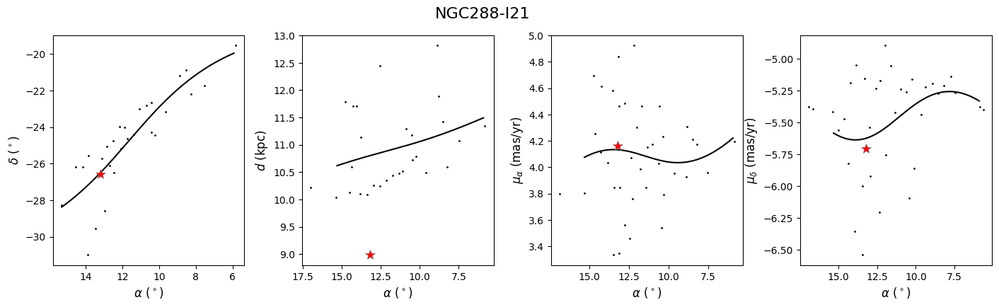

In [36]:
fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC288-I21'].track.ra, mwsts['NGC288-I21'].track.dec,'-k', lw=1.5)
ax.plot(NGC288_I21radec[0],NGC288_I21radec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC288-I21'].track.ra, mwsts['NGC288-I21'].track.distance,'-k', lw=1.5)
ax.plot(NGC288_I21rad[0],NGC288_I21rad[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC288-I21'].track.ra, mwsts['NGC288-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(NGC288_I21rapmra[0],NGC288_I21rapmra[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC288-I21'].track.ra, mwsts['NGC288-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(NGC288_I21rapmdec[0],NGC288_I21rapmdec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC288-I21',fontsize=16);

width_phi2: 0.5665397543982585
width_pmphi1: 0.24694342130523003
width_pmphi2: 0.234041119337994
width_dist: 0.6954471865284344


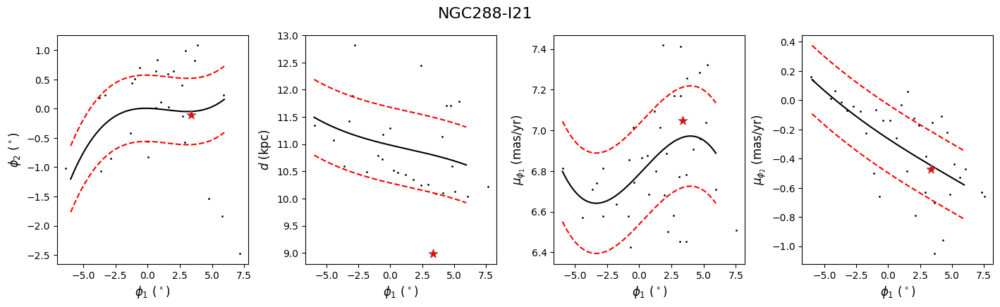

In [37]:
glob_st = glob_g.transform_to(mwsts['NGC288-I21'].stream_frame)

def model1(phi1, a, b, c, d):
    return a + b*(phi1) + c*(phi1)**2 + d*(phi1)**3

params_radec, _ = curve_fit(model1, mwsts['NGC288-I21'].track.ra.value, mwsts['NGC288-I21'].track.dec.value, maxfev=5000)
params_rad, _ = curve_fit(model1, mwsts['NGC288-I21'].track.ra.value, mwsts['NGC288-I21'].track.distance.value, maxfev=5000)
params_rapmra, _ = curve_fit(model1, mwsts['NGC288-I21'].track.ra.value, mwsts['NGC288-I21'].track.pm_ra_cosdec.value, maxfev=5000)
params_rapmdec, _ = curve_fit(model1, mwsts['NGC288-I21'].track.ra.value, mwsts['NGC288-I21'].track.pm_dec.value, maxfev=5000)

decd = model1(NGC288_I21rad[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmra = model1(NGC288_I21rapmra[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmdec = model1(NGC288_I21rapmdec[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])

ddec = model1(NGC288_I21radec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmra = model1(NGC288_I21rapmra[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmdec = model1(NGC288_I21rapmdec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])

pmradec = model1(NGC288_I21radec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrad = model1(NGC288_I21rad[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrapmdec = model1(NGC288_I21rapmdec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])

pmdecdec = model1(NGC288_I21radec[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecd = model1(NGC288_I21rad[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecpmra = model1(NGC288_I21rapmra[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])


NGC288_radec_g = ac.SkyCoord(ra=NGC288_I21radec[0].values*u.deg,
                              dec=NGC288_I21radec[1].values*u.deg)
NGC288_phi12_c = NGC288_radec_g.transform_to(mwsts['NGC288-I21'].stream_frame)



NGC288_rapmra_g = ac.SkyCoord(ra=NGC288_I21rapmra[0].values*u.deg,
                                  dec=decpmra*u.deg,
                                  pm_ra_cosdec=NGC288_I21rapmra[1].values*u.mas/u.yr,
                                  pm_dec=pmdecpmra*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC288_I21rapmra[0]))*u.km/u.s)  
NGC288_phi1pmphi1_c = NGC288_rapmra_g.transform_to(mwsts['NGC288-I21'].stream_frame)



NGC288_rapmdec_g = ac.SkyCoord(ra=NGC288_I21rapmdec[0].values*u.deg,
                                  dec=decpmdec*u.deg,
                                  pm_ra_cosdec=pmrapmdec*u.mas/u.yr,
                                  pm_dec=NGC288_I21rapmdec[1].values*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC288_I21rapmdec[0]))*u.km/u.s)  
NGC288_phi1pmphi2_c = NGC288_rapmdec_g.transform_to(mwsts['NGC288-I21'].stream_frame)



NGC288_rad_g = ac.SkyCoord(ra=NGC288_I21rad[0].values*u.deg,
                            dec=decd*u.deg,
                            distance=NGC288_I21rad[1].values*u.kpc)
    
NGC288_phi1d_c = NGC288_rad_g.transform_to(mwsts['NGC288-I21'].stream_frame)


fphi2 = interp1d(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1.value, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1.value, mwsts['NGC288-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1.value, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1.value, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC288_phi12_c.phi1.value[NGC288_phi12_c.phi2.value>-1.5])-NGC288_phi12_c.phi2.value[NGC288_phi12_c.phi2.value>-1.5]))
print('width_pmphi1:',np.std(fpmphi1(NGC288_phi1pmphi1_c.phi1.value)-NGC288_phi1pmphi1_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(NGC288_phi1pmphi2_c.phi1.value)-NGC288_phi1pmphi2_c.pm_phi2.value))
print('width_dist:',np.std(fd(NGC288_phi1d_c.phi1.value)-NGC288_I21rad[1]))

widths.loc['NGC288-I21'].width_phi2 = np.std(fphi2(NGC288_phi12_c.phi1.value[NGC288_phi12_c.phi2.value>-1.5])-NGC288_phi12_c.phi2.value[NGC288_phi12_c.phi2.value>-1.5])
widths.loc['NGC288-I21'].width_dist = np.std(fd(NGC288_phi1d_c.phi1.value)-NGC288_I21rad[1])
widths.loc['NGC288-I21'].width_pmphi1 = np.std(fpmphi1(NGC288_phi1pmphi1_c.phi1.value)-NGC288_phi1pmphi1_c.pm_phi1_cosphi2.value)
widths.loc['NGC288-I21'].width_pmphi2 = np.std(fpmphi2(NGC288_phi1pmphi2_c.phi1.value)-NGC288_phi1pmphi2_c.pm_phi2.value)


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC288_phi12_c.phi1, NGC288_phi12_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi2 + n*widths.loc['NGC288-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi2 - n*widths.loc['NGC288-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC288_phi1d_c.phi1, NGC288_phi1d_c.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.distance + n*widths.loc['NGC288-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.distance - n*widths.loc['NGC288-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC288_phi1pmphi1_c.phi1, NGC288_phi1pmphi1_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC288-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC288-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC288_phi1pmphi2_c.phi1, NGC288_phi1pmphi2_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).pm_phi2 + n*widths.loc['NGC288-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).phi1, mwsts['NGC288-I21'].track.transform_to(mwsts['NGC288-I21'].stream_frame).pm_phi2 - n*widths.loc['NGC288-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC288-I21',fontsize=16);

## NGC2298

In [38]:
globs_ = globs[globs['Name'] == 'NGC 2298']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_2298']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

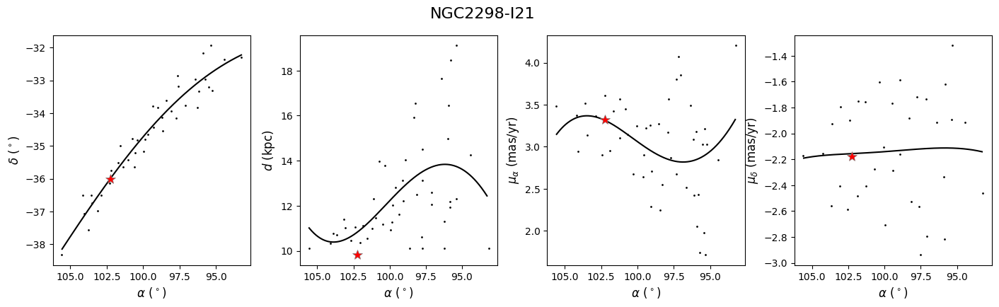

In [39]:
fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC2298-I21'].track.ra, mwsts['NGC2298-I21'].track.dec,'-k', lw=1.5)
ax.plot(NGC2298_I21radec[0],NGC2298_I21radec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC2298-I21'].track.ra, mwsts['NGC2298-I21'].track.distance,'-k', lw=1.5)
ax.plot(NGC2298_I21rad[0],NGC2298_I21rad[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC2298-I21'].track.ra, mwsts['NGC2298-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(NGC2298_I21rapmra[0],NGC2298_I21rapmra[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC2298-I21'].track.ra, mwsts['NGC2298-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(NGC2298_I21rapmdec[0],NGC2298_I21rapmdec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC2298-I21',fontsize=16);

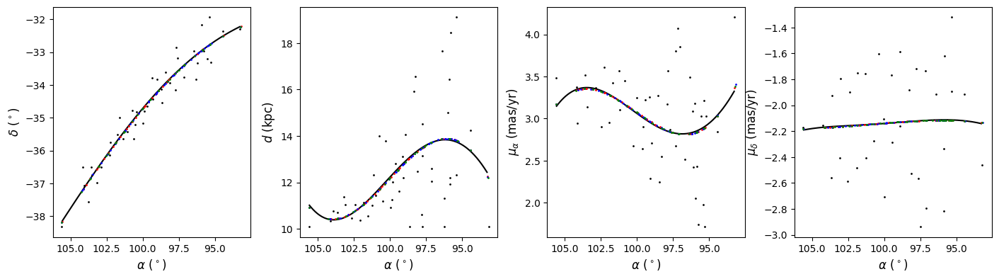

In [40]:
from scipy.optimize import curve_fit

def model1(phi1, a, b, c, d):
    return a + b*(phi1) + c*(phi1)**2 + d*(phi1)**3

params_radec, _ = curve_fit(model1, mwsts['NGC2298-I21'].track.ra.value, mwsts['NGC2298-I21'].track.dec.value, maxfev=5000)
params_rad, _ = curve_fit(model1, mwsts['NGC2298-I21'].track.ra.value, mwsts['NGC2298-I21'].track.distance.value, maxfev=5000)
params_rapmra, _ = curve_fit(model1, mwsts['NGC2298-I21'].track.ra.value, mwsts['NGC2298-I21'].track.pm_ra_cosdec.value, maxfev=5000)
params_rapmdec, _ = curve_fit(model1, mwsts['NGC2298-I21'].track.ra.value, mwsts['NGC2298-I21'].track.pm_dec.value, maxfev=5000)

decd = model1(NGC2298_I21rad[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmra = model1(NGC2298_I21rapmra[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmdec = model1(NGC2298_I21rapmdec[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])

ddec = model1(NGC2298_I21radec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmra = model1(NGC2298_I21rapmra[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmdec = model1(NGC2298_I21rapmdec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])

pmradec = model1(NGC2298_I21radec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrad = model1(NGC2298_I21rad[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrapmdec = model1(NGC2298_I21rapmdec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])

pmdecdec = model1(NGC2298_I21radec[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecd = model1(NGC2298_I21rad[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecpmra = model1(NGC2298_I21rapmra[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])

fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC2298-I21'].track.ra, mwsts['NGC2298-I21'].track.dec,'-k', lw=1.5)
ax.plot(NGC2298_I21radec[0],NGC2298_I21radec[1],'.k',ms=2)
ax.plot(NGC2298_I21rad[0],decd,'.r',ms=2)
ax.plot(NGC2298_I21rapmra[0],decpmra,'.b',ms=2)
ax.plot(NGC2298_I21rapmdec[0],decpmdec,'.g',ms=2)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC2298-I21'].track.ra, mwsts['NGC2298-I21'].track.distance,'-k', lw=1.5)
ax.plot(NGC2298_I21rad[0],NGC2298_I21rad[1],'.k',ms=2)
ax.plot(NGC2298_I21radec[0],ddec,'.r',ms=2)
ax.plot(NGC2298_I21rapmra[0],dpmra,'.b',ms=2)
ax.plot(NGC2298_I21rapmdec[0],dpmdec,'.g',ms=2)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC2298-I21'].track.ra, mwsts['NGC2298-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(NGC2298_I21rapmra[0],NGC2298_I21rapmra[1],'.k',ms=2)
ax.plot(NGC2298_I21radec[0],pmradec,'.r',ms=2)
ax.plot(NGC2298_I21rad[0],pmrad,'.b',ms=2)
ax.plot(NGC2298_I21rapmdec[0],pmrapmdec,'.g',ms=2)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC2298-I21'].track.ra, mwsts['NGC2298-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(NGC2298_I21rapmdec[0],NGC2298_I21rapmdec[1],'.k',ms=2)
ax.plot(NGC2298_I21radec[0],pmdecdec,'.r',ms=2)
ax.plot(NGC2298_I21rad[0],pmdecd,'.b',ms=2)
ax.plot(NGC2298_I21rapmra[0],pmdecpmra,'.g',ms=2)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

width_phi2: 0.36018570067758277
width_pmphi1: 0.43871526412119166
width_pmphi2: 0.3399801941824413
width_dist: 1.9502707706438018


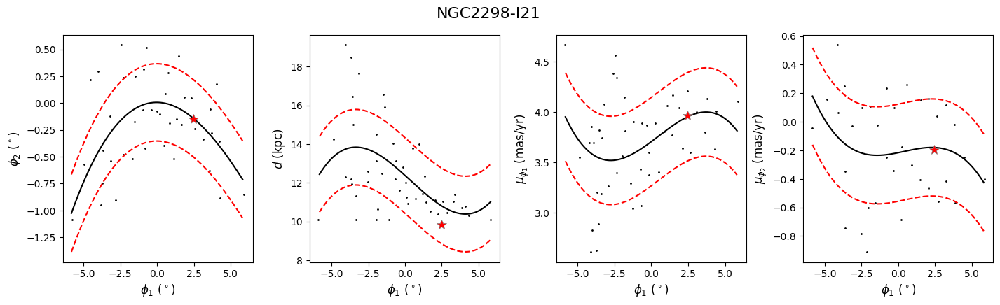

In [41]:
glob_st = glob_g.transform_to(mwsts['NGC2298-I21'].stream_frame)

def model1(phi1, a, b, c, d):
    return a + b*(phi1) + c*(phi1)**2 + d*(phi1)**3

params_radec, _ = curve_fit(model1, mwsts['NGC2298-I21'].track.ra.value, mwsts['NGC2298-I21'].track.dec.value, maxfev=5000)
params_rad, _ = curve_fit(model1, mwsts['NGC2298-I21'].track.ra.value, mwsts['NGC2298-I21'].track.distance.value, maxfev=5000)
params_rapmra, _ = curve_fit(model1, mwsts['NGC2298-I21'].track.ra.value, mwsts['NGC2298-I21'].track.pm_ra_cosdec.value, maxfev=5000)
params_rapmdec, _ = curve_fit(model1, mwsts['NGC2298-I21'].track.ra.value, mwsts['NGC2298-I21'].track.pm_dec.value, maxfev=5000)

decd = model1(NGC2298_I21rad[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmra = model1(NGC2298_I21rapmra[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmdec = model1(NGC2298_I21rapmdec[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])

ddec = model1(NGC2298_I21radec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmra = model1(NGC2298_I21rapmra[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmdec = model1(NGC2298_I21rapmdec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])

pmradec = model1(NGC2298_I21radec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrad = model1(NGC2298_I21rad[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrapmdec = model1(NGC2298_I21rapmdec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])

pmdecdec = model1(NGC2298_I21radec[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecd = model1(NGC2298_I21rad[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecpmra = model1(NGC2298_I21rapmra[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])


NGC2298_radec_g = ac.SkyCoord(ra=NGC2298_I21radec[0].values*u.deg,
                              dec=NGC2298_I21radec[1].values*u.deg)
NGC2298_phi12_c = NGC2298_radec_g.transform_to(mwsts['NGC2298-I21'].stream_frame)



NGC2298_rapmra_g = ac.SkyCoord(ra=NGC2298_I21rapmra[0].values*u.deg,
                                  dec=decpmra*u.deg,
                                  pm_ra_cosdec=NGC2298_I21rapmra[1].values*u.mas/u.yr,
                                  pm_dec=pmdecpmra*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC2298_I21rapmra[0]))*u.km/u.s)  
NGC2298_phi1pmphi1_c = NGC2298_rapmra_g.transform_to(mwsts['NGC2298-I21'].stream_frame)



NGC2298_rapmdec_g = ac.SkyCoord(ra=NGC2298_I21rapmdec[0].values*u.deg,
                                  dec=decpmdec*u.deg,
                                  pm_ra_cosdec=pmrapmdec*u.mas/u.yr,
                                  pm_dec=NGC2298_I21rapmdec[1].values*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC2298_I21rapmdec[0]))*u.km/u.s)  
NGC2298_phi1pmphi2_c = NGC2298_rapmdec_g.transform_to(mwsts['NGC2298-I21'].stream_frame)



NGC2298_rad_g = ac.SkyCoord(ra=NGC2298_I21rad[0].values*u.deg,
                            dec=decd*u.deg,
                            distance=NGC2298_I21rad[1].values*u.kpc)
    
NGC2298_phi1d_c = NGC2298_rad_g.transform_to(mwsts['NGC2298-I21'].stream_frame)


fphi2 = interp1d(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1.value, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1.value, mwsts['NGC2298-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1.value, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1.value, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC2298_phi12_c.phi1.value)-NGC2298_phi12_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC2298_phi1pmphi1_c.phi1.value)-NGC2298_phi1pmphi1_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(NGC2298_phi1pmphi2_c.phi1.value)-NGC2298_phi1pmphi2_c.pm_phi2.value))
print('width_dist:',np.std(fd(NGC2298_phi1d_c.phi1.value)-NGC2298_I21rad[1]))

widths.loc['NGC2298-I21'].width_phi2 = np.std(fphi2(NGC2298_phi12_c.phi1.value)-NGC2298_phi12_c.phi2.value)
widths.loc['NGC2298-I21'].width_dist = np.std(fd(NGC2298_phi1d_c.phi1.value)-NGC2298_I21rad[1])
widths.loc['NGC2298-I21'].width_pmphi1 = np.std(fpmphi1(NGC2298_phi1pmphi1_c.phi1.value)-NGC2298_phi1pmphi1_c.pm_phi1_cosphi2.value)
widths.loc['NGC2298-I21'].width_pmphi2 = np.std(fpmphi2(NGC2298_phi1pmphi2_c.phi1.value)-NGC2298_phi1pmphi2_c.pm_phi2.value)


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC2298_phi12_c.phi1, NGC2298_phi12_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi2 + n*widths.loc['NGC2298-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi2 - n*widths.loc['NGC2298-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC2298_phi1d_c.phi1, NGC2298_phi1d_c.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.distance + n*widths.loc['NGC2298-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.distance - n*widths.loc['NGC2298-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC2298_phi1pmphi1_c.phi1, NGC2298_phi1pmphi1_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC2298-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC2298-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC2298_phi1pmphi2_c.phi1, NGC2298_phi1pmphi2_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).pm_phi2 + n*widths.loc['NGC2298-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).phi1, mwsts['NGC2298-I21'].track.transform_to(mwsts['NGC2298-I21'].stream_frame).pm_phi2 - n*widths.loc['NGC2298-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC2298-I21',fontsize=16);

## NGC5466

In [42]:
globs_ = globs[globs['Name'] == 'NGC 5466']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_5466']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

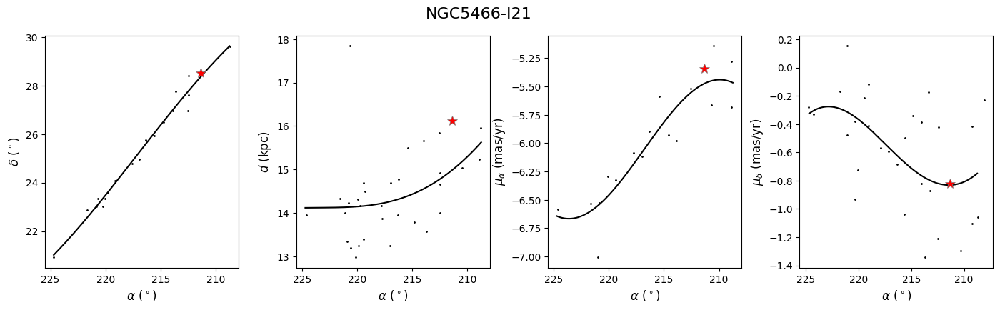

In [43]:
fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC5466-I21'].track.ra, mwsts['NGC5466-I21'].track.dec,'-k', lw=1.5)
ax.plot(NGC5466_I21radec[0],NGC5466_I21radec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC5466-I21'].track.ra, mwsts['NGC5466-I21'].track.distance,'-k', lw=1.5)
ax.plot(NGC5466_I21rad[0],NGC5466_I21rad[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC5466-I21'].track.ra, mwsts['NGC5466-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(NGC5466_I21rapmra[0],NGC5466_I21rapmra[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC5466-I21'].track.ra, mwsts['NGC5466-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(NGC5466_I21rapmdec[0],NGC5466_I21rapmdec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC5466-I21',fontsize=16);

width_phi2: 0.26078606124436526
width_pmphi1: 0.16910662642347832
width_pmphi2: 0.2794924496378843
width_dist: 0.9191085563040402


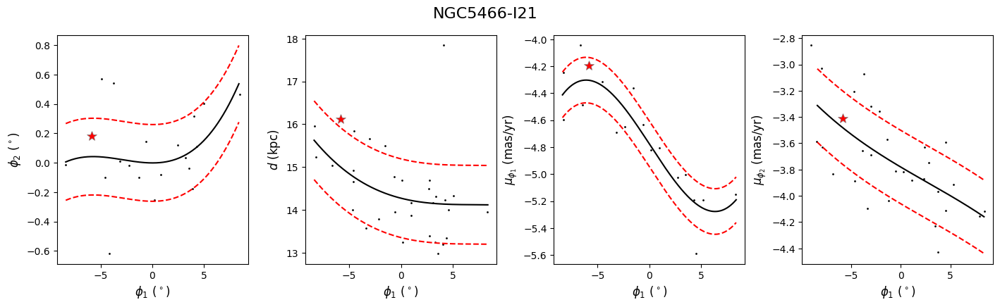

In [44]:
glob_st = glob_g.transform_to(mwsts['NGC5466-I21'].stream_frame)

def model1(phi1, a, b, c, d):
    return a + b*(phi1) + c*(phi1)**2 + d*(phi1)**3

params_radec, _ = curve_fit(model1, mwsts['NGC5466-I21'].track.ra.value, mwsts['NGC5466-I21'].track.dec.value, maxfev=5000)
params_rad, _ = curve_fit(model1, mwsts['NGC5466-I21'].track.ra.value, mwsts['NGC5466-I21'].track.distance.value, maxfev=5000)
params_rapmra, _ = curve_fit(model1, mwsts['NGC5466-I21'].track.ra.value, mwsts['NGC5466-I21'].track.pm_ra_cosdec.value, maxfev=5000)
params_rapmdec, _ = curve_fit(model1, mwsts['NGC5466-I21'].track.ra.value, mwsts['NGC5466-I21'].track.pm_dec.value, maxfev=5000)

decd = model1(NGC5466_I21rad[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmra = model1(NGC5466_I21rapmra[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmdec = model1(NGC5466_I21rapmdec[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])

ddec = model1(NGC5466_I21radec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmra = model1(NGC5466_I21rapmra[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmdec = model1(NGC5466_I21rapmdec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])

pmradec = model1(NGC5466_I21radec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrad = model1(NGC5466_I21rad[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrapmdec = model1(NGC5466_I21rapmdec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])

pmdecdec = model1(NGC5466_I21radec[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecd = model1(NGC5466_I21rad[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecpmra = model1(NGC5466_I21rapmra[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])


NGC5466_radec_g = ac.SkyCoord(ra=NGC5466_I21radec[0].values*u.deg,
                              dec=NGC5466_I21radec[1].values*u.deg)
NGC5466_phi12_c = NGC5466_radec_g.transform_to(mwsts['NGC5466-I21'].stream_frame)



NGC5466_rapmra_g = ac.SkyCoord(ra=NGC5466_I21rapmra[0].values*u.deg,
                                  dec=decpmra*u.deg,
                                  pm_ra_cosdec=NGC5466_I21rapmra[1].values*u.mas/u.yr,
                                  pm_dec=pmdecpmra*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC5466_I21rapmra[0]))*u.km/u.s)  
NGC5466_phi1pmphi1_c = NGC5466_rapmra_g.transform_to(mwsts['NGC5466-I21'].stream_frame)



NGC5466_rapmdec_g = ac.SkyCoord(ra=NGC5466_I21rapmdec[0].values*u.deg,
                                  dec=decpmdec*u.deg,
                                  pm_ra_cosdec=pmrapmdec*u.mas/u.yr,
                                  pm_dec=NGC5466_I21rapmdec[1].values*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC5466_I21rapmdec[0]))*u.km/u.s)  
NGC5466_phi1pmphi2_c = NGC5466_rapmdec_g.transform_to(mwsts['NGC5466-I21'].stream_frame)



NGC5466_rad_g = ac.SkyCoord(ra=NGC5466_I21rad[0].values*u.deg,
                            dec=decd*u.deg,
                            distance=NGC5466_I21rad[1].values*u.kpc)
    
NGC5466_phi1d_c = NGC5466_rad_g.transform_to(mwsts['NGC5466-I21'].stream_frame)


fphi2 = interp1d(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1.value, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1.value, mwsts['NGC5466-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1.value, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1.value, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC5466_phi12_c.phi1.value)-NGC5466_phi12_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC5466_phi1pmphi1_c.phi1.value)-NGC5466_phi1pmphi1_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(NGC5466_phi1pmphi2_c.phi1.value)-NGC5466_phi1pmphi2_c.pm_phi2.value))
print('width_dist:',np.std(fd(NGC5466_phi1d_c.phi1.value)-NGC5466_I21rad[1]))

widths.loc['NGC5466-I21'].width_phi2 = np.std(fphi2(NGC5466_phi12_c.phi1.value)-NGC5466_phi12_c.phi2.value)
widths.loc['NGC5466-I21'].width_dist = np.std(fd(NGC5466_phi1d_c.phi1.value)-NGC5466_I21rad[1])
widths.loc['NGC5466-I21'].width_pmphi1 = np.std(fpmphi1(NGC5466_phi1pmphi1_c.phi1.value)-NGC5466_phi1pmphi1_c.pm_phi1_cosphi2.value)
widths.loc['NGC5466-I21'].width_pmphi2 = np.std(fpmphi2(NGC5466_phi1pmphi2_c.phi1.value)-NGC5466_phi1pmphi2_c.pm_phi2.value)


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC5466_phi12_c.phi1, NGC5466_phi12_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi2 + n*widths.loc['NGC5466-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi2 - n*widths.loc['NGC5466-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC5466_phi1d_c.phi1, NGC5466_phi1d_c.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.distance + n*widths.loc['NGC5466-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.distance - n*widths.loc['NGC5466-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC5466_phi1pmphi1_c.phi1, NGC5466_phi1pmphi1_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC5466-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC5466-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC5466_phi1pmphi2_c.phi1, NGC5466_phi1pmphi2_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).pm_phi2 + n*widths.loc['NGC5466-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).phi1, mwsts['NGC5466-I21'].track.transform_to(mwsts['NGC5466-I21'].stream_frame).pm_phi2 - n*widths.loc['NGC5466-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC5466-I21',fontsize=16);

In [45]:
#=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=

width_phi2: 1.1954159686594499
width_pmphi1: 0.24031990653473556
width_pmphi2: 0.268439400100313
width_dist: 1.7738889880729718


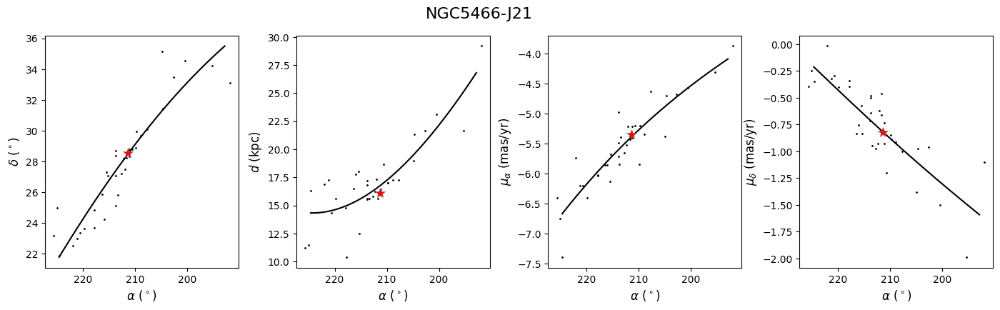

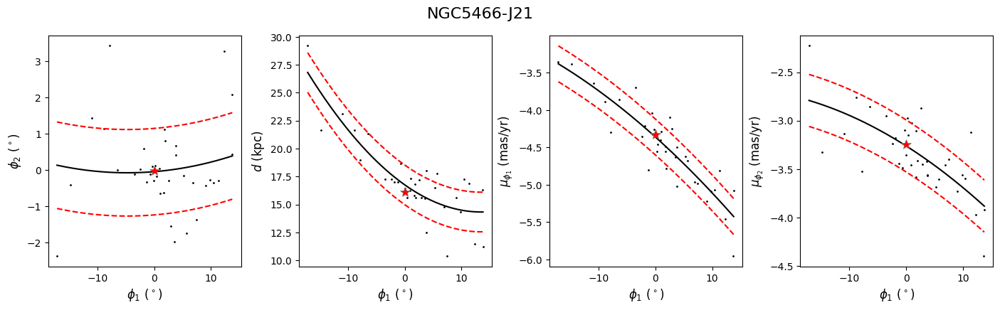

In [46]:
glob_st = glob_g.transform_to(mwsts['NGC5466-J21'].stream_frame)

NGC5466_J21_g = ac.SkyCoord(ra=NGC5466_J21['  ra']*u.deg,
                          dec=NGC5466_J21['        dec']*u.deg,
                          distance=NGC5466_J21['     Rhelio']*u.kpc,
                          pm_ra_cosdec=NGC5466_J21[' pmra']*u.mas/u.yr,
                          pm_dec=NGC5466_J21[' pmdec']*u.mas/u.yr,
                          radial_velocity=np.zeros(len(NGC5466_J21[' pmdec']))*u.km/u.s)
    
NGC5466_J21_c = NGC5466_J21_g.transform_to(mwsts['NGC5466-J21'].stream_frame)

fphi2 = interp1d(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1.value, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1.value, mwsts['NGC5466-J21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1.value, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1.value, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC5466_J21_c.phi1.value)-NGC5466_J21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC5466_J21_c.phi1.value)-NGC5466_J21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(NGC5466_J21_c.phi1.value)-NGC5466_J21_c.pm_phi2.value))
print('width_dist:',np.std(fd(NGC5466_J21_c.phi1.value)-NGC5466_J21_g.distance.value))

widths.loc['NGC5466-J21'].width_phi2 = np.std(fphi2(NGC5466_J21_c.phi1.value)-NGC5466_J21_c.phi2.value)
widths.loc['NGC5466-J21'].width_dist = np.std(fd(NGC5466_J21_c.phi1.value)-NGC5466_J21_g.distance.value)
widths.loc['NGC5466-J21'].width_pmphi1 = np.std(fpmphi1(NGC5466_J21_c.phi1.value)-NGC5466_J21_c.pm_phi1_cosphi2.value)
widths.loc['NGC5466-J21'].width_pmphi2 = np.std(fpmphi2(NGC5466_J21_c.phi1.value)-NGC5466_J21_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC5466-J21'].track.ra, mwsts['NGC5466-J21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(NGC5466_J21_g.ra, NGC5466_J21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC5466-J21'].track.ra, mwsts['NGC5466-J21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(NGC5466_J21_g.ra, NGC5466_J21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC5466-J21'].track.ra, mwsts['NGC5466-J21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(NGC5466_J21_g.ra, NGC5466_J21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC5466-J21'].track.ra, mwsts['NGC5466-J21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(NGC5466_J21_g.ra, NGC5466_J21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC5466-J21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC5466_J21_c.phi1, NGC5466_J21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi2 + n*widths.loc['NGC5466-J21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi2 - n*widths.loc['NGC5466-J21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC5466_J21_c.phi1, NGC5466_J21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.distance + n*widths.loc['NGC5466-J21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.distance - n*widths.loc['NGC5466-J21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC5466_J21_c.phi1, NGC5466_J21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC5466-J21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC5466-J21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC5466_J21_c.phi1, NGC5466_J21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).pm_phi2 + n*widths.loc['NGC5466-J21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).phi1, mwsts['NGC5466-J21'].track.transform_to(mwsts['NGC5466-J21'].stream_frame).pm_phi2 - n*widths.loc['NGC5466-J21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC5466-J21',fontsize=16);

## NGC 6101

In [47]:
globs_ = globs[globs['Name'] == 'NGC 6101']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_6101']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

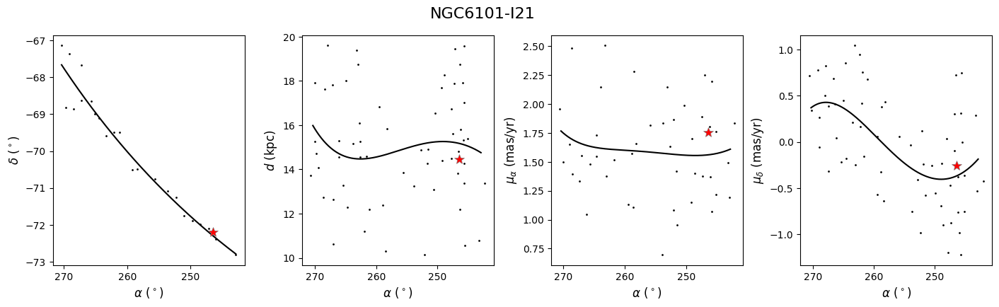

In [48]:
fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC6101-I21'].track.ra, mwsts['NGC6101-I21'].track.dec,'-k', lw=1.5)
ax.plot(NGC6101_I21radec[0],NGC6101_I21radec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC6101-I21'].track.ra, mwsts['NGC6101-I21'].track.distance,'-k', lw=1.5)
ax.plot(NGC6101_I21rad[0],NGC6101_I21rad[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC6101-I21'].track.ra, mwsts['NGC6101-I21'].track.pm_ra_cosdec,'-k', lw=1.5)
ax.plot(NGC6101_I21rapmra[0],NGC6101_I21rapmra[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC6101-I21'].track.ra, mwsts['NGC6101-I21'].track.pm_dec,'-k', lw=1.5)
ax.plot(NGC6101_I21rapmdec[0],NGC6101_I21rapmdec[1],'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC6101-I21',fontsize=16);

width_phi2: 0.31154450263501515
width_pmphi1: 0.35946101597687347
width_pmphi2: 0.41666413013664644
width_dist: 2.4768091305989546


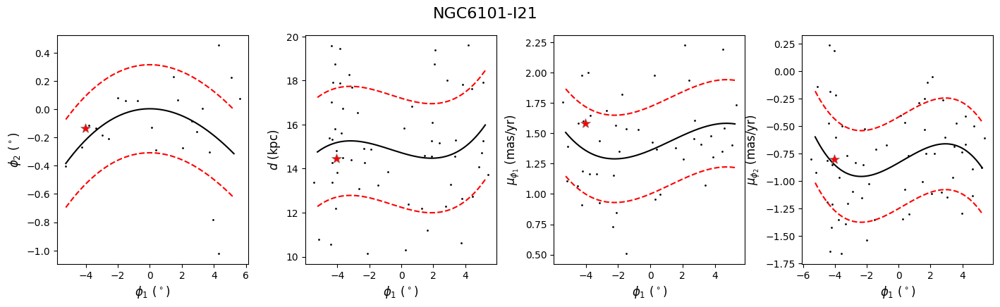

In [49]:
glob_st = glob_g.transform_to(mwsts['NGC6101-I21'].stream_frame)

def model1(phi1, a, b, c, d):
    return a + b*(phi1) + c*(phi1)**2 + d*(phi1)**3

params_radec, _ = curve_fit(model1, mwsts['NGC6101-I21'].track.ra.value, mwsts['NGC6101-I21'].track.dec.value, maxfev=5000)
params_rad, _ = curve_fit(model1, mwsts['NGC6101-I21'].track.ra.value, mwsts['NGC6101-I21'].track.distance.value, maxfev=5000)
params_rapmra, _ = curve_fit(model1, mwsts['NGC6101-I21'].track.ra.value, mwsts['NGC6101-I21'].track.pm_ra_cosdec.value, maxfev=5000)
params_rapmdec, _ = curve_fit(model1, mwsts['NGC6101-I21'].track.ra.value, mwsts['NGC6101-I21'].track.pm_dec.value, maxfev=5000)

decd = model1(NGC6101_I21rad[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmra = model1(NGC6101_I21rapmra[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])
decpmdec = model1(NGC6101_I21rapmdec[0].values, params_radec[0], params_radec[1], params_radec[2], params_radec[3])

ddec = model1(NGC6101_I21radec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmra = model1(NGC6101_I21rapmra[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])
dpmdec = model1(NGC6101_I21rapmdec[0].values, params_rad[0], params_rad[1], params_rad[2], params_rad[3])

pmradec = model1(NGC6101_I21radec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrad = model1(NGC6101_I21rad[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])
pmrapmdec = model1(NGC6101_I21rapmdec[0].values, params_rapmra[0], params_rapmra[1], params_rapmra[2], params_rapmra[3])

pmdecdec = model1(NGC6101_I21radec[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecd = model1(NGC6101_I21rad[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])
pmdecpmra = model1(NGC6101_I21rapmra[0].values, params_rapmdec[0], params_rapmdec[1], params_rapmdec[2], params_rapmdec[3])


NGC6101_radec_g = ac.SkyCoord(ra=NGC6101_I21radec[0].values*u.deg,
                              dec=NGC6101_I21radec[1].values*u.deg)
NGC6101_phi12_c = NGC6101_radec_g.transform_to(mwsts['NGC6101-I21'].stream_frame)



NGC6101_rapmra_g = ac.SkyCoord(ra=NGC6101_I21rapmra[0].values*u.deg,
                                  dec=decpmra*u.deg,
                                  pm_ra_cosdec=NGC6101_I21rapmra[1].values*u.mas/u.yr,
                                  pm_dec=pmdecpmra*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC6101_I21rapmra[0]))*u.km/u.s)  
NGC6101_phi1pmphi1_c = NGC6101_rapmra_g.transform_to(mwsts['NGC6101-I21'].stream_frame)



NGC6101_rapmdec_g = ac.SkyCoord(ra=NGC6101_I21rapmdec[0].values*u.deg,
                                  dec=decpmdec*u.deg,
                                  pm_ra_cosdec=pmrapmdec*u.mas/u.yr,
                                  pm_dec=NGC6101_I21rapmdec[1].values*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC6101_I21rapmdec[0]))*u.km/u.s)  
NGC6101_phi1pmphi2_c = NGC6101_rapmdec_g.transform_to(mwsts['NGC6101-I21'].stream_frame)



NGC6101_rad_g = ac.SkyCoord(ra=NGC6101_I21rad[0].values*u.deg,
                            dec=decd*u.deg,
                            distance=NGC6101_I21rad[1].values*u.kpc)
    
NGC6101_phi1d_c = NGC6101_rad_g.transform_to(mwsts['NGC6101-I21'].stream_frame)


fphi2 = interp1d(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1.value, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1.value, mwsts['NGC6101-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1.value, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1.value, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC6101_phi12_c.phi1.value)-NGC6101_phi12_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC6101_phi1pmphi1_c.phi1.value)-NGC6101_phi1pmphi1_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(NGC6101_phi1pmphi2_c.phi1.value)-NGC6101_phi1pmphi2_c.pm_phi2.value))
print('width_dist:',np.std(fd(NGC6101_phi1d_c.phi1.value)-NGC6101_I21rad[1]))

widths.loc['NGC6101-I21'].width_phi2 = np.std(fphi2(NGC6101_phi12_c.phi1.value)-NGC6101_phi12_c.phi2.value)
widths.loc['NGC6101-I21'].width_dist = np.std(fd(NGC6101_phi1d_c.phi1.value)-NGC6101_I21rad[1])
widths.loc['NGC6101-I21'].width_pmphi1 = np.std(fpmphi1(NGC6101_phi1pmphi1_c.phi1.value)-NGC6101_phi1pmphi1_c.pm_phi1_cosphi2.value)
widths.loc['NGC6101-I21'].width_pmphi2 = np.std(fpmphi2(NGC6101_phi1pmphi2_c.phi1.value)-NGC6101_phi1pmphi2_c.pm_phi2.value)


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC6101_phi12_c.phi1, NGC6101_phi12_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi2 + n*widths.loc['NGC6101-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi2 - n*widths.loc['NGC6101-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC6101_phi1d_c.phi1, NGC6101_phi1d_c.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.distance + n*widths.loc['NGC6101-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.distance - n*widths.loc['NGC6101-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC6101_phi1pmphi1_c.phi1, NGC6101_phi1pmphi1_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC6101-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC6101-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC6101_phi1pmphi2_c.phi1, NGC6101_phi1pmphi2_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).pm_phi2 + n*widths.loc['NGC6101-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).phi1, mwsts['NGC6101-I21'].track.transform_to(mwsts['NGC6101-I21'].stream_frame).pm_phi2 - n*widths.loc['NGC6101-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC6101-I21',fontsize=16);

## NGC 6397

In [50]:
globs_ = globs[globs['Name'] == 'NGC 6397']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'NGC_6397']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

width_phi2: 0.4720059174989512
width_pmphi1: 0.3694127317673055
width_pmphi2: 0.6079293604618649
width_dist: 0.07931174545425652


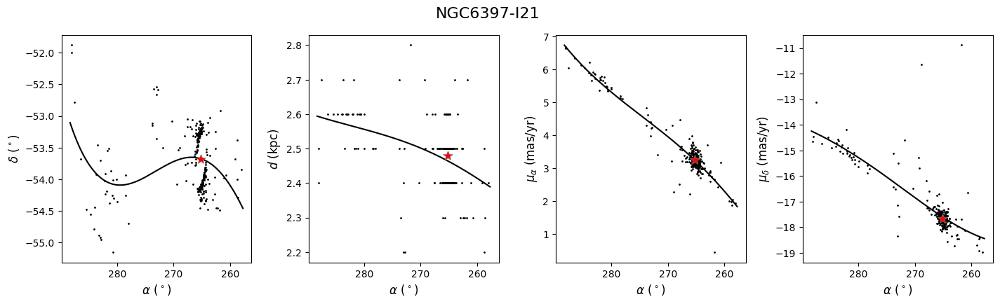

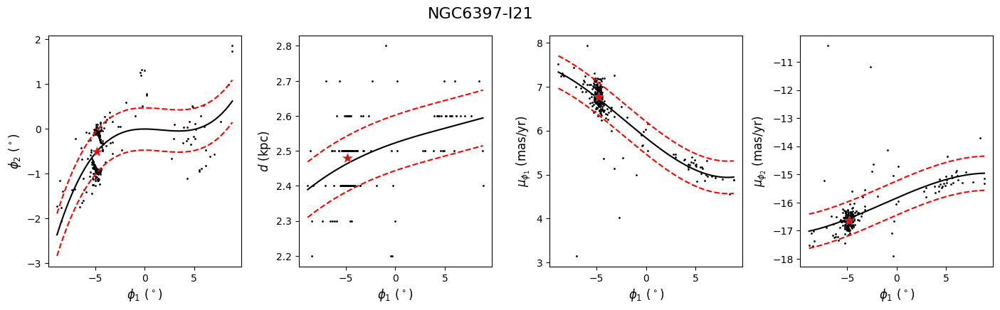

In [51]:
glob_st = glob_g.transform_to(mwsts['NGC6397-I21'].stream_frame)

NGC6397_I21 = I21[I21.StreamName=='NGC6397']

NGC6397_I21_g = ac.SkyCoord(ra=np.array(NGC6397_I21.ra_epoch2000)*u.deg,
                                  dec=np.array(NGC6397_I21.dec_epoch2000)*u.deg,
                                  distance=np.array(NGC6397_I21.dis)*u.kpc,
                                  pm_ra_cosdec=np.array(NGC6397_I21.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(NGC6397_I21.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(NGC6397_I21.pmdec))*u.km/u.s)
    
NGC6397_I21_c = NGC6397_I21_g.transform_to(mwsts['NGC6397-I21'].stream_frame)

fphi2 = interp1d(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1.value, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1.value, mwsts['NGC6397-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1.value, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1.value, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(NGC6397_I21_c.phi1.value)-NGC6397_I21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(NGC6397_I21_c.phi1.value)-NGC6397_I21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(NGC6397_I21_c.phi1.value)-NGC6397_I21_c.pm_phi2.value))
print('width_dist:',np.std(fd(NGC6397_I21_c.phi1.value)-NGC6397_I21_g.distance.value))

widths.loc['NGC6397-I21'].width_phi2 = np.std(fphi2(NGC6397_I21_c.phi1.value)-NGC6397_I21_c.phi2.value)
widths.loc['NGC6397-I21'].width_dist = np.std(fd(NGC6397_I21_c.phi1.value)-NGC6397_I21_g.distance.value)
widths.loc['NGC6397-I21'].width_pmphi1 = np.std(fpmphi1(NGC6397_I21_c.phi1.value)-NGC6397_I21_c.pm_phi1_cosphi2.value)
widths.loc['NGC6397-I21'].width_pmphi2 = np.std(fpmphi2(NGC6397_I21_c.phi1.value)-NGC6397_I21_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['NGC6397-I21'].track.ra, mwsts['NGC6397-I21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(NGC6397_I21_g.ra, NGC6397_I21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['NGC6397-I21'].track.ra, mwsts['NGC6397-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(NGC6397_I21_g.ra, NGC6397_I21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['NGC6397-I21'].track.ra, mwsts['NGC6397-I21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(NGC6397_I21_g.ra, NGC6397_I21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['NGC6397-I21'].track.ra, mwsts['NGC6397-I21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(NGC6397_I21_g.ra, NGC6397_I21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('NGC6397-I21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(NGC6397_I21_c.phi1, NGC6397_I21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi2 + n*widths.loc['NGC6397-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi2 - n*widths.loc['NGC6397-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(NGC6397_I21_c.phi1, NGC6397_I21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.distance + n*widths.loc['NGC6397-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.distance - n*widths.loc['NGC6397-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(NGC6397_I21_c.phi1, NGC6397_I21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['NGC6397-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['NGC6397-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(NGC6397_I21_c.phi1, NGC6397_I21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).pm_phi2 + n*widths.loc['NGC6397-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).phi1, mwsts['NGC6397-I21'].track.transform_to(mwsts['NGC6397-I21'].stream_frame).pm_phi2 - n*widths.loc['NGC6397-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('NGC6397-I21',fontsize=16);

## Pal5

In [52]:
globs_ = globs[globs['Name'] == 'Pal 5']

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == 'Pal_5']

glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

width_phi2: 0.4147876331471096
width_pmphi1: 0.4801322334759058
width_pmphi2: 0.2652835142896052
width_dist: 2.8801949244601395


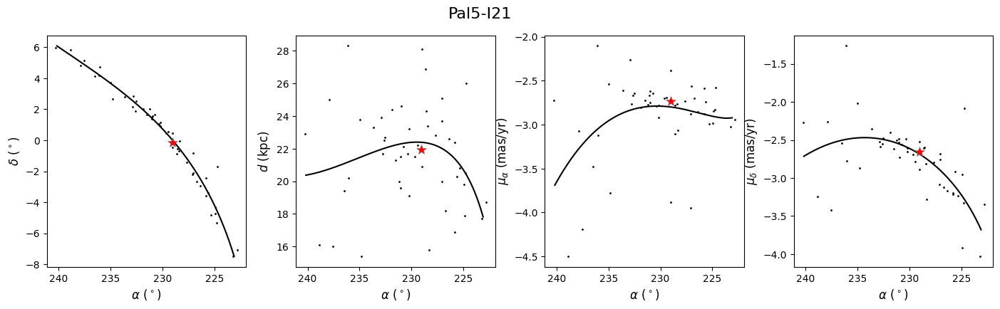

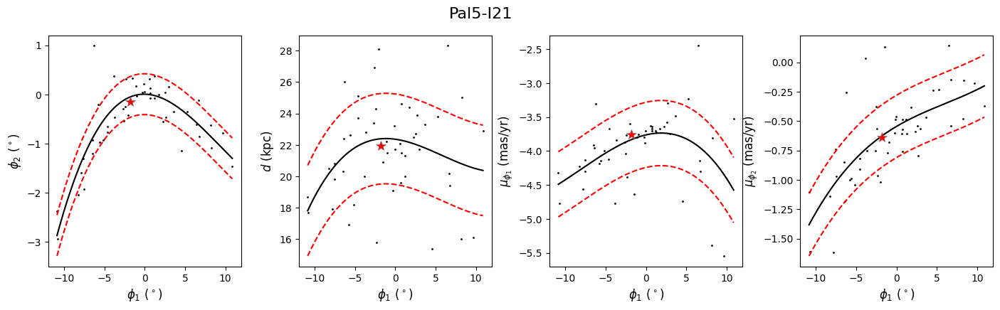

In [53]:
glob_st = glob_g.transform_to(mwsts['Pal5-I21'].stream_frame)

Pal5_I21 = I21[I21.StreamName=='Pal5']

Pal5_I21_g = ac.SkyCoord(ra=np.array(Pal5_I21.ra_epoch2000)*u.deg,
                                  dec=np.array(Pal5_I21.dec_epoch2000)*u.deg,
                                  distance=np.array(Pal5_I21.dis)*u.kpc,
                                  pm_ra_cosdec=np.array(Pal5_I21.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(Pal5_I21.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(Pal5_I21.pmdec))*u.km/u.s)
    
Pal5_I21_c = Pal5_I21_g.transform_to(mwsts['Pal5-I21'].stream_frame)

fphi2 = interp1d(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1.value, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1.value, mwsts['Pal5-I21'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1.value, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1.value, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(Pal5_I21_c.phi1.value)-Pal5_I21_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(Pal5_I21_c.phi1.value)-Pal5_I21_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(Pal5_I21_c.phi1.value)-Pal5_I21_c.pm_phi2.value))
print('width_dist:',np.std(fd(Pal5_I21_c.phi1.value)-Pal5_I21_g.distance.value))

widths.loc['Pal5-I21'].width_phi2 = np.std(fphi2(Pal5_I21_c.phi1.value)-Pal5_I21_c.phi2.value)
widths.loc['Pal5-I21'].width_dist = np.std(fd(Pal5_I21_c.phi1.value)-Pal5_I21_g.distance.value)
widths.loc['Pal5-I21'].width_pmphi1 = np.std(fpmphi1(Pal5_I21_c.phi1.value)-Pal5_I21_c.pm_phi1_cosphi2.value)
widths.loc['Pal5-I21'].width_pmphi2 = np.std(fpmphi2(Pal5_I21_c.phi1.value)-Pal5_I21_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['Pal5-I21'].track.ra, mwsts['Pal5-I21'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(Pal5_I21_g.ra, Pal5_I21_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['Pal5-I21'].track.ra, mwsts['Pal5-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(Pal5_I21_g.ra, Pal5_I21_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['Pal5-I21'].track.ra, mwsts['Pal5-I21'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(Pal5_I21_g.ra, Pal5_I21_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['Pal5-I21'].track.ra, mwsts['Pal5-I21'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(Pal5_I21_g.ra, Pal5_I21_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('Pal5-I21',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(Pal5_I21_c.phi1, Pal5_I21_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi2 + n*widths.loc['Pal5-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi2 - n*widths.loc['Pal5-I21'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(Pal5_I21_c.phi1, Pal5_I21_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.distance + n*widths.loc['Pal5-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.distance - n*widths.loc['Pal5-I21'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(Pal5_I21_c.phi1, Pal5_I21_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['Pal5-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['Pal5-I21'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(Pal5_I21_c.phi1, Pal5_I21_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).pm_phi2 + n*widths.loc['Pal5-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).phi1, mwsts['Pal5-I21'].track.transform_to(mwsts['Pal5-I21'].stream_frame).pm_phi2 - n*widths.loc['Pal5-I21'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)

plt.suptitle('Pal5-I21',fontsize=16);

width_phi2: 0.9025164200022109
width_pmphi1: 0.18054991566830542
width_pmphi2: 0.22357174317830478
width_dist: 0.8531027429454473


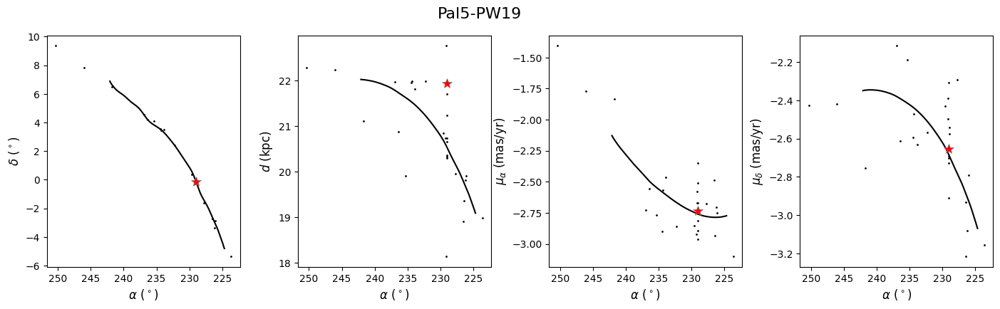

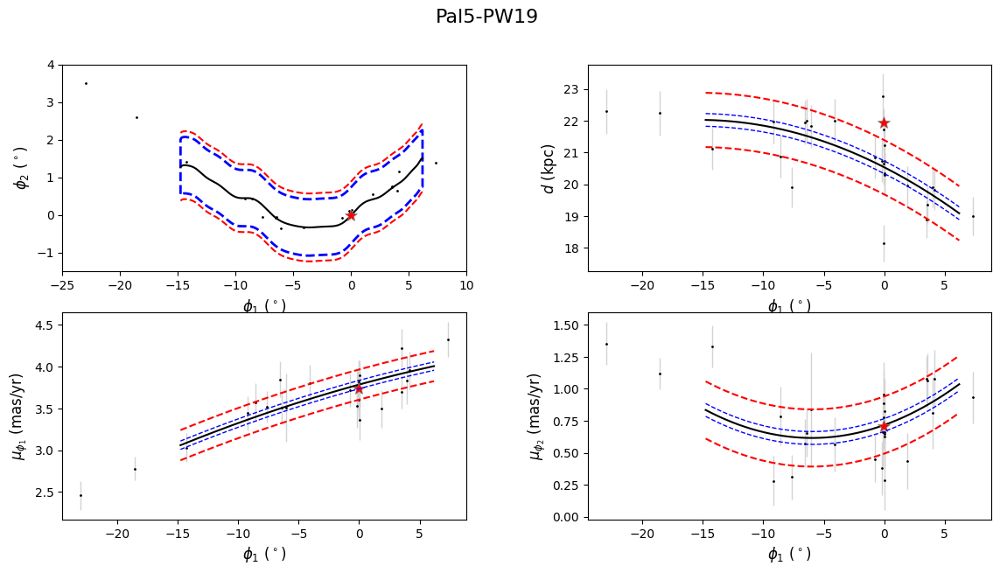

In [56]:
on_poly = mwsts['Pal5-PW19'].create_sky_polygon_footprint_from_track(width=1.5*u.deg, phi2_offset=0.*u.deg)
C_int_Pal5PW19 = [0.05, 0.05, 0.2]

glob_st = glob_g.transform_to(mwsts['Pal5-PW19'].stream_frame)

Pal5_PW19 = pd.DataFrame(Pal5_PW19[(Pal5_PW19['Memb']>0.5) & (Pal5_PW19['Track']==1)])

Pal5_PW19_g = ac.SkyCoord(ra=np.array(Pal5_PW19.RA_ICRS)*u.deg,
                          dec=np.array(Pal5_PW19.DE_ICRS)*u.deg,
                          distance=np.array(Pal5_PW19.Dist)*u.kpc,
                          pm_ra_cosdec=np.array(Pal5_PW19.pmRA)*u.mas/u.yr,
                          pm_dec=np.array(Pal5_PW19.pmDE)*u.mas/u.yr,
                          radial_velocity=np.zeros(len(Pal5_PW19.pmDE))*u.km/u.s)
    
Pal5_PW19_c = Pal5_PW19_g.transform_to(mwsts['Pal5-PW19'].stream_frame)

fphi2 = interp1d(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1.value, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1.value, mwsts['Pal5-PW19'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1.value, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1.value, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(Pal5_PW19_c.phi1.value)-Pal5_PW19_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(Pal5_PW19_c.phi1.value)-Pal5_PW19_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(Pal5_PW19_c.phi1.value)-Pal5_PW19_c.pm_phi2.value))
print('width_dist:',np.std(fd(Pal5_PW19_c.phi1.value)-Pal5_PW19_g.distance.value))

widths.loc['Pal5-PW19'].width_phi2 = np.std(fphi2(Pal5_PW19_c.phi1.value)-Pal5_PW19_c.phi2.value)
widths.loc['Pal5-PW19'].width_dist = np.std(fd(Pal5_PW19_c.phi1.value)-Pal5_PW19_g.distance.value)
widths.loc['Pal5-PW19'].width_pmphi1 = np.std(fpmphi1(Pal5_PW19_c.phi1.value)-Pal5_PW19_c.pm_phi1_cosphi2.value)
widths.loc['Pal5-PW19'].width_pmphi2 = np.std(fpmphi2(Pal5_PW19_c.phi1.value)-Pal5_PW19_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['Pal5-PW19'].track.ra, mwsts['Pal5-PW19'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(Pal5_PW19_g.ra, Pal5_PW19_g.dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['Pal5-PW19'].track.ra, mwsts['Pal5-PW19'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(Pal5_PW19_g.ra, Pal5_PW19_g.distance,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['Pal5-PW19'].track.ra, mwsts['Pal5-PW19'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(Pal5_PW19_g.ra, Pal5_PW19_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_ra_cosdec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['Pal5-PW19'].track.ra, mwsts['Pal5-PW19'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(Pal5_PW19_g.ra, Pal5_PW19_g.pm_dec,'.k',ms=2)
ax.plot(glob_g.ra, glob_g.pm_dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('Pal5-PW19',fontsize=16);

n=2
fig2=plt.figure(2,figsize=(12,8))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(221)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(Pal5_PW19_c.phi1, Pal5_PW19_c.phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi2 + n*widths.loc['Pal5-PW19'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi2 - n*widths.loc['Pal5-PW19'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(on_poly.phi1, on_poly.phi2, '--', c='blue', lw=2)
# ax2.plot(on_poly2.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, on_poly2.transform_to(mwsts['Pal5-PW19'].stream_frame).phi2,'--',c='green',lw=1.5)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)
ax2.set_xlim(-25,10)
ax2.set_ylim(-1.5,4)

ax2=fig2.add_subplot(222)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.distance,'-k', lw=1.5, zorder=99)
ax2.errorbar(x=Pal5_PW19_c.phi1.value, y=Pal5_PW19_g.distance.value, yerr=e_d[star_PW], lw=0, elinewidth=1, color='lightgray', zorder=0)
ax2.plot(Pal5_PW19_c.phi1, Pal5_PW19_g.distance,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.distance + n*widths.loc['Pal5-PW19'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.distance - n*widths.loc['Pal5-PW19'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.distance + C_int_Pal5PW19[2]*u.kpc,'--',c='blue',lw=1.,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.distance - C_int_Pal5PW19[2]*u.kpc,'--',c='blue',lw=1.,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(223)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.errorbar(x=data_PW_st[star_PW].phi1.value, y=data_PW_st[star_PW].pm_phi1_cosphi2.value, yerr=e_pmphi1[star_PW], lw=0, elinewidth=1, color='lightgray', zorder=0)
ax2.plot(Pal5_PW19_c.phi1, Pal5_PW19_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['Pal5-PW19'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['Pal5-PW19'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi1_cosphi2 + C_int_Pal5PW19[0]*u.mas/u.yr,'--',c='blue',lw=1.,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi1_cosphi2 - C_int_Pal5PW19[0]*u.mas/u.yr,'--',c='blue',lw=1.,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)
# ax2.set_xlim(-20,10)
# ax2.set_ylim(1,6)

ax2=fig2.add_subplot(224)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.errorbar(x=data_PW_st[star_PW].phi1.value, y=data_PW_st[star_PW].pm_phi2.value, yerr=e_pmphi2[star_PW], lw=0, elinewidth=1, color='lightgray', zorder=0)
ax2.plot(Pal5_PW19_c.phi1, Pal5_PW19_c.pm_phi2,'.k',ms=2)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi2 + n*widths.loc['Pal5-PW19'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi2 - n*widths.loc['Pal5-PW19'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi2 + C_int_Pal5PW19[1]*u.mas/u.yr,'--',c='blue',lw=1.,zorder=102)
ax2.plot(mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, mwsts['Pal5-PW19'].track.transform_to(mwsts['Pal5-PW19'].stream_frame).pm_phi2 - C_int_Pal5PW19[1]*u.mas/u.yr,'--',c='blue',lw=1.,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)
# ax2.set_xlim(-20,10)
# ax2.set_ylim(-2.5,2.5)

plt.suptitle('Pal5-PW19',fontsize=16);

In [57]:
f = fits.open('../catalogs/streams/pal5/RRLwithprobthin.fit')
data = f[1].data
star_PW = (data.Memb>0.5) & (data.Track==1)

data_PW_g = ac.SkyCoord(ra=data.RA_ICRS*u.deg,
                      dec=data.DE_ICRS*u.deg,
                      distance=data.Dist*u.kpc,
                      pm_ra_cosdec=data.pmRA*u.mas/u.yr,
                      pm_dec=data.pmDE*u.mas/u.yr,
                      radial_velocity=np.zeros(len(data.RA_ICRS))*u.km/u.s)

data_PW_st = data_PW_g.transform_to(mwsts['Pal5-PW19'].stream_frame)

Table(data)
C_pm = [None for n in range(len(data['e_pmRA']))]  
for i in range(len(data['e_pmRA'])):
    C_pm[i] = np.array([[data['e_pmRA'][i]**2, 0],
                        [0, data['e_pmDE'][i]**2]])

c = ac.ICRS(ra=data['RA_ICRS']*u.degree, dec=data['DE_ICRS']*u.degree, distance=data['Dist']*u.kpc, 
            pm_ra_cosdec=data['pmRA']*u.mas/u.yr, pm_dec=data['pmDE']*u.mas/u.yr, 
            radial_velocity=np.zeros(len(data['pmRA']))*u.km/u.s)
C_pm_radec = np.array(C_pm)
C_pm = gc.transform_pm_cov(c, C_pm_radec, mwsts['Pal5-PW19'].stream_frame) #Transformo matriz cov de pm al frame del stream
e_pmphi1 = (C_pm[:,0,0]+0.05**2)**0.5
e_pmphi2 = (C_pm[:,1,1]+0.05**2)**0.5
e_d = ((data['Dist']*0.03)**2+0.2**2)**0.5

In [58]:
widths.loc['Pal5-PW19']

width_phi2      0.902516
width_dist      0.853103
width_pmphi1     0.18055
width_pmphi2    0.223572
Name: Pal5-PW19, dtype: object

## Tucana III

In [59]:
Tucana_g = ac.SkyCoord(ra=359.15*u.deg,
                      dec=-59.15*u.deg,
                      distance=25.1*u.kpc) #Drlica-Wagner
Tucana_st = Tucana_g.transform_to(mwsts['TucanaIII-S19'].stream_frame)

width_phi2: 0.11481448165553307
width_pmphi1: 0.09171574892785242
width_pmphi2: 0.07066282098367142
width_dist: 4.901305129373262


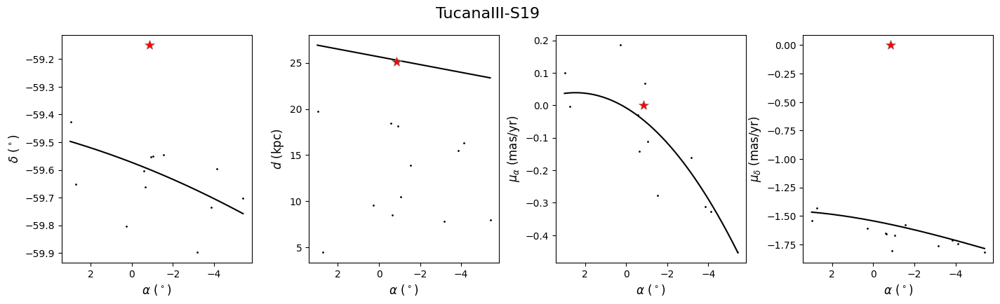

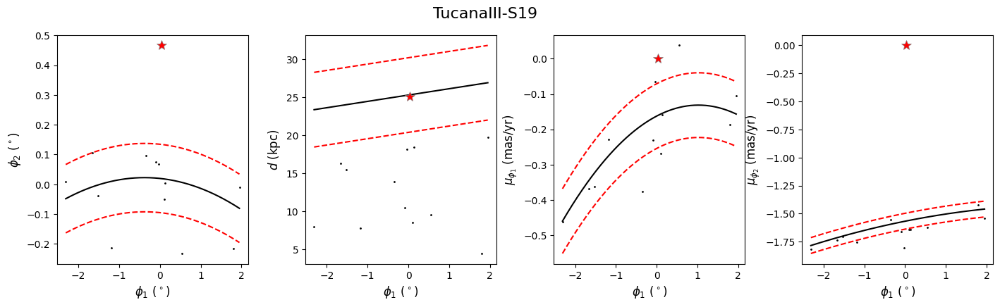

In [60]:
pd.set_option('display.max_columns', None)
TucIII_S19 = S19[S19.Stream=='TucanaIII']
TucIII_S19 = TucIII_S19[TucIII_S19.parallax>0.05]

TucIII_S19_g = ac.SkyCoord(ra=np.array(TucIII_S19.ra_epoch2000)*u.deg,
                                  dec=np.array(TucIII_S19.dec_epoch2000)*u.deg,
                                  distance=np.array(1/TucIII_S19.parallax)*u.kpc,
                                  pm_ra_cosdec=np.array(TucIII_S19.pmra)*u.mas/u.yr,
                                  pm_dec=np.array(TucIII_S19.pmdec)*u.mas/u.yr,
                                  radial_velocity=np.zeros(len(TucIII_S19.pmdec))*u.km/u.s)
    
TucIII_S19_c = TucIII_S19_g.transform_to(mwsts['TucanaIII-S19'].stream_frame)

fphi2 = interp1d(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1.value, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi2.value, fill_value='extrapolate')
fd = interp1d(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1.value, mwsts['TucanaIII-S19'].track.distance.value, fill_value='extrapolate')
fpmphi1 = interp1d(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1.value, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).pm_phi1_cosphi2.value, fill_value='extrapolate')
fpmphi2 = interp1d(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1.value, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).pm_phi2.value, fill_value='extrapolate')

print('width_phi2:',np.std(fphi2(TucIII_S19_c.phi1.value)-TucIII_S19_c.phi2.value))
print('width_pmphi1:',np.std(fpmphi1(TucIII_S19_c.phi1.value)-TucIII_S19_c.pm_phi1_cosphi2.value))
print('width_pmphi2:',np.std(fpmphi2(TucIII_S19_c.phi1.value)-TucIII_S19_c.pm_phi2.value))
print('width_dist:',np.std(fd(TucIII_S19_c.phi1.value)-TucIII_S19_g.distance.value))

widths.loc['TucanaIII-S19'].width_phi2 = np.std(fphi2(TucIII_S19_c.phi1.value)-TucIII_S19_c.phi2.value)
widths.loc['TucanaIII-S19'].width_dist = np.std(fd(TucIII_S19_c.phi1.value)-TucIII_S19_g.distance.value)
widths.loc['TucanaIII-S19'].width_pmphi1 = np.std(fpmphi1(TucIII_S19_c.phi1.value)-TucIII_S19_c.pm_phi1_cosphi2.value)
widths.loc['TucanaIII-S19'].width_pmphi2 = np.std(fpmphi2(TucIII_S19_c.phi1.value)-TucIII_S19_c.pm_phi2.value)


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(141)
ax.plot(mwsts['TucanaIII-S19'].track.ra.wrap_at(180*u.deg), mwsts['TucanaIII-S19'].track.dec,'-k', lw=1.5, zorder=99)
ax.plot(TucIII_S19_g.ra.wrap_at(180*u.deg), TucIII_S19_g.dec,'.k',ms=2)
ax.plot(Tucana_g.ra.wrap_at(180*u.deg), Tucana_g.dec, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(142)
ax.plot(mwsts['TucanaIII-S19'].track.ra.wrap_at(180*u.deg), mwsts['TucanaIII-S19'].track.distance,'-k', lw=1.5, zorder=99)
ax.plot(TucIII_S19_g.ra.wrap_at(180*u.deg), TucIII_S19_g.distance,'.k',ms=2)
ax.plot(Tucana_g.ra.wrap_at(180*u.deg), Tucana_g.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$d$ (kpc)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(143)
ax.plot(mwsts['TucanaIII-S19'].track.ra.wrap_at(180*u.deg), mwsts['TucanaIII-S19'].track.pm_ra_cosdec,'-k', lw=1.5,zorder=99)
ax.plot(TucIII_S19_g.ra.wrap_at(180*u.deg), TucIII_S19_g.pm_ra_cosdec,'.k',ms=2)
ax.plot(Tucana_g.ra.wrap_at(180*u.deg), 0, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\\alpha$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

ax=fig.add_subplot(144)
ax.plot(mwsts['TucanaIII-S19'].track.ra.wrap_at(180*u.deg), mwsts['TucanaIII-S19'].track.pm_dec,'-k', lw=1.5,zorder=100)
ax.plot(TucIII_S19_g.ra.wrap_at(180*u.deg), TucIII_S19_g.pm_dec,'.k',ms=2)
ax.plot(Tucana_g.ra.wrap_at(180*u.deg), 0, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax.set_xlabel('$\\alpha$ ($^\circ$)',fontsize=12)
ax.set_ylabel('$\mu_\delta$ (mas/yr)',fontsize=12)
ax.invert_xaxis()

plt.suptitle('TucanaIII-S19',fontsize=16);


fig2=plt.figure(2,figsize=(15,5))    
fig2.subplots_adjust(wspace=0.3,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax2=fig2.add_subplot(141)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi2,'-k', lw=1.5, zorder=99)
ax2.plot(TucIII_S19_c.phi1, TucIII_S19_c.phi2,'.k',ms=2)
ax2.plot(Tucana_st.phi1, Tucana_st.phi2, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi2 + n*widths.loc['TucanaIII-S19'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi2 - n*widths.loc['TucanaIII-S19'].width_phi2*u.deg/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\phi_2$ ($^\circ$)',fontsize=12)

ax2=fig2.add_subplot(142)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.distance,'-k', lw=1.5, zorder=99)
ax2.plot(TucIII_S19_c.phi1, TucIII_S19_c.distance,'.k',ms=2)
ax2.plot(Tucana_st.phi1, Tucana_st.distance, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.distance + n*widths.loc['TucanaIII-S19'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.distance - n*widths.loc['TucanaIII-S19'].width_dist*u.kpc/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$d$ (kpc)',fontsize=12)

ax2=fig2.add_subplot(143)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).pm_phi1_cosphi2,'-k', lw=1.5,zorder=99)
ax2.plot(TucIII_S19_c.phi1, TucIII_S19_c.pm_phi1_cosphi2,'.k',ms=2)
ax2.plot(Tucana_st.phi1, 0, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).pm_phi1_cosphi2 + n*widths.loc['TucanaIII-S19'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).pm_phi1_cosphi2 - n*widths.loc['TucanaIII-S19'].width_pmphi1*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)',fontsize=12)

ax2=fig2.add_subplot(144)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).pm_phi2,'-k', lw=1.5,zorder=100)
ax2.plot(TucIII_S19_c.phi1, TucIII_S19_c.pm_phi2,'.k',ms=2)
ax2.plot(Tucana_st.phi1, 0, '*', c='gray', mfc='red',ms=10, mew=.5,zorder=101)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).pm_phi2 + n*widths.loc['TucanaIII-S19'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.plot(mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).phi1, mwsts['TucanaIII-S19'].track.transform_to(mwsts['TucanaIII-S19'].stream_frame).pm_phi2 - n*widths.loc['TucanaIII-S19'].width_pmphi2*u.mas/u.yr/2,'--',c='red',lw=1.5,zorder=102)
ax2.set_xlabel('$\phi_1$ ($^\circ$)',fontsize=12)
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)',fontsize=12)


plt.suptitle('TucanaIII-S19',fontsize=16);

## Resumen

In [61]:
widths.sort_values('TrackName')

,width_phi2,width_dist,width_pmphi1,width_pmphi2
TrackName,,,,
Fimbulthul-I21,1.615398,0.297206,1.298302,0.9663
Fjorm-I21,1.208934,0.933187,0.941996,0.544913
Gjoll-I21,0.693553,0.245285,1.009405,0.284369
M2-G22,0.818921,0.0,0.186119,0.180632
M2-I21,0.218136,0.97619,0.378506,0.21466
M5-G19,1.162249,0.063745,0.497548,0.383908
M5-I21,0.415699,0.608762,0.816215,0.910467
M68-I21,0.443117,0.394229,0.784263,0.381131
M68-P19,0.684169,3.011427,0.287443,0.452563


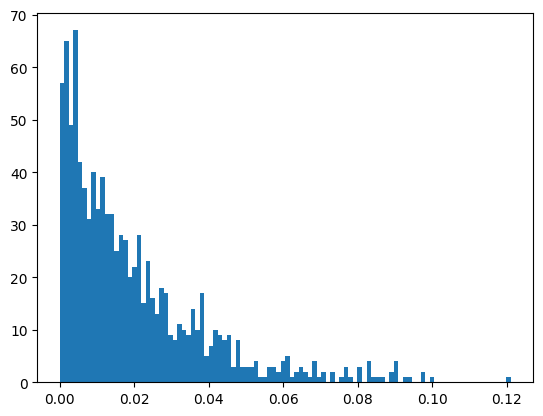

In [38]:
error_dist = np.random.exponential(size=1000)/50
plt.hist(error_dist, bins=100);


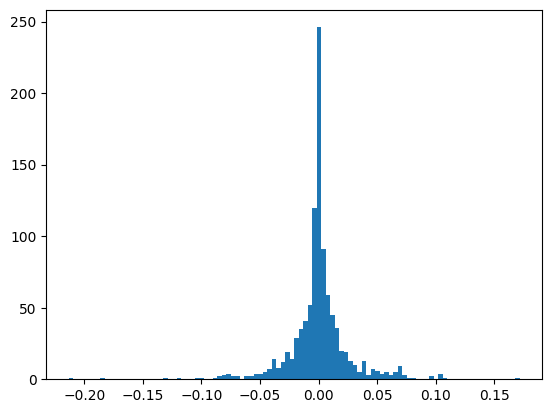

In [39]:
vals = np.array([np.random.normal(scale=e) for e in error_dist])
plt.hist(vals,bins=100);

In [41]:
print(np.std(error_dist))
np.std(vals)

0.01922994304389961


0.02689766300770859

# Pal 5

In [86]:
st = 'Pal5-PW19'
Name = 'Pal 5'
Name_d = 'Pal_5'

mwsts = galstreams.MWStreams(verbose=False, implement_Off=True)

scat_kwds = dict(marker='.',label=st, s=1)#, fontsize=10)
# galstreams.plot_5D_tracks_subplots_row(mwsts[st].track, frame = ac.ICRS(), show_ylabels=True, )
# galstreams.plot_5D_tracks_subplots_row(mwsts[st].track, frame = ac.Galactic(), show_ylabels=True, )

# galstreams.plot_5D_tracks_subplots_row(mwsts[st].track, frame = mwsts[st].stream_frame, show_ylabels=True, scat_kwds=scat_kwds)

Initializing galstreams library from master_log... 


In [87]:
widths = pd.read_csv('../census/widths_st_cluster.csv').set_index('TrackName')
widths_st = widths.loc[st]

In [88]:
phi1_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).phi1
phi2_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).phi2
pmphi1_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).pm_phi1_cosphi2
pmphi2_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).pm_phi2
d_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).distance

n = 1.5 #n>1
phi1o = min(phi1_t.deg)
phi1f = max(phi1_t.deg)
phi2o = min(phi2_t.deg) - 2*widths_st.width_phi2
phi2f = max(phi2_t.deg) + 2*widths_st.width_phi2

l_phi1 = phi1f - phi1o
l_phi2 = phi2f - phi2o

phi1_lim = (phi1o - (n-1)/2*l_phi1, phi1f + (n-1)/2*l_phi1)
phi2_lim = (phi2o - (n-1)/2*l_phi2, phi2f + (n-1)/2*l_phi2)

print(phi1_lim)
print(phi2_lim)

(-20.009499044662583, 11.440178969265961)
(-3.4062152805400396, 4.574307070149793)


In [96]:
_tbl = Table.read('../catalogs/gaiaDR3/masterv4.rrls.gapzo.gdr3-full.csv.gz', format='ascii.csv')
_tbl_dist = Table.read('../catalogs/gaiaDR3/masterv4.rrls.gapzo.dist.short.csv.gz', format='ascii.csv') #OverflowError warning
_tbl['Dist'] = _tbl_dist['Dist']
_tbl['Dist_err'] = _tbl_dist['Dist_err']
_tbl['metallicity_gaia'] = _tbl_dist['metallicity_gaia']


def skip_mask_gc(ra, dec):
    c1 = ac.SkyCoord(ra, dec)
    c2 = ac.SkyCoord(skip_globs['RAJ2000']*u.deg, skip_globs['DEJ2000']*u.deg)

    mask = np.ones(len(ra), dtype=bool)
    for c in c2:
        mask &= c1.separation(c) > 0.5*u.deg

    return mask

def skip_mask_galax(ra, dec):
    c1 = ac.SkyCoord(ra, dec)
    c2 = ac.SkyCoord(Angle(darwf_galax['RAJ2000'] + 'hours').value*15*u.deg, Angle(darwf_galax['DEJ2000'] + 'degrees').value*u.deg)

    mask = np.ones(len(ra), dtype=bool)
    for c in c2:
        mask &= c1.separation(c) > 0.5*u.deg

    return mask

In [ ]:
f = fits.open('../catalogs/globular_clusters_Vasiliev&Baumgardt2021.fit')
globs = f[1].data
globs_ = globs[globs['Name'] == Name]

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')
globs_d_ = globs_d[globs_d.Cluster == Name_d]


glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                      dec=globs_.DEJ2000[0]*u.deg,
                      distance=float(globs_d_.Rsun.values[0])*u.kpc,
                      pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                      pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                      radial_velocity=0*u.km/u.s)

glob_st = glob_g.transform_to(mwsts[st].stream_frame)


f = fits.open('../catalogs/darwf_galaxies_localgroup_McConnachie2012.fit')
darwf_galax = f[1].data



In [97]:
# rao = min(mwsts[st].track.ra.deg) - (max(mwsts[st].track.ra.deg)-min(mwsts[st].track.ra.deg))/4
# raf = max(mwsts[st].track.ra.deg) + (max(mwsts[st].track.ra.deg)-min(mwsts[st].track.ra.deg))/4
# deco = min(mwsts[st].track.dec.deg) - (max(mwsts[st].track.dec.deg)-min(mwsts[st].track.dec.deg))/2
# decf = max(mwsts[st].track.dec.deg) + (max(mwsts[st].track.dec.deg)-min(mwsts[st].track.dec.deg))/2
do = min(mwsts[st].track.distance.kpc) - (max(mwsts[st].track.distance.kpc)-min(mwsts[st].track.distance.kpc))*3
df = max(mwsts[st].track.distance.kpc) + (max(mwsts[st].track.distance.kpc)-min(mwsts[st].track.distance.kpc))*3

# ra_lim = (rao, raf)
# dec_lim = (deco, decf)
d_lim = (do, df)

#pal5
# d_lim = (10, 35)
# ra_lim = (215, 255)
# dec_lim = (-15, 10)


g_all = GaiaData(_tbl)
c_all = g_all.get_skycoord(distance=g_all.Dist*u.kpc, radial_velocity = np.zeros(len(g_all.Dist))*u.km/u.s)
c_all_st = c_all.transform_to(mwsts[st].stream_frame)

# mask1 =  (g_all.ra > ra_lim[0]*u.deg) & (g_all.ra < ra_lim[1]*u.deg) & \
#         (g_all.dec > dec_lim[0]*u.deg) & (g_all.dec < dec_lim[1]*u.deg) & \
#         (g_all.pmra.value!=1e20) & (g_all.pmdec.value != 1e20) & \
#         (g_all.pmra.value != 0.) & (g_all.pmdec.value != 0.) & \
#         (g_all.Dist > d_lim[0]) & (g_all.Dist < d_lim[1])

mask1 = (c_all_st.phi1 > phi1_lim[0]*u.deg) & (c_all_st.phi1 < phi1_lim[1]*u.deg) & \
        (c_all_st.phi2 > phi2_lim[0]*u.deg) & (c_all_st.phi2 < phi2_lim[1]*u.deg) & \
        (g_all.pmra.value!=1e20) & (g_all.pmdec.value != 1e20) & \
        (g_all.pmra.value != 0.) & (g_all.pmdec.value != 0.) & \
        (g_all.Dist > d_lim[0]) & (g_all.Dist < d_lim[1])

skip_globs = globs[(globs['RAJ2000'] > min(g_all.ra.value[mask1])) & (globs['RAJ2000'] < max(g_all.ra.value[mask1])) & 
                   (globs['DEJ2000'] > min(g_all.dec.value[mask1])) & (globs['DEJ2000'] < max(g_all.dec.value[mask1])) &
                   (globs['Name'] != Name)]

# skip_galax = darwf_galax[(Angle(darwf_galax['RAJ2000'] + 'hours').value*15 > min((g_all.ra.value[mask1]))) & 
#                          (Angle(darwf_galax['RAJ2000'] + 'hours').value*15 < max((g_all.ra.value[mask1]))) & 
#                          (Angle(darwf_galax['DEJ2000'] + 'degrees').value > min((g_all.dec.value[mask1]))) & 
#                          (Angle(darwf_galax['DEJ2000'] + 'degrees').value < max((g_all.dec.value[mask1])))]

mask =  mask1 & \
        skip_mask_gc(g_all.ra, g_all.dec) & \
        skip_mask_galax(g_all.ra, g_all.dec)


g_all = g_all[mask]
c_all = c_all[mask]
c_all_st = c_all_st[mask]

phi1 = c_all_st.phi1 #deg
phi2 = c_all_st.phi2 #deg
pmphi1 = c_all_st.pm_phi1_cosphi2 #mas/yr
pmphi2 = c_all_st.pm_phi2 #mas/yr
d = g_all.Dist #kpc
e_d = g_all.Dist_err #kpc

y = np.array([pmphi1.value, pmphi2.value, d])

ra = g_all.ra.value #deg
dec = g_all.dec.value #deg

pmra = c_all.pm_ra_cosdec.value #data['pmRA'][mask] #mas/yr
e_pmra = g_all.pmra_error.value #mas/yr
pmdec = c_all.pm_dec.value #data['pmDE'][mask] #mas/yr
e_pmdec = g_all.pmdec_error.value #mas/yr
pmra_pmdec_corr = g_all.pmra_pmdec_corr


#Matriz de covarianza de las estrellas intrinsica + observacional 
C_pm_radec = g_all.get_cov()[:, 3:5, 3:5]
C_pm = gc.transform_pm_cov(c_all, C_pm_radec, mwsts[st].stream_frame)
C_obs = np.zeros((len(e_pmra),3,3)) #Matriz de covarianza observacional en el frame del stream
C_obs[:,:2,:2] = C_pm
C_obs[:,2,2] = e_d**2


C_int = np.diag([0.05, 0.05, 0.2])**2 #HACK, mas/yr, mas/yr, kpc
C_tot = C_int + C_obs

# C_tot = C_obs
# C_tot[:,0,0] = np.full(C_obs.shape[0], widths_st.width_pmphi1**2)
# C_tot[:,1,1] = np.full(C_obs.shape[0], widths_st.width_pmphi2**2)

width = 2*widths_st.width_phi2 # width = 1.5 #HACK

field = ac.SkyCoord(ra=ra*u.deg, dec=dec*u.deg, frame='icrs')
on_poly = mwsts[st].create_sky_polygon_footprint_from_track(width=width*u.deg, phi2_offset=0.*u.deg)
footprint = galstreams.get_mask_in_poly_footprint(on_poly, field, stream_frame=mwsts[st].stream_frame)

off_poly1 = mwsts[st].create_sky_polygon_footprint_from_track(width=3*widths_st.width_phi2*u.deg, phi2_offset=2.5*widths_st.width_phi2*u.deg)
off_poly2 = mwsts[st].create_sky_polygon_footprint_from_track(width=3*widths_st.width_phi2*u.deg, phi2_offset=-2.5*widths_st.width_phi2*u.deg)
off_footprint1 = galstreams.get_mask_in_poly_footprint(off_poly1, field, stream_frame=mwsts[st].stream_frame)
off_footprint2 = galstreams.get_mask_in_poly_footprint(off_poly2, field, stream_frame=mwsts[st].stream_frame)
off_footprint = off_footprint1 | off_footprint2

ra_lim = (min(g_all.ra.value),max(g_all.ra.value))
dec_lim = (min(g_all.dec.value),max(g_all.dec.value))
print(d_lim)

(10.28271090213515, 30.82893131699086)


In [98]:
widths_st

width_phi2      0.870904
width_dist      1.151671
width_pmphi1    0.379799
width_pmphi2    0.294210
Name: Pal5-PW19, dtype: float64

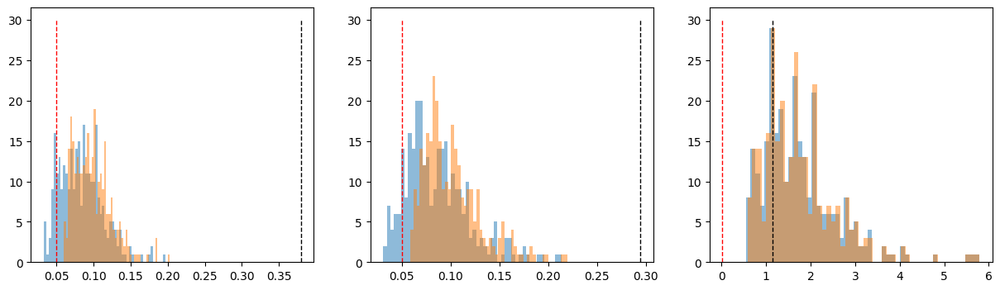

In [99]:
plt.figure(figsize=(15,4))
plt.subplot(131)
plt.hist(C_obs[:,0,0]**0.5,bins=50,alpha=.5)
plt.hist(C_tot[:,0,0]**0.5,bins=50,alpha=.5)
plt.vlines(0.05,0,30,color='red',ls='--',lw=1)
plt.vlines(widths_st.width_pmphi1,0,30,color='black',ls='--',lw=1)

plt.subplot(132)
plt.hist(C_obs[:,1,1]**0.5,bins=50,alpha=.5)
plt.hist(C_tot[:,1,1]**0.5,bins=50,alpha=.5)
plt.vlines(0.05,0,30,color='red',ls='--',lw=1)
plt.vlines(widths_st.width_pmphi2,0,30,color='black',ls='--',lw=1)

plt.subplot(133)
plt.hist(C_obs[:,2,2]**0.5,bins=50,alpha=.5)
plt.hist(C_tot[:,2,2]**0.5,bins=50,alpha=.5)
plt.vlines(0.02,0,30,color='red',ls='--',lw=1)
plt.vlines(widths_st.width_dist,0,30,color='black',ls='--',lw=1)

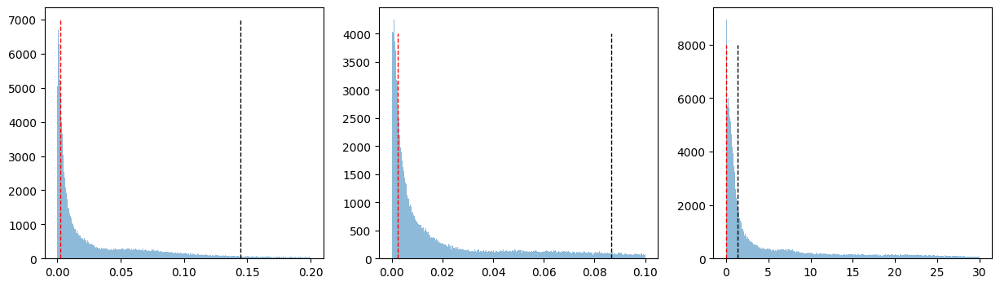

In [132]:
_tbl = Table.read('../catalogs/gaiaDR3/masterv4.rrls.gapzo.gdr3-full.csv.gz', format='ascii.csv')
_tbl_dist = Table.read('../catalogs/gaiaDR3/masterv4.rrls.gapzo.dist.short.csv.gz', format='ascii.csv') #OverflowError warning
_tbl['Dist'] = _tbl_dist['Dist']
_tbl['Dist_err'] = _tbl_dist['Dist_err']
_tbl['metallicity_gaia'] = _tbl_dist['metallicity_gaia']

g_all2 = GaiaData(_tbl)
g_all2 = g_all2[(g_all2.pmra.value<2) & (g_all2.pmra.value>-1e20) & (g_all2.pmdec.value<2) & (g_all2.pmdec.value>-1e20) & (g_all2.Dist<100)]
c_all2 = g_all2.get_skycoord(distance=g_all2.Dist*u.kpc, radial_velocity = np.zeros(len(g_all2.Dist))*u.km/u.s)
C_pm_radec2 = g_all2.get_cov()[:, 3:5, 3:5]
C_pm2 = gc.transform_pm_cov(c_all2, C_pm_radec2, mwsts[st].stream_frame)
C_obs2 = np.zeros((len(g_all2.Dist_err),3,3)) #Matriz de covarianza observacional en el frame del stream
C_obs2[:,:2,:2] = C_pm2
C_obs2[:,2,2] = g_all2.Dist_err**2

plt.figure(figsize=(15,4))
plt.subplot(131)
plt.hist(C_obs2[:,0,0][C_obs2[:,0,0]<.2],bins=500,alpha=.5)
# plt.hist(C_tot[:,0,0],bins=50,alpha=.5)
plt.vlines(0.05**2,0,7000,color='red',ls='--',lw=1)
plt.vlines(widths_st.width_pmphi1**2,0,7000,color='black',ls='--',lw=1)

plt.subplot(132)
plt.hist(C_obs2[:,1,1][C_obs2[:,1,1]<.1],bins=500,alpha=.5)
# plt.hist(C_tot[:,1,1],bins=50,alpha=.5)
plt.vlines(0.05**2,0,4000,color='red',ls='--',lw=1)
plt.vlines(widths_st.width_pmphi2**2,0,4000,color='black',ls='--',lw=1)

plt.subplot(133)
plt.hist(C_obs2[:,2,2][C_obs2[:,2,2]<30],bins=500,alpha=.5)
# plt.hist(C_tot[:,2,2],bins=50,alpha=.5)
plt.vlines(0.02**2,0,8000,color='red',ls='--',lw=1)
plt.vlines(widths_st.width_dist**2,0,8000,color='black',ls='--',lw=1)

In [49]:
on_poly3 = mwsts['Pal5-S20'].create_sky_polygon_footprint_from_track(width=width*u.deg, phi2_offset=0.*u.deg)


In [50]:
27/phi1.shape[0]

0.09246575342465753

In [51]:
#Price-Whelan 2019
f = fits.open('../catalogs/streams/pal5/RRLwithprobthin.fit')
data = f[1].data
star_PW = (data.Memb>0.5) & (data.Track==1)

data_PW_g = ac.SkyCoord(ra=data.RA_ICRS*u.deg,
                      dec=data.DE_ICRS*u.deg,
                      distance=data.Dist*u.kpc,
                      pm_ra_cosdec=data.pmRA*u.mas/u.yr,
                      pm_dec=data.pmDE*u.mas/u.yr,
                      radial_velocity=np.zeros(len(data.RA_ICRS))*u.km/u.s)

data_PW_st = data_PW_g.transform_to(mwsts[st].stream_frame)

skypath = np.loadtxt('../catalogs/streams/pal5/pal5_extended_skypath.icrs.txt')
skypath_N = ac.SkyCoord(ra=skypath[:,0]*u.deg, dec=skypath[:,1]*u.deg, frame='icrs')
skypath_S = ac.SkyCoord(ra=skypath[:,0]*u.deg, dec=skypath[:,2]*u.deg, frame='icrs')

# Concatenate N track, S-flipped track and add first point at the end to close the polygon (needed for ADQL)
on_poly2 = ac.SkyCoord(ra = np.concatenate((skypath_N.ra,skypath_S.ra[::-1],skypath_N.ra[:1])),
                        dec = np.concatenate((skypath_N.dec,skypath_S.dec[::-1],skypath_N.dec[:1])),
                        unit=u.deg, frame='icrs')
footprint2 = galstreams.get_mask_in_poly_footprint(on_poly2, field, stream_frame=mwsts[st].stream_frame)

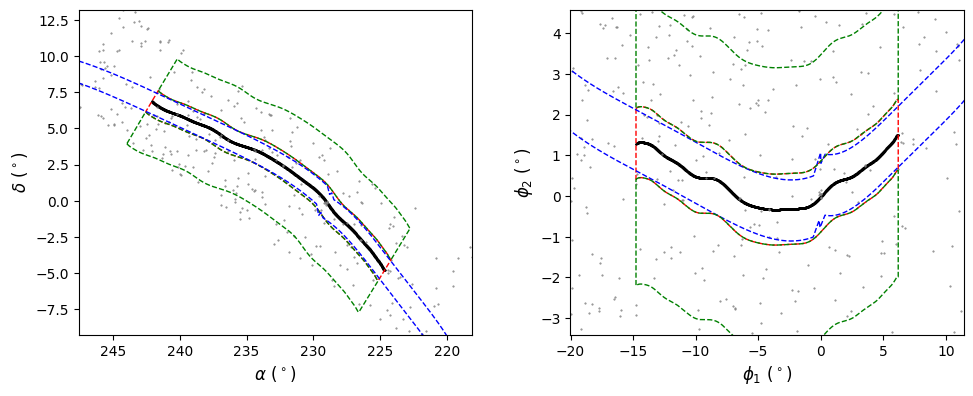

In [137]:
fig=plt.figure(1,figsize=(10,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(121)
ax.plot(mwsts[st].track.ra, mwsts[st].track.dec,'.k', ms=1)
ax.plot(ra,dec,'.', c='gray', ms=1)
ax.plot(on_poly.transform_to(ac.ICRS).ra,on_poly.transform_to(ac.ICRS).dec,'--',c='red',lw=1)
ax.plot(off_poly1.transform_to(ac.ICRS).ra,off_poly1.transform_to(ac.ICRS).dec,'--',c='green',lw=1)
ax.plot(off_poly2.transform_to(ac.ICRS).ra,off_poly2.transform_to(ac.ICRS).dec,'--',c='green',lw=1)
ax.plot(on_poly2.ra, on_poly2.dec,'--',c='blue',lw=1)
ax.set_xlim(ra_lim)
ax.set_ylim(dec_lim)
ax.invert_xaxis()
ax.set_xlabel('$\\alpha$ ($^\circ$)', fontsize=12)
ax.set_ylabel('$\delta$ ($^\circ$)', fontsize=12)

ax=fig.add_subplot(122)
ax.plot(phi1_t, phi2_t,'.k', ms=1)
ax.plot(phi1,phi2,'.', c='gray', ms=1)
ax.plot(on_poly.phi1, on_poly.phi2,'--',c='red',lw=1)
ax.plot(on_poly2.transform_to(mwsts[st].stream_frame).phi1, on_poly2.transform_to(mwsts[st].stream_frame).phi2,'--',c='blue',lw=1)
ax.plot(off_poly1.phi1, off_poly1.phi2,'--',c='green',lw=1)
ax.plot(off_poly2.phi1, off_poly2.phi2,'--',c='green',lw=1)
ax.set_xlim(phi1_lim)
ax.set_ylim(phi2_lim)
# ax.set_xlim([-20,15])
# ax.set_ylim([-3,5])
ax.set_xlabel('$\phi_1$ ($^\circ$)', fontsize=12)
ax.set_ylabel('$\phi_2$ ($^\circ$)', fontsize=12);

N = 2 , BIC = 1601.3847083143276
N = 3 , BIC = 1588.7120380109739
N = 4 , BIC = 1585.0563874971713
N = 5 , BIC = 1599.4325624039602
N = 6 , BIC = 1639.043929547991
N = 7 , BIC = 1650.8465805375029
N = 8 , BIC = 1691.4131366227778
N = 9 , BIC = 1717.9923982956732
N = 10 , BIC = 1771.8969072820303
N = 11 , BIC = 1783.582760365965

N_best: 4 

Delta_BIC[N_best]: [ 16.32832082   3.65565051   0.          14.37617491  53.98754205
  65.79019304 106.35674913 132.9360108  186.84051978 198.52637287] 

Delta_BIC<10:
 [[ True False False  True False False False False False False]
 [False  True  True False False False False False False False]
 [False  True  True False False False False False False False]
 [ True False False  True False False False False False False]
 [False False False False  True False False False False False]
 [False False False False False  True False False False False]
 [False False False False False False  True False False False]
 [False False False False False False False  Tr

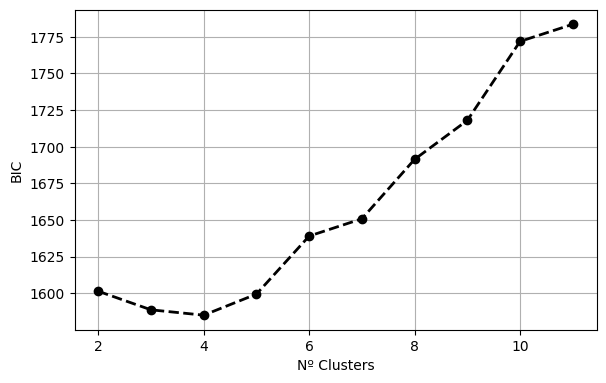

In [77]:
# import datetime

pmra_out, pmdec_out, d_out = pmra[off_footprint], pmdec[off_footprint], d[off_footprint]
C_pm_radec_out, e_d_out = C_pm_radec[off_footprint], e_d[off_footprint]
    
X = np.vstack([pmra_out, pmdec_out, d_out]).T
Xerr = np.zeros(X.shape + X.shape[-1:])
Xerr[:,:2,:2] = C_pm_radec_out
Xerr[:,2,2] = e_d_out**2

# Start = datetime.datetime.now()

xdgmm = XDGMM()
param_range = np.arange(2,12)#N_lim[0],N_lim[1]
# Loop over component numbers, fitting XDGMM model and computing the BIC:
bic, optimal_n_comp, lowest_bic = xdgmm.bic_test(X, Xerr, param_range)

N_best_xd = optimal_n_comp

# End = datetime.datetime.now()
# print('time: ', End-Start,'\n')

Delta_BIC = np.zeros((len(param_range),len(param_range)))
for i in range(len(param_range)):
    for j in range(len(param_range)):
        Delta_BIC[i,j] = bic[i] - bic[j]

# print('BIC:', bic)
print('\nN_best:', optimal_n_comp,'\n')
i_best_xd = np.where(param_range == optimal_n_comp)[0][0]
print('Delta_BIC[N_best]:', Delta_BIC[:,i_best_xd],'\n')
bla = np.abs(Delta_BIC)<10
print('Delta_BIC<10:\n',bla)


fig = plt.figure(1,figsize=(6,4))
fig.subplots_adjust(wspace=0.3,hspace=0.34,top=0.94,bottom=0.14,left=0.12,right=0.99)
ax = fig.add_subplot(111)
ax.plot(param_range, bic, '--k', marker='o', lw=2, ms=6)
ax.grid()
ax.set_xlabel('Nº Clusters')
ax.set_ylabel('BIC');

fig.savefig('../census/bkg/' + st + '_BIC.png')


In [78]:
pmra_out, pmdec_out, d_out = pmra[off_footprint], pmdec[off_footprint], d[off_footprint]
X = np.vstack([pmra_out, pmdec_out, d_out]).T
# N_best_xd = 4

gmm_best = GaussianMixture(n_components=N_best_xd, covariance_type='full', max_iter=1000)
gmm_best.fit(X)
print("GMM_{0} converge:".format(N_best_xd), gmm_best.converged_)

np.save('../census/bkg/' + st + 'w' + str(width) + '_gmm_weights', gmm_best.weights_, allow_pickle=False)
np.save('../census/bkg/' + st + 'w' + str(width) + '_gmm_means', gmm_best.means_, allow_pickle=False)
np.save('../census/bkg/' + st + 'w' + str(width) + '_gmm_covariances', gmm_best.covariances_, allow_pickle=False)

ll_bgn = gmm_best.score_samples(np.vstack([pmra, pmdec, d]).T) #ln_likelihood del fondo para cada estrella n
# ll_bgn

GMM_4 converge: True


In [153]:
d_N = ac.SkyCoord(phi1_t, (d_t.value + 2*widths_st.width_dist)*u.deg, frame=mwsts[st].stream_frame)
d_S = ac.SkyCoord(phi1_t, (d_t.value - 2*widths_st.width_dist)*u.deg, frame=mwsts[st].stream_frame)

pm1_N = ac.SkyCoord(phi1_t, (pmphi1_t.value + 2*widths_st.width_pmphi1)*u.deg, frame=mwsts[st].stream_frame)
pm1_S = ac.SkyCoord(phi1_t, (pmphi1_t.value - 2*widths_st.width_pmphi1)*u.deg, frame=mwsts[st].stream_frame)

pm2_N = ac.SkyCoord(phi1_t, (pmphi2_t.value + 2*widths_st.width_pmphi2)*u.deg, frame=mwsts[st].stream_frame)
pm2_S = ac.SkyCoord(phi1_t, (pmphi2_t.value - 2*widths_st.width_pmphi2)*u.deg, frame=mwsts[st].stream_frame)

# Concatenate N track, S-flipped track and add first point at the end to close the polygon (needed for ADQL)
on_poly_d = ac.SkyCoord(np.concatenate((d_N.phi1,d_S.phi1[::-1],d_N.phi1[:1])),
                        np.concatenate((d_N.phi2,d_S.phi2[::-1],d_N.phi2[:1])),
                        unit=u.deg, frame=mwsts[st].stream_frame)

on_poly_pm1 = ac.SkyCoord(np.concatenate((pm1_N.phi1,pm1_S.phi1[::-1],pm1_N.phi1[:1])),
                        np.concatenate((pm1_N.phi2,pm1_S.phi2[::-1],pm1_N.phi2[:1])),
                        unit=u.deg, frame=mwsts[st].stream_frame)

on_poly_pm2 = ac.SkyCoord(np.concatenate((pm2_N.phi1,pm2_S.phi1[::-1],pm2_N.phi1[:1])),
                        np.concatenate((pm2_N.phi2,pm2_S.phi2[::-1],pm2_N.phi2[:1])),
                        unit=u.deg, frame=mwsts[st].stream_frame)


field_d = ac.SkyCoord(phi1[(d<90) & (pmphi1.value<90) & (pmphi2.value<90)], d[(d<90) & (pmphi1.value<90) & (pmphi2.value<90)]*u.deg, frame=mwsts[st].stream_frame)
footprint_d = galstreams.get_mask_in_poly_footprint(on_poly_d, field_d, stream_frame=mwsts[st].stream_frame)

field_pm1 = ac.SkyCoord(phi1[(d<90) & (pmphi1.value<90) & (pmphi2.value<90)], pmphi1[(d<90) & (pmphi1.value<90) & (pmphi2.value<90)].value*u.deg, frame=mwsts[st].stream_frame)
footprint_pm1 = galstreams.get_mask_in_poly_footprint(on_poly_pm1, field_pm1, stream_frame=mwsts[st].stream_frame)

field_pm2 = ac.SkyCoord(phi1[(d<90) & (pmphi1.value<90) & (pmphi2.value<90)], pmphi2[(d<90) & (pmphi1.value<90) & (pmphi2.value<90)].value*u.deg, frame=mwsts[st].stream_frame)
footprint_pm2 = galstreams.get_mask_in_poly_footprint(on_poly_pm2, field_pm2, stream_frame=mwsts[st].stream_frame)

footprint_f = footprint_d & footprint_pm1 & footprint_pm2
footprint_f.sum()

27

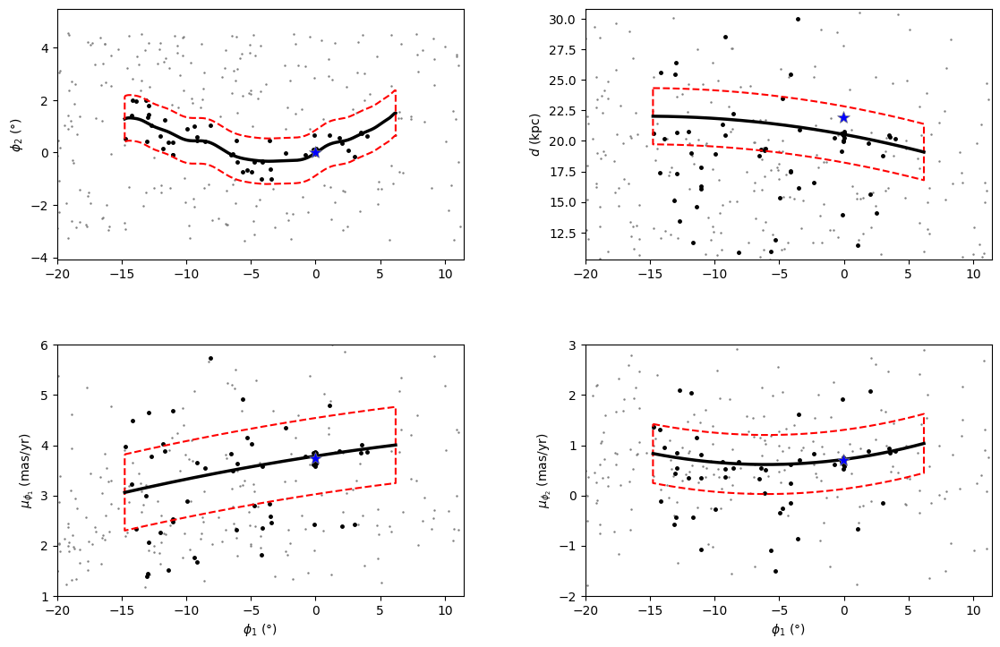

In [152]:
inside = footprint
out = ~footprint

mask_xy = (phi1.value>=phi1_lim[0]) & (phi1.value<phi1_lim[1]) & (phi2.value>=phi2_lim[0]) & (phi2.value<=phi2_lim[1])


fig2=plt.figure(2,figsize=(12,8))
fig2.subplots_adjust(wspace=0.3,hspace=0.34,top=0.95,bottom=0.13,left=0.1,right=0.97)
ax2=fig2.add_subplot(221)
ax2.plot(phi1[inside],phi2[inside],'.', color = 'black', ms=5, label='galst footprint',zorder=0)
ax2.plot(phi1[out],phi2[out],'.',ms=1.5, color = 'gray', label='~footprint')
ax2.plot(phi1_t,phi2_t,'k-',lw=2.5,label='galst track')
ax2.plot(on_poly.transform_to(mwsts[st].stream_frame).phi1, on_poly.transform_to(mwsts[st].stream_frame).phi2, ls='--', lw=1.5, color='red')
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='blue',ms=10, mew=.5)
ax2.set_ylabel('$\phi_2$ (°)')
ax2.set_xlim(phi1_lim)
ax2.set_ylim(np.array(phi2_lim)*1.2)


ax2=fig2.add_subplot(222)
ax2.plot(phi1[inside & mask_xy],d[inside & mask_xy],'.',color='black',ms=5,zorder=1)
ax2.plot(phi1[out & mask_xy],d[out & mask_xy],'.', color='gray',ms=1.5,zorder=0)
ax2.plot(on_poly_d.phi1, on_poly_d.phi2, ls='--', lw=1.5, color='red')
ax2.plot(phi1_t,d_t,'k-',lw=2.5)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='blue',ms=10, mew=.5)
ax2.set_ylabel('$d$ (kpc)')
ax2.set_xlim(phi1_lim)
ax2.set_ylim(d_lim)



ax2=fig2.add_subplot(223)
ax2.plot(phi1[inside & mask_xy],pmphi1[inside & mask_xy],'.', color='black',ms=5,zorder=1)
ax2.plot(phi1[out & mask_xy],pmphi1[out & mask_xy],'.', color='gray',ms=1.5,zorder=0)
ax2.plot(on_poly_pm1.phi1, on_poly_pm1.phi2, ls='--', lw=1.5, color='red')
ax2.plot(phi1_t,pmphi1_t,'k-',lw=2.5)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='blue',ms=10, mew=.5)
ax2.set_xlabel('$\phi_1$ (°)')
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)')
ax2.set_xlim(phi1_lim)
ax2.set_ylim([1,6])



ax2=fig2.add_subplot(224)
ax2.plot(phi1[inside & mask_xy],pmphi2[inside & mask_xy],'.',color='black',ms=5,zorder=1)
ax2.plot(phi1[out & mask_xy],pmphi2[out & mask_xy],'.',color='gray',ms=1.5,zorder=0)
ax2.plot(on_poly_pm2.phi1, on_poly_pm2.phi2, ls='--', lw=1.5, color='red')
ax2.plot(phi1_t,pmphi2_t,'k-',lw=2.5)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='blue',ms=10, mew=.5)
ax2.set_xlabel('$\phi_1$ (°)')
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)')
ax2.set_xlim(phi1_lim)
ax2.set_ylim([-2.,3]);

In [157]:
from scipy.optimize import curve_fit

def model(phi1, a, b, c, d, x):
    return a + b*(phi1-x) + c*(phi1-x)**2 + d*(phi1-x)**3

# def model(phi1, a, b, c, x):
#     return a + b*(phi1-x) + c*(phi1-x)**2

params_mu1, _ = curve_fit(model, phi1_t.value, pmphi1_t.value, maxfev=5000)
params_mu2, _ = curve_fit(model, phi1_t.value, pmphi2_t.value, maxfev=5000)
params_d, _ = curve_fit(model, phi1_t.value, d_t, maxfev=5000)

theta = np.array([params_mu1[0], params_mu2[0], params_d[0], 
                  params_mu1[1], params_mu2[1], params_d[1], 
                  params_mu1[2], params_mu2[2], params_d[2], 
                  params_mu1[3], params_mu2[3], params_d[3], 
                  params_mu1[4], params_mu2[4], params_d[4], 
                  footprint_f.sum()/phi1.shape[0]]) #HACK

# theta = np.array([params_mu1[0], params_mu2[0], params_d[0], 
#                   params_mu1[1], params_mu2[1], params_d[1], 
#                   params_mu1[2], params_mu2[2], params_d[2], 
#                   params_mu1[3], params_mu2[3], params_d[3], 
#                   0.2])
theta

array([ 3.89217784e+00,  8.55031326e-01,  2.00009365e+01,  3.59397416e-02,
        5.20904462e-02, -2.26359402e-01, -6.42299948e-04,  2.83199995e-03,
       -6.32699958e-03,  2.44033974e-12,  6.90748593e-13,  3.06173993e-11,
        2.86828080e+00,  3.21770784e+00,  2.54049810e+00,  9.24657534e-02])

In [156]:
footprint_f.sum()/footprint.sum()

0.09246575342465753

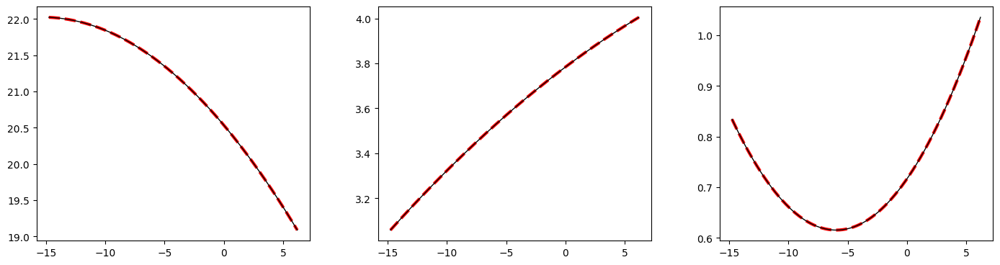

In [23]:
d_ = model(phi1_t.value, params_d[0], params_d[1], params_d[2], params_d[3], params_d[4])
pm1 = model(phi1_t.value, params_mu1[0], params_mu1[1], params_mu1[2], params_mu1[3], params_mu1[4])
pm2 = model(phi1_t.value, params_mu2[0], params_mu2[1], params_mu2[2], params_mu2[3], params_mu2[4])


fig=plt.figure(1,figsize=(15,5))    
fig.subplots_adjust(wspace=0.25,hspace=0.2,top=0.9,bottom=0.25,left=0.095,right=0.98)

ax=fig.add_subplot(131)
ax.plot(phi1_t, d_t,'-k',lw=1)
ax.plot(phi1_t, d_,'--',c='red',lw=3,zorder=1)

ax=fig.add_subplot(132)
ax.plot(phi1_t, pmphi1_t,'-k',lw=1)
ax.plot(phi1_t, pm1,'--',c='red',lw=3,zorder=1)

ax=fig.add_subplot(133)
ax.plot(phi1_t, pmphi2_t,'-k',lw=1)
ax.plot(phi1_t, pm2,'--',c='red',lw=3,zorder=1)


In [80]:
def lnlike_st(theta):

    a_mu1, a_mu2, a_d, b_mu1, b_mu2, b_d, c_mu1, c_mu2, c_d, d_mu1, d_mu2, d_d, x_mu1, x_mu2, x_d, _ = theta

    model_mu1 = model(phi1.value, a_mu1, b_mu1, c_mu1, d_mu1, x_mu1)
    model_mu2 = model(phi1.value, a_mu2, b_mu2, c_mu2, d_mu2, x_mu2)
    model_d = model(phi1.value, a_d, b_d, c_d, d_d, x_d)
    model_ = np.array([model_mu1, model_mu2, model_d])
    
#     a_mu1, a_mu2, a_d, b_mu1, b_mu2, b_d, c_mu1, c_mu2, c_d, x_mu1, x_mu2, x_d, _ = theta

#     model_mu1 = model(phi1.value, a_mu1, b_mu1, c_mu1, x_mu1)
#     model_mu2 = model(phi1.value, a_mu2, b_mu2, c_mu2, x_mu2)
#     model_d = model(phi1.value, a_d, b_d, c_d, x_d)
#     model_ = np.array([model_mu1, model_mu2, model_d])
    
    ll_st = log_multivariate_gaussian(y.T, model_.T, C_tot)
    
    return ll_st

def ln_likelihood(theta):

    f = theta[-1]
    arg1 = np.log(f) + lnlike_st(theta)
    arg2 = np.log(1.-f) + ll_bgn

    return np.logaddexp(arg1, arg2), arg1, arg2

In [158]:
ln_l, arg1 , arg2 = ln_likelihood(theta)

memb = (theta[-1]*np.exp(lnlike_st(theta))/np.exp(ln_l))
star = (memb>0.5) #& footprint
print(star.sum())

22


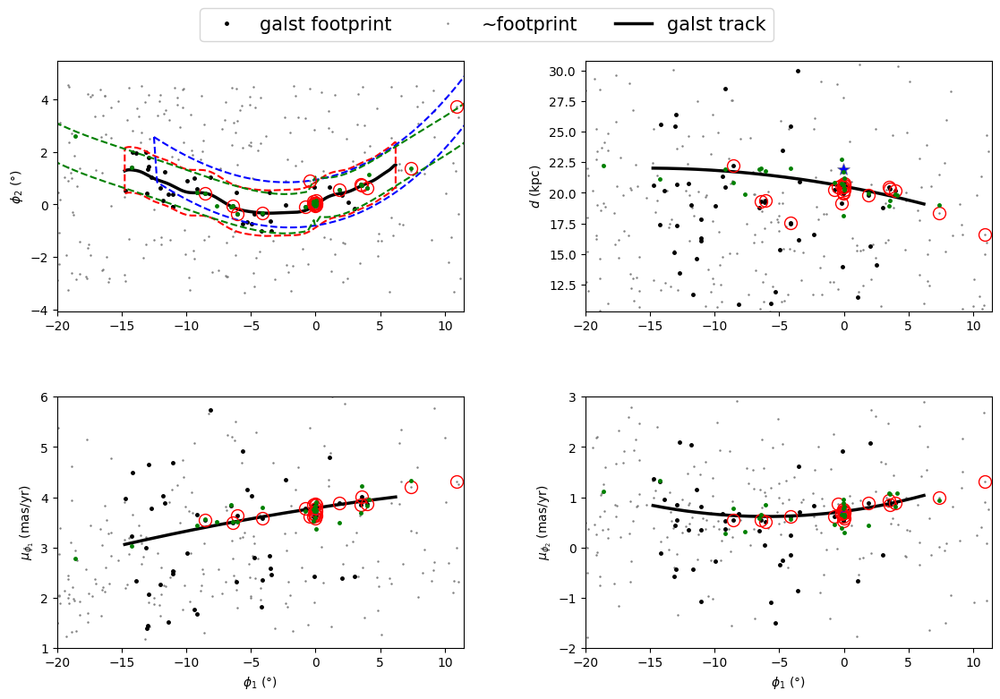

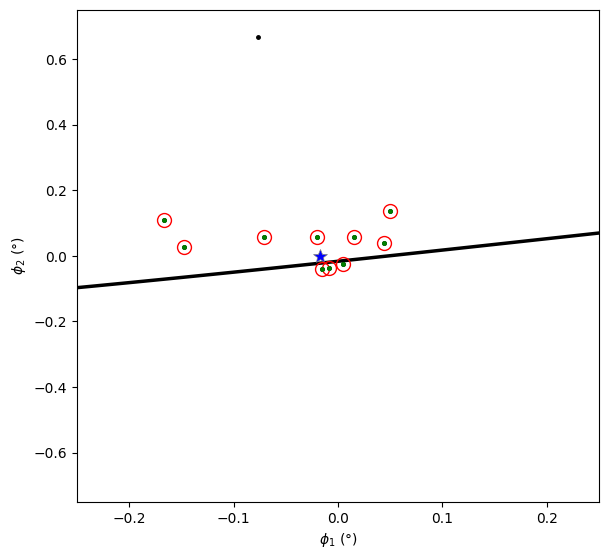

In [95]:
inside = footprint
out = ~footprint

mask_xy = (phi1.value>=phi1_lim[0]) & (phi1.value<phi1_lim[1]) & (phi2.value>=phi2_lim[0]) & (phi2.value<=phi2_lim[1])


fig2=plt.figure(2,figsize=(12,8))
fig2.subplots_adjust(wspace=0.3,hspace=0.34,top=0.95,bottom=0.13,left=0.1,right=0.97)
ax2=fig2.add_subplot(221)
ax2.plot(phi1[inside],phi2[inside],'.', color = 'black', ms=5, label='galst footprint',zorder=0)
ax2.plot(phi1[out],phi2[out],'.',ms=1.5, color = 'gray', label='~footprint')
ax2.plot(phi1_t,phi2_t,'k-',lw=2.5,label='galst track')
ax2.plot(on_poly.transform_to(mwsts[st].stream_frame).phi1, on_poly.transform_to(mwsts[st].stream_frame).phi2, ls='--', lw=1.5, color='red')
ax2.plot(on_poly3.transform_to(mwsts[st].stream_frame).phi1, on_poly3.transform_to(mwsts[st].stream_frame).phi2, ls='--', lw=1.5, color='blue')
ax2.plot(on_poly2.transform_to(mwsts['Pal5-PW19'].stream_frame).phi1, on_poly2.transform_to(mwsts['Pal5-PW19'].stream_frame).phi2,'--',c='green',lw=1.5)
ax2.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='blue',ms=10, mew=.5)
ax2.set_ylabel('$\phi_2$ (°)')
ax2.set_xlim(phi1_lim)
ax2.set_ylim(np.array(phi2_lim)*1.2)

ax2.plot(phi1[star],phi2[star], 'o', c='red', mfc='None', ms=10, mew=1)
ax2.plot(data_PW_st.phi1[star_PW], data_PW_st.phi2[star_PW], '.',c='green',ms=5)  

ax2=fig2.add_subplot(222)
ax2.plot(phi1[inside & mask_xy],d[inside & mask_xy],'.',color='black',ms=5,zorder=1)
ax2.plot(phi1[out & mask_xy],d[out & mask_xy],'.', color='gray',ms=1.5,zorder=0)
ax2.plot(phi1_t,d_t,'k-',lw=2.5)
ax2.plot(glob_st.phi1, glob_st.distance, '*', c='gray', mfc='blue',ms=10, mew=.5)
ax2.set_ylabel('$d$ (kpc)')
ax2.set_xlim(phi1_lim)
ax2.set_ylim(d_lim)

ax2.plot(phi1[star],d[star], 'o', c='red', mfc='None', ms=10, mew=1)
ax2.plot(data_PW_st.phi1[star_PW], data_PW_g.distance[star_PW], '.',c='green',ms=5)  



ax2=fig2.add_subplot(223)
ax2.plot(phi1[inside & mask_xy],pmphi1[inside & mask_xy],'.', color='black',ms=5,zorder=1)
ax2.plot(phi1[out & mask_xy],pmphi1[out & mask_xy],'.', color='gray',ms=1.5,zorder=0)
ax2.plot(phi1_t,pmphi1_t,'k-',lw=2.5)
ax2.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='gray', mfc='blue',ms=10, mew=.5)
ax2.set_xlabel('$\phi_1$ (°)')
ax2.set_ylabel('$\mu_{\phi_1}$ (mas/yr)')
ax2.set_xlim(phi1_lim)
ax2.set_ylim([1,6])

ax2.plot(phi1[star],pmphi1[star], 'o', c='red', mfc='None', ms=10, mew=1)
ax2.plot(data_PW_st.phi1[star_PW], data_PW_st.pm_phi1_cosphi2[star_PW], '.',c='green',ms=5)  


ax2=fig2.add_subplot(224)
ax2.plot(phi1[inside & mask_xy],pmphi2[inside & mask_xy],'.',color='black',ms=5,zorder=1)
ax2.plot(phi1[out & mask_xy],pmphi2[out & mask_xy],'.',color='gray',ms=1.5,zorder=0)
ax2.plot(phi1_t,pmphi2_t,'k-',lw=2.5)
ax2.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='gray', mfc='blue',ms=10, mew=.5)
ax2.set_xlabel('$\phi_1$ (°)')
ax2.set_ylabel('$\mu_{\phi_2}$ (mas/yr)')
ax2.set_xlim(phi1_lim)
ax2.set_ylim([-2.,3]);

ax2.plot(phi1[star],pmphi2[star], 'o', c='red', mfc='None', ms=10, mew=1)
ax2.plot(data_PW_st.phi1[star_PW], data_PW_st.pm_phi2[star_PW], '.',c='green',ms=5)  


fig2.legend(bbox_to_anchor=(0.5,1) , loc='center', ncol=5, fontsize=15);


fig3=plt.figure(3,figsize=(6,6))
fig3.subplots_adjust(wspace=0.3,hspace=0.34,top=0.95,bottom=0.13,left=0.1,right=0.97)
ax3=fig3.add_subplot(111)
ax3.plot(phi1[inside],phi2[inside],'.', color = 'black', ms=5, label='galst footprint',zorder=0)
ax3.plot(phi1[out],phi2[out],'.',ms=1.5, color = 'gray', label='~footprint')
ax3.plot(phi1_t,phi2_t,'k-',lw=2.5,label='galst track')
ax3.plot(on_poly.transform_to(mwsts[st].stream_frame).phi1, on_poly.transform_to(mwsts[st].stream_frame).phi2, ls='--', lw=1.5, color='red')
ax3.plot(glob_st.phi1, glob_st.phi2, '*', c='gray', mfc='blue',ms=10, mew=.5)
ax3.set_xlabel('$\phi_1$ (°)')
ax3.set_ylabel('$\phi_2$ (°)')
ax3.set_xlim(-.25,.25)
ax3.set_ylim(-.75,.75)

ax3.plot(phi1[star],phi2[star], 'o', c='red', mfc='None', ms=10, mew=1)
ax3.plot(data_PW_st.phi1[star_PW], data_PW_st.phi2[star_PW], '.',c='green',ms=5);

In [ ]:
Memb = pd.DataFrame({'SolID': g_all.solution_id, 'DR3Name': g_all.source_id_dr3_0, 'Memb': memb,'inside': star})
Memb.to_csv('../census/' + st + '_memb_prob.csv', index=False)

# Todos

In [1]:
import numpy as np
import pandas as pd
import pylab as plt
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit
import seaborn as sns
sns.set(style="ticks", context="poster")

import astropy.coordinates as ac
_ = ac.galactocentric_frame_defaults.set('v4.0') 
from astropy.coordinates import Angle
import astropy.units as u
from astropy.table import Table
from astropy.io import fits
import gala.coordinates as gc
import galstreams

from pyia import GaiaData

from xdgmm import XDGMM
from sklearn.mixture import GaussianMixture
from astroML.utils import log_multivariate_gaussian

import datetime

import warnings
warnings.filterwarnings('ignore')

In [2]:
mwsts = galstreams.MWStreams(verbose=False, implement_Off=True)

Initializing galstreams library from master_log... 


In [3]:
_tbl = Table.read('../catalogs/gaiaDR3/masterv4.rrls.gapzo.gdr3-full.csv.gz', format='ascii.csv')
_tbl_dist = Table.read('../catalogs/gaiaDR3/masterv4.rrls.gapzo.dist.short.csv.gz', format='ascii.csv') #OverflowError warning
_tbl['Dist'] = _tbl_dist['Dist']
_tbl['Dist_err'] = _tbl_dist['Dist_err']
_tbl['metallicity_gaia'] = _tbl_dist['metallicity_gaia']

In [4]:
f = fits.open('../catalogs/globular_clusters_Vasiliev&Baumgardt2021.fit')
globs = f[1].data

globs_d = pd.read_csv('../catalogs/globular_clusters_Baumgardt&Vasiliev2021.txt', header=0, sep='\s+')

f = fits.open('../catalogs/darwf_galaxies_localgroup_McConnachie2012.fit')
darwf_galax = f[1].data

widths = pd.read_csv('../census/widths_st_cluster.csv').set_index('TrackName')


In [5]:
def skip_mask_gc(ra, dec):
    c1 = ac.SkyCoord(ra, dec)
    c2 = ac.SkyCoord(skip_globs['RAJ2000']*u.deg, skip_globs['DEJ2000']*u.deg)

    mask = np.ones(len(ra), dtype=bool)
    for c in c2:
        mask &= c1.separation(c) > 0.5*u.deg

    return mask

def skip_mask_galax(ra, dec):
    c1 = ac.SkyCoord(ra, dec)
    c2 = ac.SkyCoord(Angle(darwf_galax['RAJ2000'] + 'hours').value*15*u.deg, Angle(darwf_galax['DEJ2000'] + 'degrees').value*u.deg)

    mask = np.ones(len(ra), dtype=bool)
    for c in c2:
        mask &= c1.separation(c) > 0.5*u.deg

    return mask

In [6]:
def model(phi1, a, b, c, d, x):
    return a + b*(phi1-x) + c*(phi1-x)**2 + d*(phi1-x)**3


def lnlike_st(theta):

    a_mu1, a_mu2, a_d, b_mu1, b_mu2, b_d, c_mu1, c_mu2, c_d, d_mu1, d_mu2, d_d, x_mu1, x_mu2, x_d, _ = theta

    model_mu1 = model(phi1.value, a_mu1, b_mu1, c_mu1, d_mu1, x_mu1)
    model_mu2 = model(phi1.value, a_mu2, b_mu2, c_mu2, d_mu2, x_mu2)
    model_d = model(phi1.value, a_d, b_d, c_d, d_d, x_d)
    model_ = np.array([model_mu1, model_mu2, model_d])
    
    ll_st = log_multivariate_gaussian(y.T, model_.T, C_tot)
    
    return ll_st


def ln_likelihood(theta):

    f = theta[-1]
    arg1 = np.log(f) + lnlike_st(theta)
    arg2 = np.log(1.-f) + ll_bgn

    return np.logaddexp(arg1, arg2), arg1, arg2

In [148]:
run_BIC = 'no'

Stream: Fimbulthul-I21

phi1_lim: (-24.69, 24.716)
phi2_lim: (-18.943, 7.751)
d_lim: (0.0, 12.184)
pmphi1_lim: (-42.283, 8.822)
pmphi2_lim: (-11.453, 13.144)
ra_lim: (173.188, 235.233)
dec_lim: (-54.486, -6.463)


width: 3.231




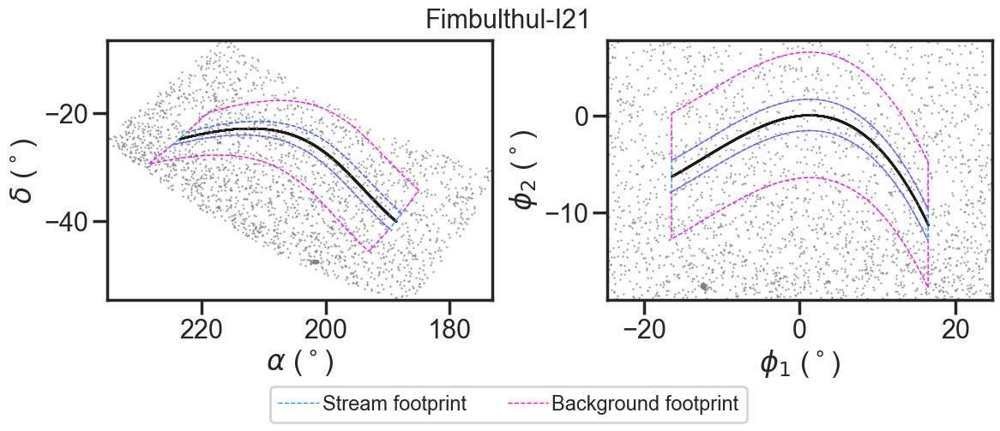


footprint_f: 81
theta: [-1.66728839e+01 -9.96584422e-01  3.80538596e+00 -7.62506845e-01
  3.11881809e-01 -1.34645015e-01 -1.76378963e-03  8.77369122e-03
  2.74242535e-03  8.12808411e-04 -1.44136400e-04  3.27702054e-04
  3.08997662e+00  1.95123829e+00  2.24484015e+00  5.12658228e-01]

Number of members: 3


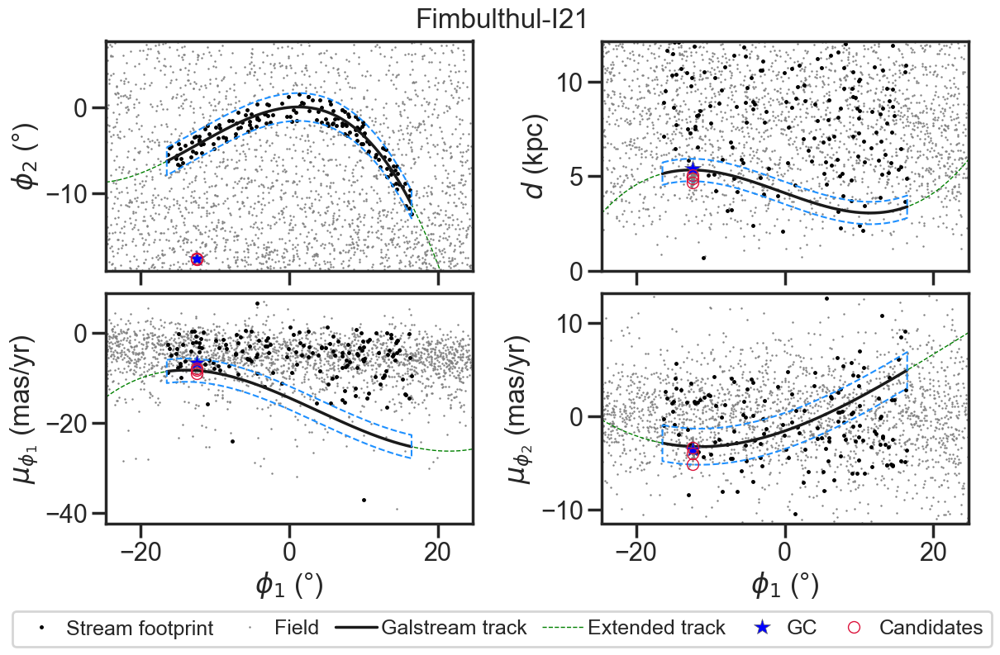




Stream: OmegaCen-I21

phi1_lim: (-26.822, 26.813)
phi2_lim: (-21.502, 8.259)
d_lim: (0.0, 14.514)
pmphi1_lim: (-34.96, 7.204)
pmphi2_lim: (-13.811, 25.219)
ra_lim: (165.085, 229.107)
dec_lim: (-63.959, -4.984)


width: 3.231




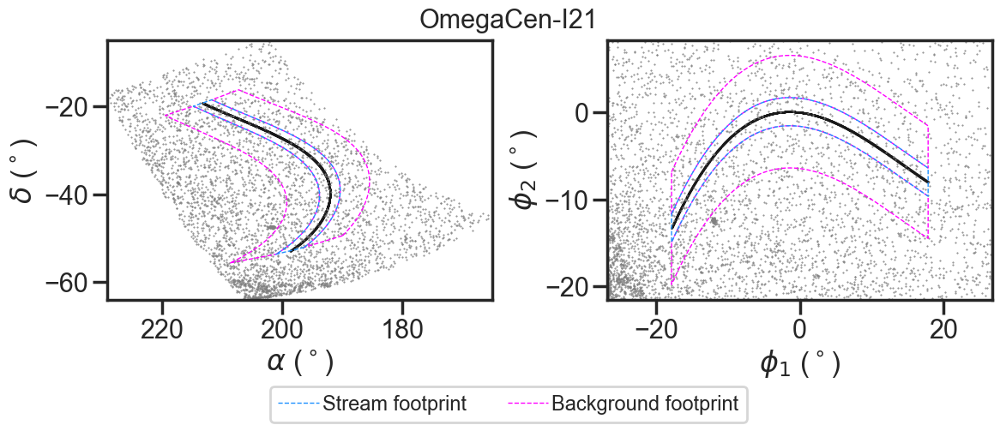


footprint_f: 34
theta: [-1.06586203e+01  1.67636629e+00  5.04385168e+00 -5.81614019e-01
  4.59792382e-01 -1.21796558e-01 -1.50409044e-02  1.76697953e-02
 -3.06459016e-03  5.86470405e-04 -3.53949847e-04  1.41141106e-04
  2.68785115e+00  1.73771417e+00  2.23273764e+00  1.58139535e-01]

Number of members: 12


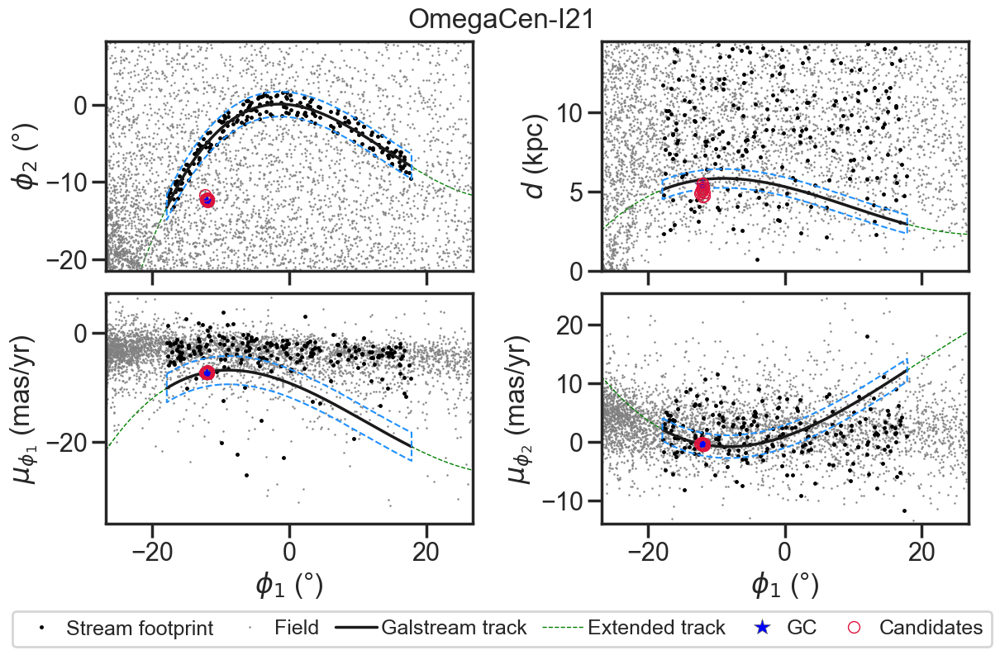




Stream: Fjorm-I21

phi1_lim: (-105.202, 105.277)
phi2_lim: (-14.802, 5.881)
d_lim: (0.0, 28.733)
pmphi1_lim: (-3.865, 10.268)
pmphi2_lim: (-4.302, 7.546)
ra_lim: (0.378, 359.772)
dec_lim: (-81.537, 79.381)


width: 2.418




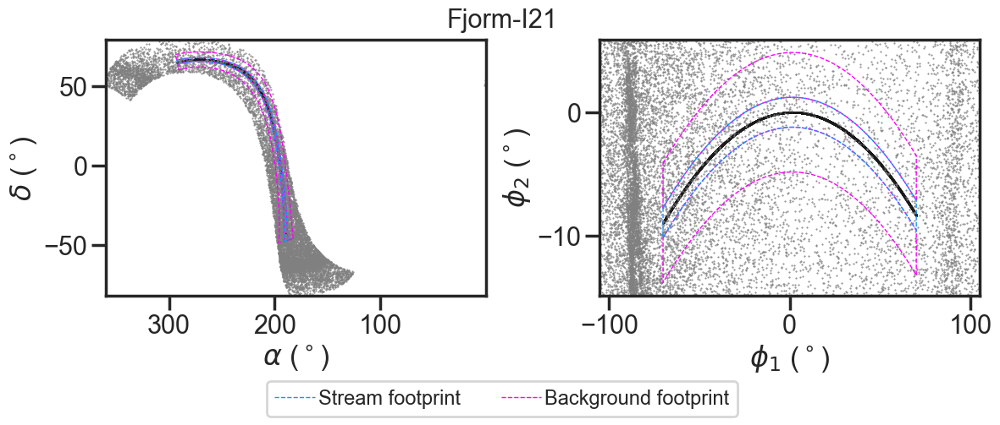


footprint_f: 5
theta: [ 4.18954233e+00  3.05186830e+00  5.78930850e+00  7.55169110e-02
 -3.00533164e-02 -7.14644041e-03 -5.51489855e-04 -3.72246505e-04
 -3.81979017e-04 -1.48955207e-05  1.19715151e-06  1.15248540e-05
  1.84441882e+00  1.94889629e+00  1.97398636e+00  8.83392226e-03]

Number of members: 2


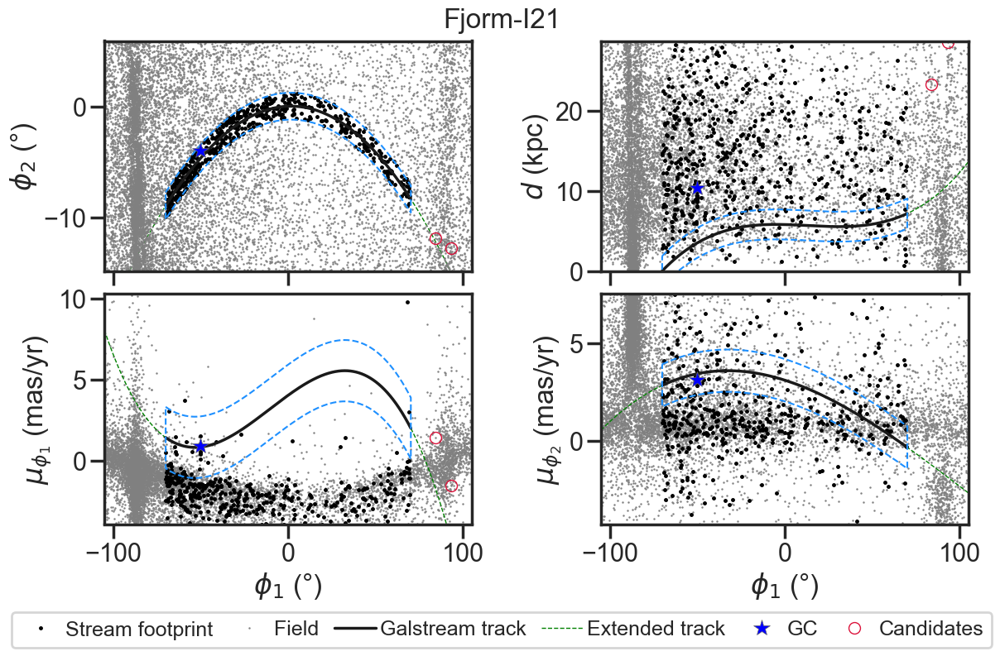




Stream: M68-I21

phi1_lim: (-11.418, 11.437)
phi2_lim: (-2.713, 1.766)
d_lim: (3.125, 5.079)
pmphi1_lim: (2.366, 12.277)
pmphi2_lim: (3.718, 7.617)
ra_lim: (183.241, 192.226)
dec_lim: (-47.908, -25.659)


width: 0.886




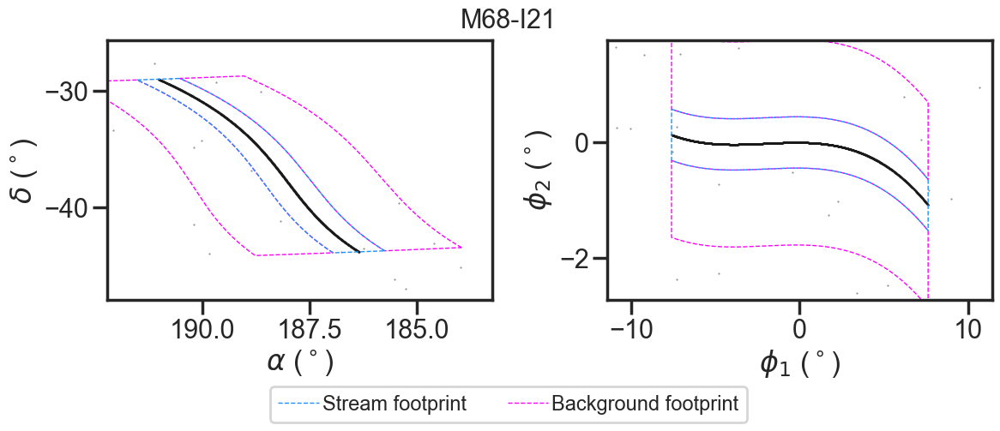


footprint_f: 0
theta: [ 7.29097076e+00  5.26448066e+00  4.19619802e+00 -3.96647344e-01
 -1.46301078e-01  3.59576530e-02  6.65961620e-04  1.50041918e-02
 -5.19666933e-03  3.37028552e-03  2.11012360e-03 -8.00365317e-04
  1.81762765e+00  2.17525049e+00  2.09015087e+00  0.00000000e+00]

Number of members: 0


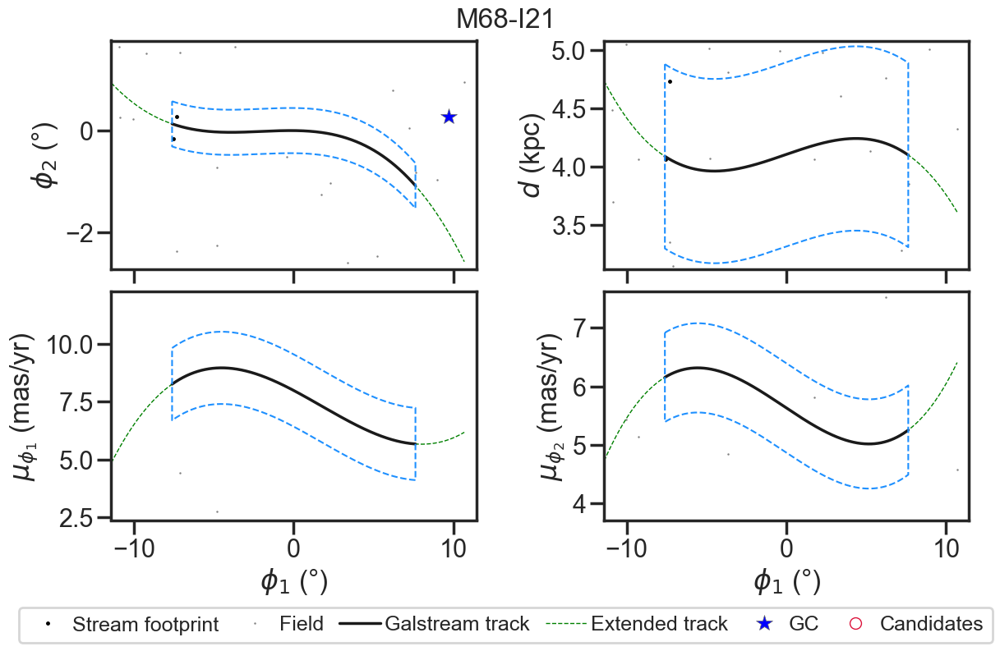




Stream: M68-P19

phi1_lim: (-67.279, 131.373)
phi2_lim: (-14.306, 4.548)
d_lim: (0.0, 19.005)
pmphi1_lim: (-4.405, 10.052)
pmphi2_lim: (-2.867, 6.369)
ra_lim: (130.767, 353.077)
dec_lim: (-79.403, 77.297)


width: 1.368




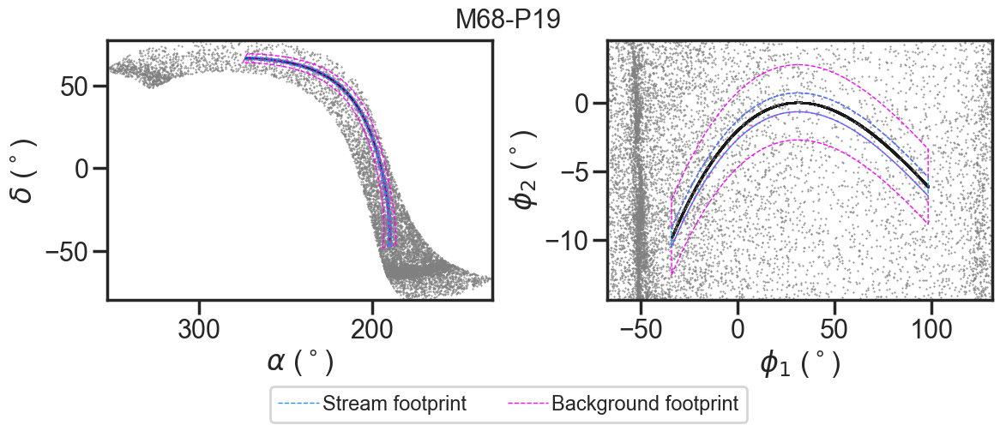


footprint_f: 38
theta: [ 1.77494206e+00  3.27628943e+00  4.81752430e+00  6.42084981e-02
  5.21347562e-03 -2.62993751e-02  4.11506155e-04 -4.87435374e-04
  1.45683792e-03 -8.94843736e-06  1.06455693e-06 -1.23892587e-05
  2.05686525e+00  2.01700007e+00  2.03335545e+00  1.52000000e-01]

Number of members: 27


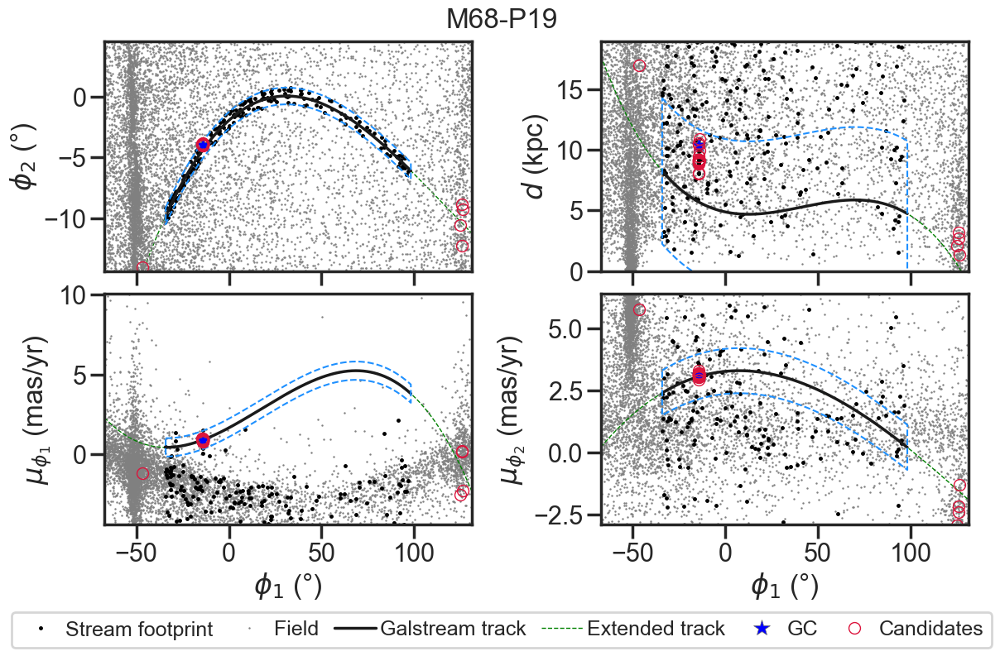




Stream: Gjoll-I21

phi1_lim: (-43.098, 43.097)
phi2_lim: (-2.413, 2.532)
d_lim: (1.276, 5.942)
pmphi1_lim: (17.359, 41.407)
pmphi2_lim: (-4.005, 0.235)
ra_lim: (56.417, 129.256)
dec_lim: (-41.343, 9.14)


width: 1.387




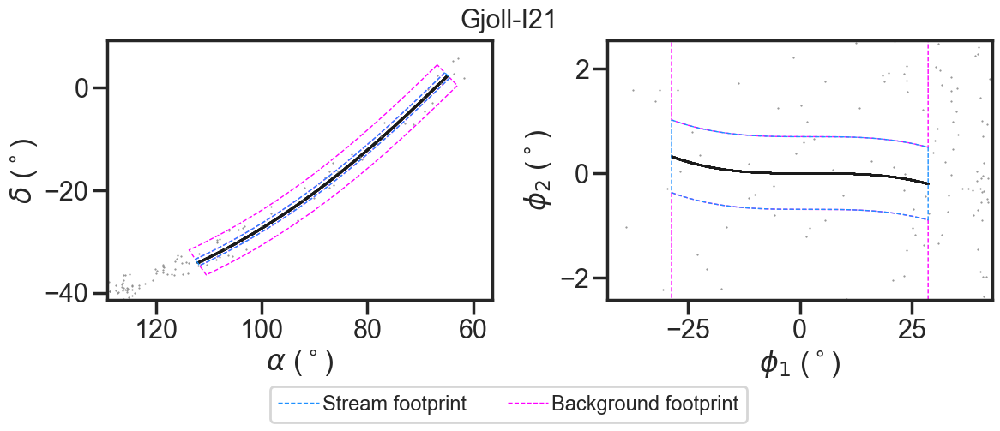


footprint_f: 1
theta: [ 3.30698840e+01 -2.29678797e+00  3.30680385e+00 -1.10311514e-01
 -2.06674505e-02 -6.16856279e-03 -8.98735243e-03  4.26851922e-04
  3.47407651e-04  8.44103089e-05 -2.50542584e-06 -4.18580366e-06
  2.15457781e+00  2.14012300e+00  1.89818577e+00  5.55555556e-02]

Number of members: 0


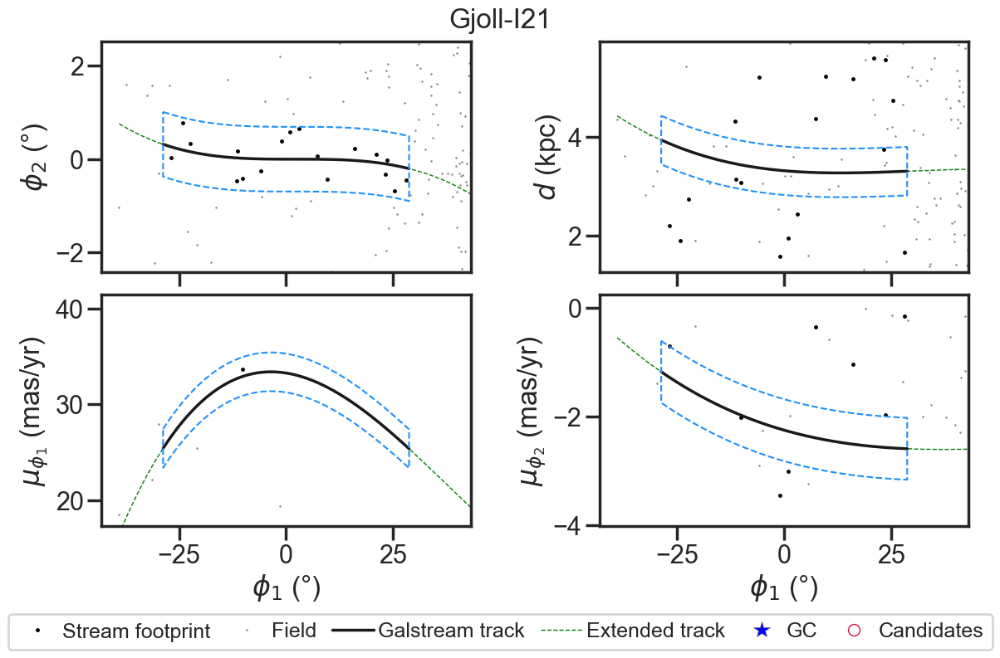




Stream: NGC3201-I21

phi1_lim: (-8.903, 8.903)
phi2_lim: (-2.358, 2.161)
d_lim: (2.342, 7.671)
pmphi1_lim: (2.811, 11.929)
pmphi2_lim: (-3.817, 2.502)
ra_lim: (143.365, 165.978)
dec_lim: (-49.674, -43.089)


width: 1.081




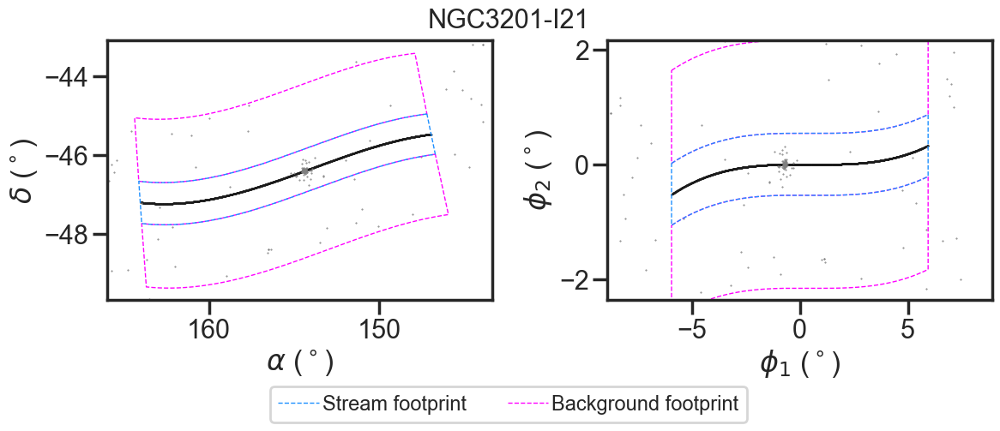


footprint_f: 85
theta: [ 7.12027157e+00 -3.04932253e-01  4.82677301e+00 -5.95684652e-01
 -1.12036745e-01  1.16458246e-01  1.75431528e-02  2.23330032e-02
  1.27634557e-02  1.40662785e-02  8.51155831e-03 -1.26222665e-03
  1.99895982e+00  1.47352389e+00  2.15162475e+00  9.23913043e-01]

Number of members: 77


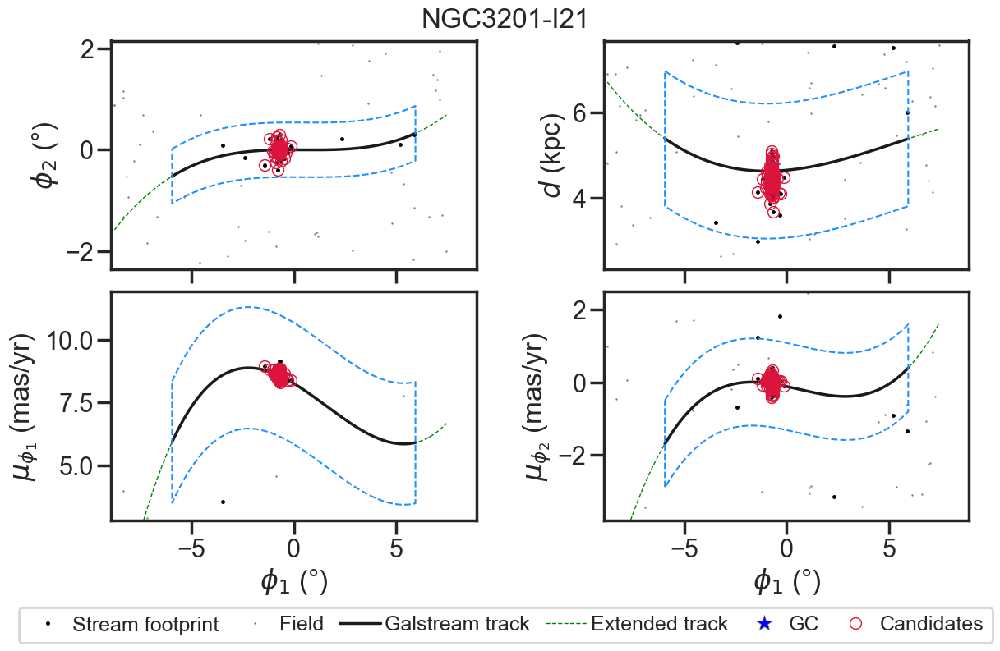




Stream: NGC3201-P21

phi1_lim: (-154.053, 50.512)
phi2_lim: (-10.073, 4.892)
d_lim: (0.0, 15.283)
pmphi1_lim: (-26.393, 62.828)
pmphi2_lim: (-5.637, 2.014)
ra_lim: (5.006, 220.094)
dec_lim: (-52.564, 41.509)


width: 1.365




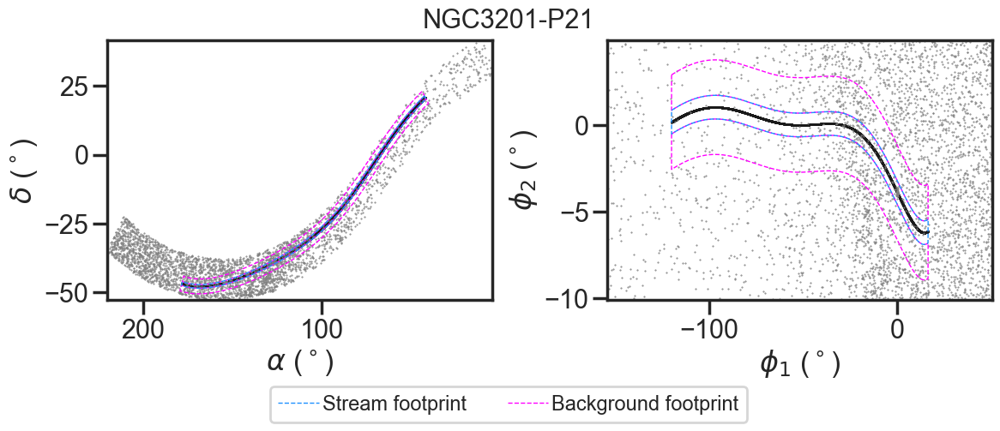


footprint_f: 86
theta: [ 2.75673852e+01 -1.48697060e+00  4.97237021e+00 -2.91295418e-01
  7.75563663e-02 -4.76367591e-02 -4.78502704e-03  1.05865282e-03
 -1.80161205e-03  3.11065910e-05  3.08634242e-06 -1.25460116e-05
 -4.24067384e+01  7.42215840e+00  2.61884934e+00  3.01754386e-01]

Number of members: 4


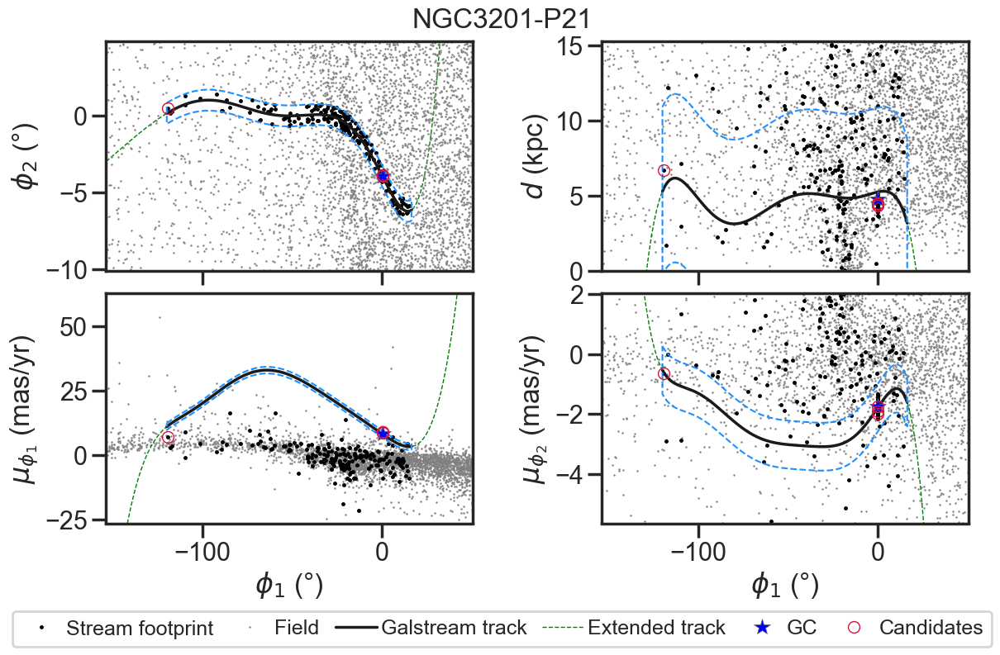




Stream: M2-G22

phi1_lim: (-48.236, 48.185)
phi2_lim: (-22.998, 7.087)
d_lim: (0.0, 33.21)
pmphi1_lim: (-10.421, 16.953)
pmphi2_lim: (-6.245, -1.231)
ra_lim: (0.013, 359.991)
dec_lim: (-39.614, 16.39)


width: 1.638




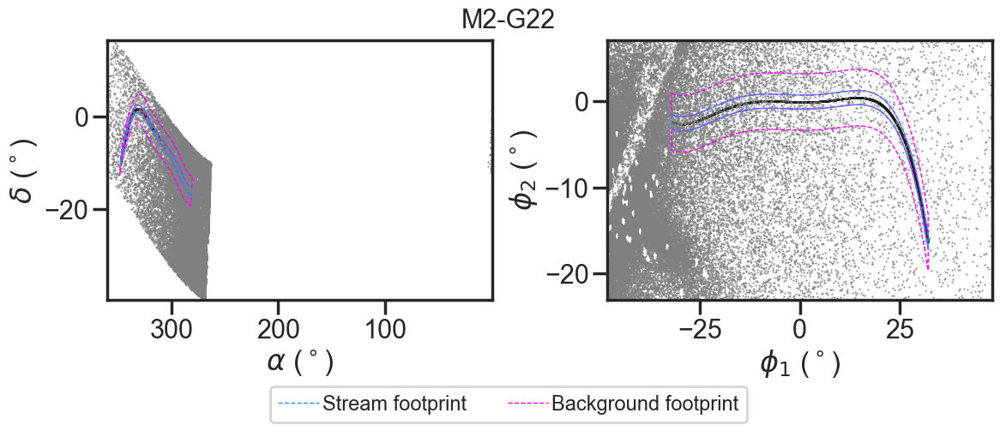


footprint_f: 0
theta: [ 5.02705458e-01 -3.41941177e+00  1.11193332e+01 -1.93156724e-01
  2.49139026e-02  7.97346304e-03 -3.49552147e-03  3.75318742e-04
  2.62116519e-03 -4.04722448e-05 -3.72573748e-05 -3.15805131e-05
  2.67944186e+01 -4.84514573e+00  7.23284907e+00  0.00000000e+00]

Number of members: 0


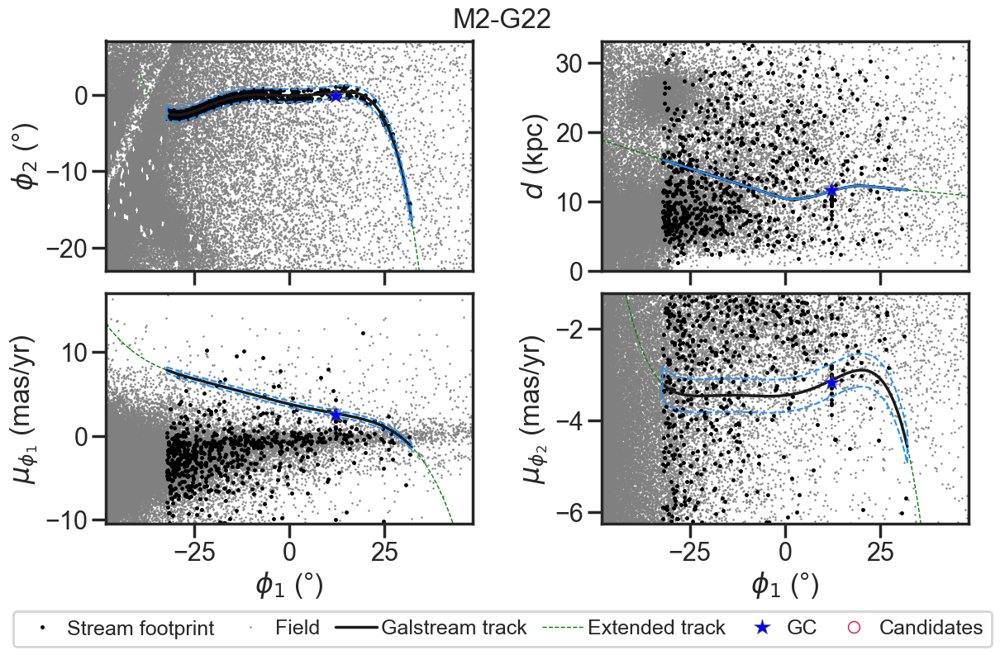




Stream: M2-I21

phi1_lim: (-16.864, 16.862)
phi2_lim: (-1.007, 2.403)
d_lim: (4.482, 18.105)
pmphi1_lim: (-0.562, 6.648)
pmphi2_lim: (-4.511, -1.785)
ra_lim: (304.442, 336.982)
dec_lim: (-7.409, 4.896)


width: 0.436




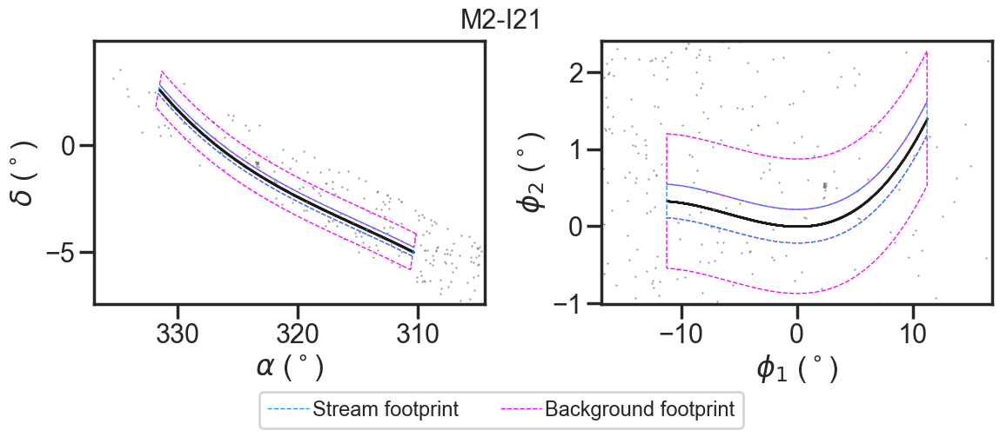


footprint_f: 16
theta: [ 2.82430636e+00 -3.28753581e+00  1.13794819e+01 -9.48676832e-02
  1.50499385e-02  1.66875445e-01  2.12559771e-05  3.00050251e-03
 -1.13133114e-03 -8.85612960e-05  2.72227573e-04 -7.34739054e-04
  1.67677438e+00  2.11643068e+00  1.75834367e+00  1.23076923e+00]

Number of members: 0


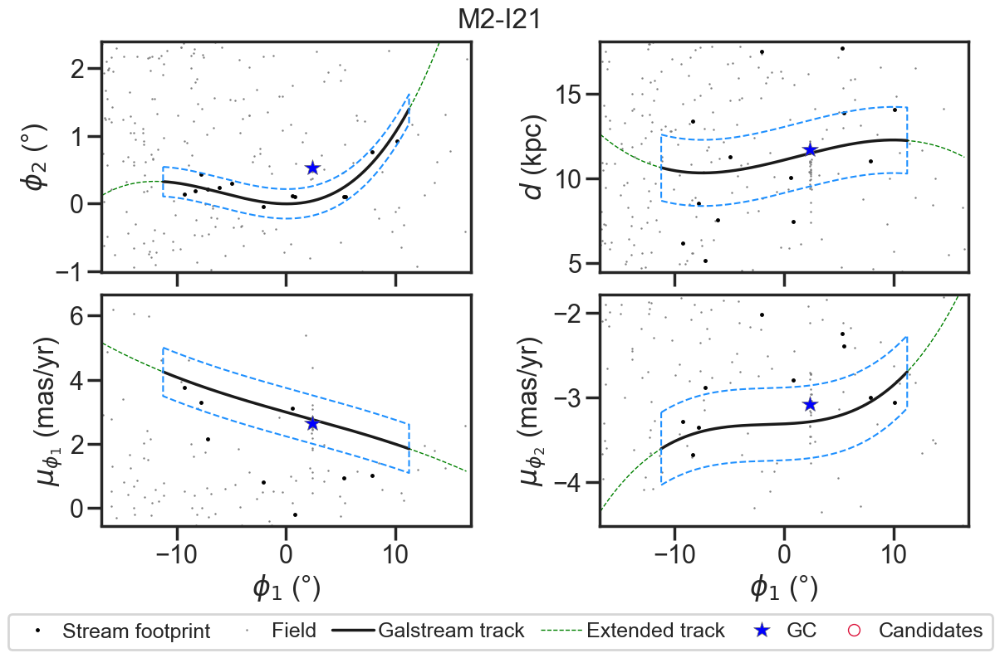




Stream: M5-G19

phi1_lim: (-6.946, 55.129)
phi2_lim: (-4.17, 3.624)
d_lim: (0.0, 21.573)
pmphi1_lim: (-12.021, -0.691)
pmphi2_lim: (3.877, 8.848)
ra_lim: (176.845, 237.68)
dec_lim: (-4.047, 26.806)


width: 2.324




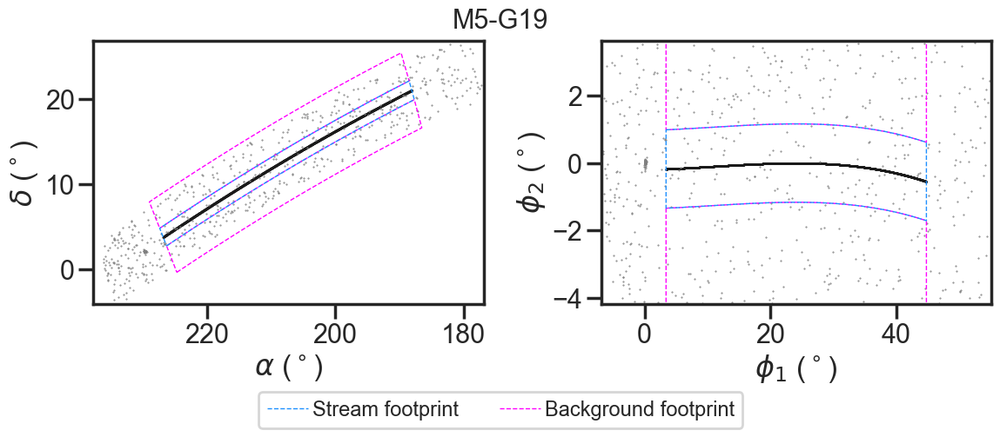


footprint_f: 0
theta: [-8.30578371e+00  7.26062502e+00  6.07249437e+00  4.26885419e-02
 -5.28145018e-02  9.25007143e-02  1.89074956e-03  1.14846663e-03
  1.05012873e-10 -1.84529708e-05 -2.00708635e-05 -1.52281350e-12
  2.03638177e+00  2.04039771e+00  1.35720090e+00  0.00000000e+00]

Number of members: 0


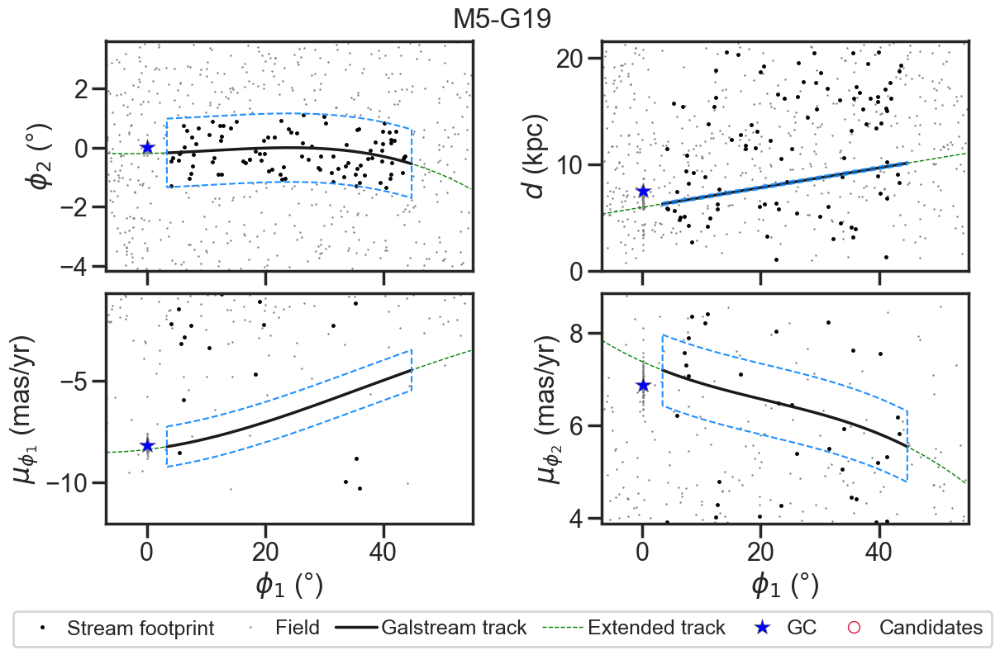




Stream: M5-I21

phi1_lim: (-6.024, 6.025)
phi2_lim: (-1.72, 1.435)
d_lim: (5.4, 9.205)
pmphi1_lim: (4.647, 6.529)
pmphi2_lim: (-8.379, -5.027)
ra_lim: (194.315, 204.949)
dec_lim: (15.593, 17.757)


width: 0.831




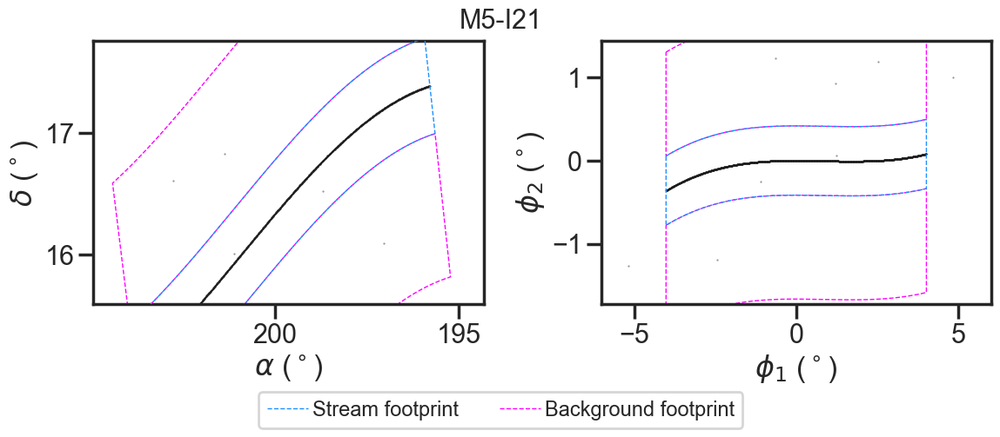


footprint_f: 0
theta: [ 5.86359434 -7.03896925  7.46492869 -0.09805147  0.01439387  0.13108626
 -0.06918119 -0.03068966 -0.02655441 -0.00795824 -0.01016623 -0.00818542
  1.90744762  1.82478641  1.92401677  0.        ]

Number of members: 0


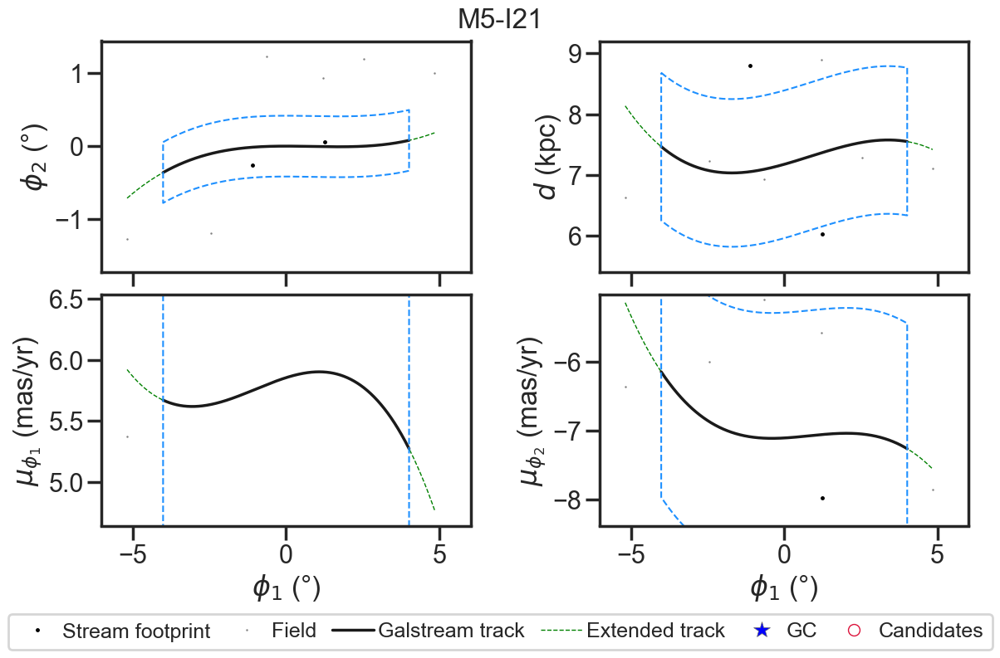




Stream: M92-I21

phi1_lim: (-14.371, 14.029)
phi2_lim: (-10.707, 8.93)
d_lim: (0.0, 16.713)
pmphi1_lim: (-7.233, -1.438)
pmphi2_lim: (-7.83, 0.593)
ra_lim: (238.71, 282.103)
dec_lim: (25.821, 56.255)


width: 2.817




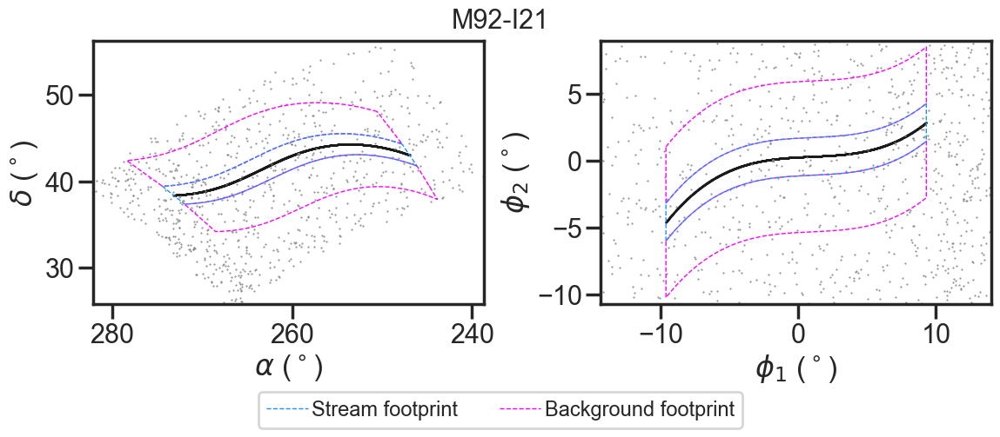


footprint_f: 34
theta: [-3.70488162e+00 -2.95769523e+00  9.39722618e+00 -3.03481768e-02
  8.62241244e-02 -5.53415168e-02 -1.70015430e-02 -1.90291391e-03
 -2.71654422e-02 -1.42605899e-03  5.26298680e-04 -1.75694930e-03
  2.16688271e+00  1.92380929e+00  2.18573462e+00  3.61702128e-01]

Number of members: 8


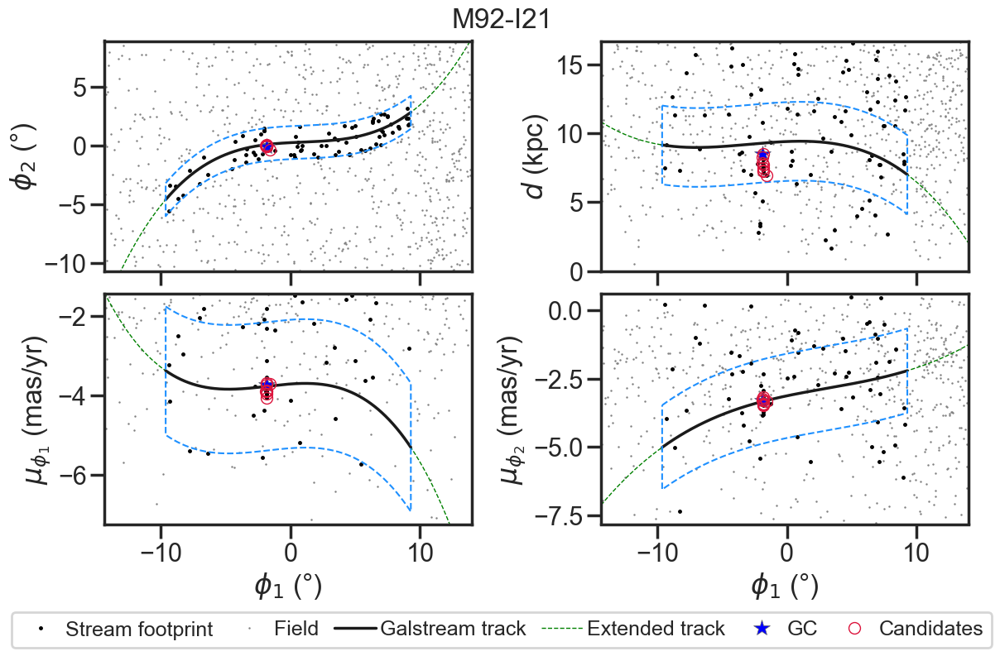




Stream: NGC288-I21

phi1_lim: (-8.947, 8.93)
phi2_lim: (-3.241, 2.2)
d_lim: (7.992, 14.118)
pmphi1_lim: (6.31, 7.303)
pmphi2_lim: (-1.301, 0.862)
ra_lim: (2.407, 17.786)
dec_lim: (-30.593, -17.438)


width: 1.133




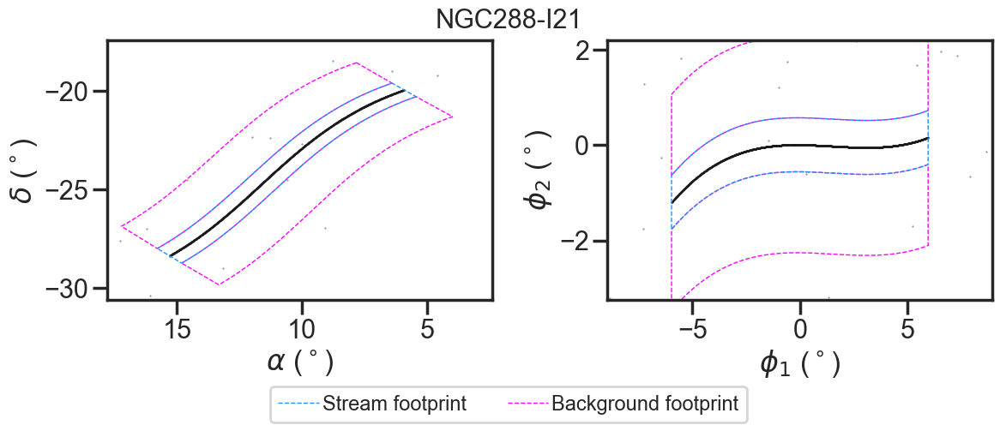


footprint_f: 0
theta: [ 6.91096886e+00 -3.50775556e-01  1.08815389e+01  5.38517580e-02
 -5.44282310e-02 -5.32417073e-02 -8.35116620e-03  8.97977506e-04
 -7.67966447e-04 -1.67965048e-03 -7.68871496e-05 -5.00312782e-04
  1.97295516e+00  1.54389613e+00  1.87191463e+00  0.00000000e+00]

Number of members: 0


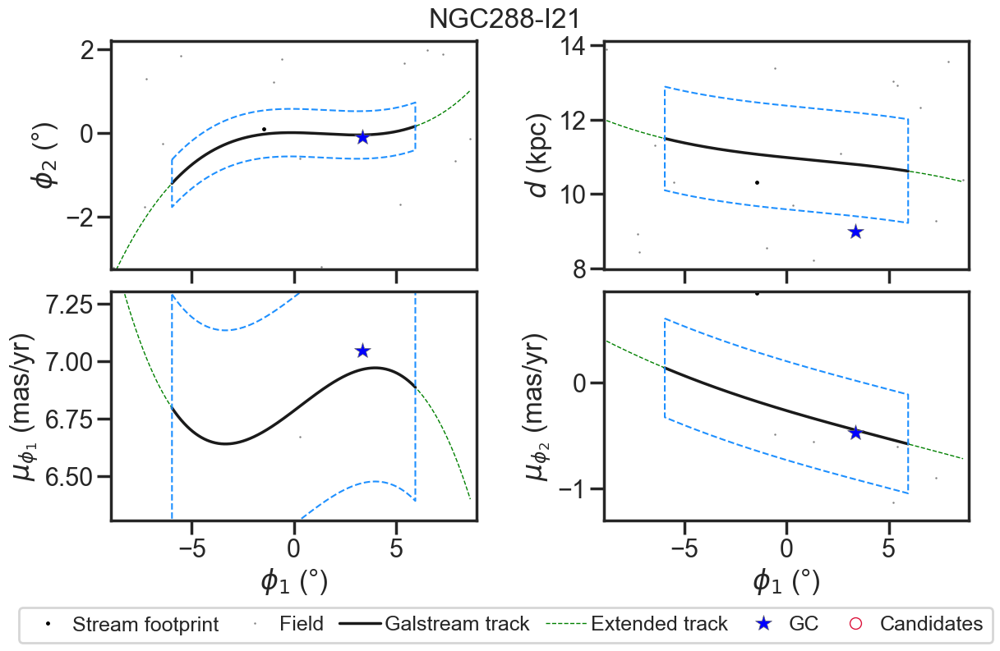




Stream: NGC2298-I21

phi1_lim: (-8.738, 8.73)
phi2_lim: (-2.364, 1.345)
d_lim: (0.038, 24.185)
pmphi1_lim: (3.037, 4.479)
pmphi2_lim: (-1.031, 0.785)
ra_lim: (90.079, 109.305)
dec_lim: (-40.549, -29.156)


width: 0.72




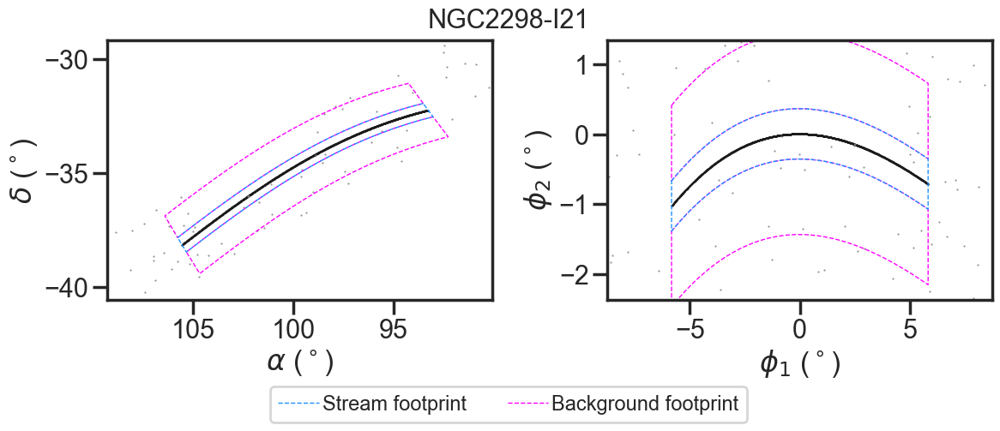


footprint_f: 3
theta: [ 3.91792862e+00 -1.79853152e-01  1.06387154e+01  8.57301109e-02
  4.79319520e-03 -3.83042366e-01 -1.66303300e-02 -1.06296266e-02
  1.24599676e-01 -3.56560173e-03 -2.15515842e-03  1.66436701e-02
  2.03902755e+00  2.06508895e+00  2.87730422e+00  2.72727273e-01]

Number of members: 2


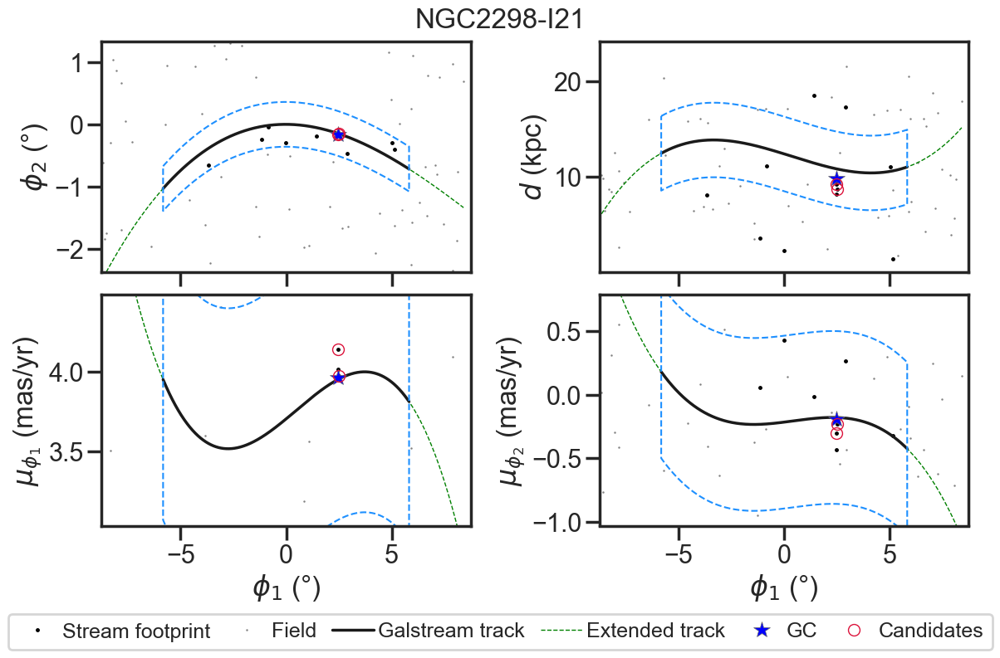




Stream: NGC5466-I21

phi1_lim: (-12.569, 12.571)
phi2_lim: (-0.918, 1.454)
d_lim: (9.593, 20.149)
pmphi1_lim: (-6.253, -3.327)
pmphi2_lim: (-5.006, -2.465)
ra_lim: (207.92, 228.131)
dec_lim: (18.289, 30.461)


width: 0.522




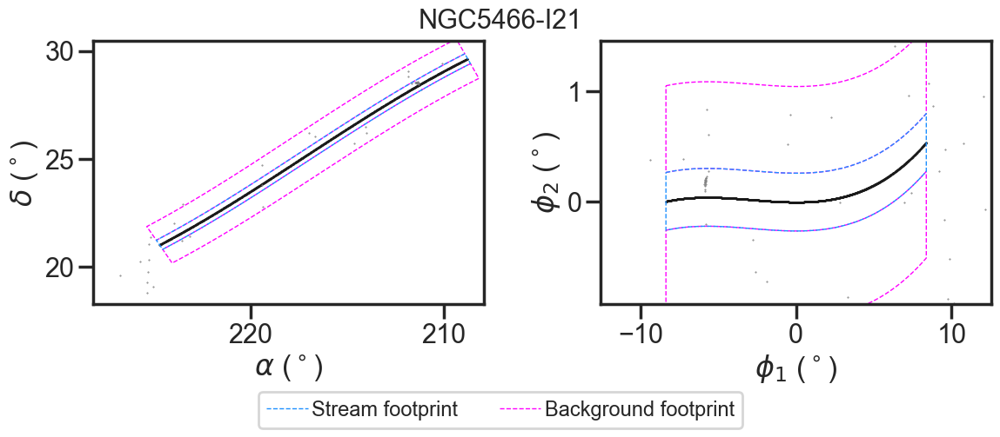


footprint_f: 20
theta: [-5.01417149e+00 -3.87075945e+00  1.41775948e+01 -1.05705111e-01
 -4.32983449e-02 -3.15949069e-02  5.99354893e-03  1.45155295e-04
  6.03221887e-03  1.01169492e-03 -7.99680421e-05 -4.03040610e-04
  2.09399087e+00  2.05622090e+00  2.06614301e+00  8.69565217e-01]

Number of members: 22


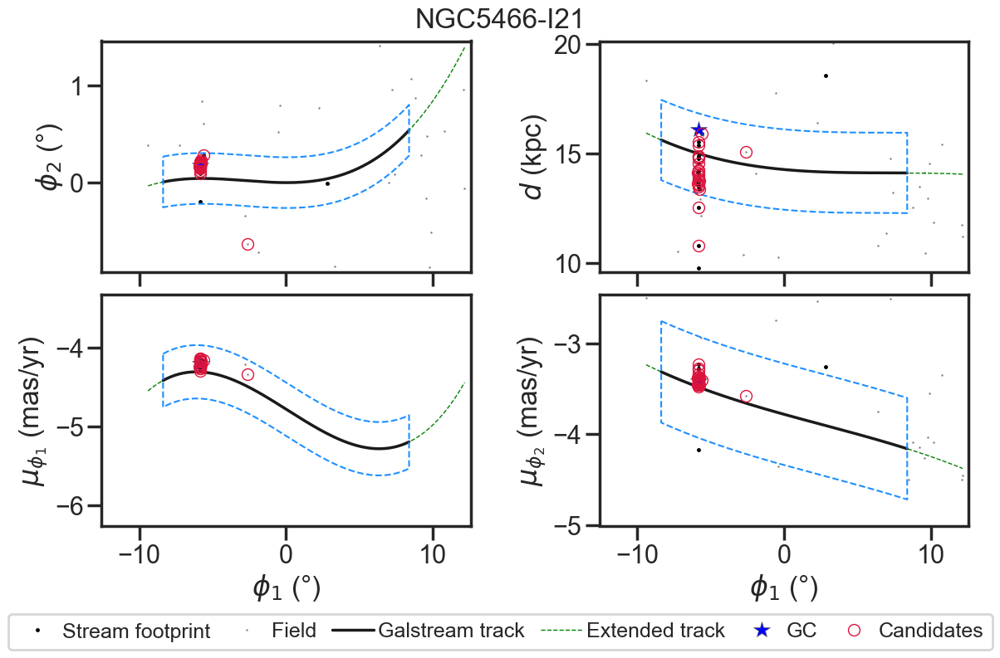




Stream: NGC5466-J21

phi1_lim: (-24.835, 21.499)
phi2_lim: (-3.781, 4.09)
d_lim: (0.0, 64.266)
pmphi1_lim: (-7.47, -1.337)
pmphi2_lim: (-4.973, -1.7)
ra_lim: (183.792, 232.967)
dec_lim: (15.278, 40.69)


width: 2.391




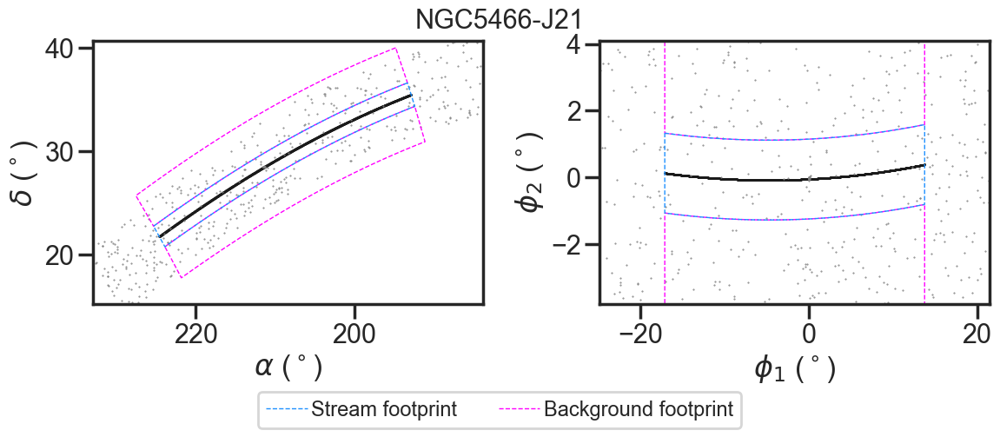


footprint_f: 20
theta: [-4.53652981e+00 -3.34311359e+00  1.59658506e+01 -7.15653077e-02
 -3.96754530e-02 -2.96129958e-01 -6.45269892e-04 -5.72156709e-04
  1.33336580e-02  1.71126203e-13 -1.11003580e-12  1.51027272e-12
  2.49991483e+00  2.14203654e+00  2.38422169e+00  2.06185567e-01]

Number of members: 21


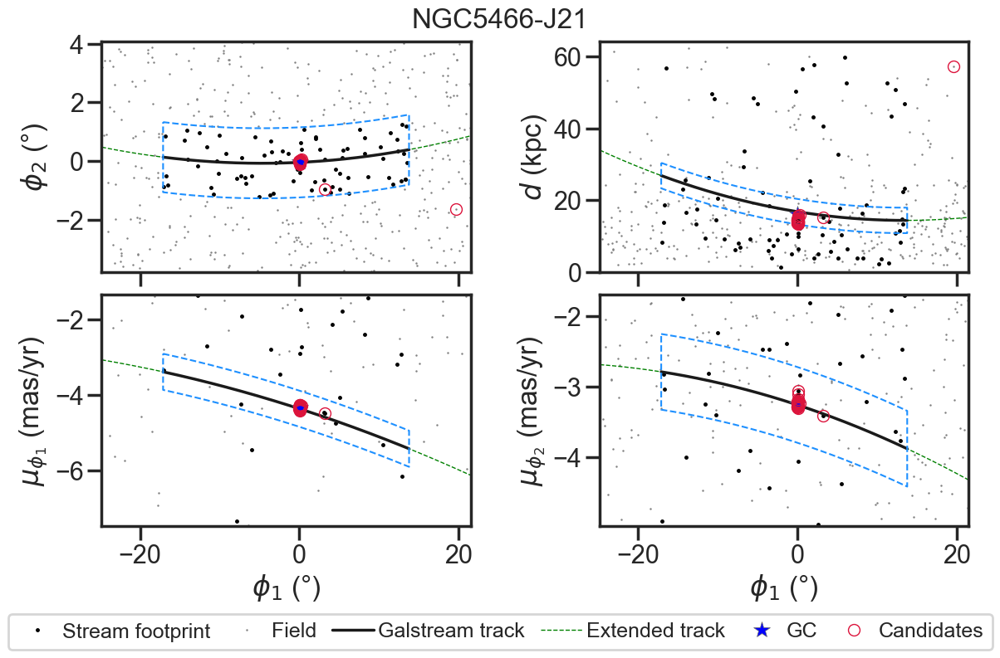




Stream: Pal5-I21

phi1_lim: (-16.297, 16.304)
phi2_lim: (-4.829, 1.967)
d_lim: (4.048, 36.167)
pmphi1_lim: (-5.415, -2.895)
pmphi2_lim: (-2.564, 0.98)
ra_lim: (216.12, 246.127)
dec_lim: (-12.084, 11.301)


width: 0.83




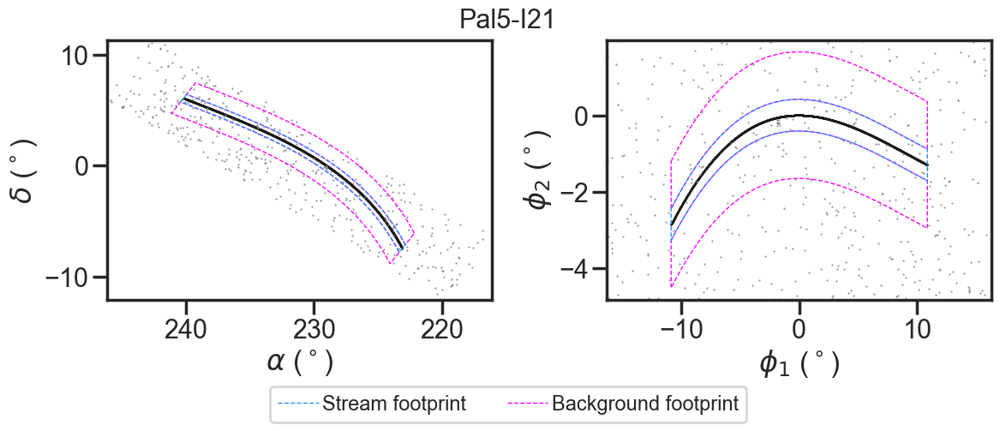


footprint_f: 29
theta: [-3.73578098e+00 -4.42293803e-01  2.20915027e+01 -4.99589585e-03
  3.13779558e-02 -1.68465367e-01 -8.27960760e-03 -1.07659156e-03
 -1.72666171e-02 -2.66247983e-04  1.16942789e-04  1.60185049e-03
  2.20033139e+00  2.89494290e+00  2.16463811e+00  5.17857143e-01]

Number of members: 23


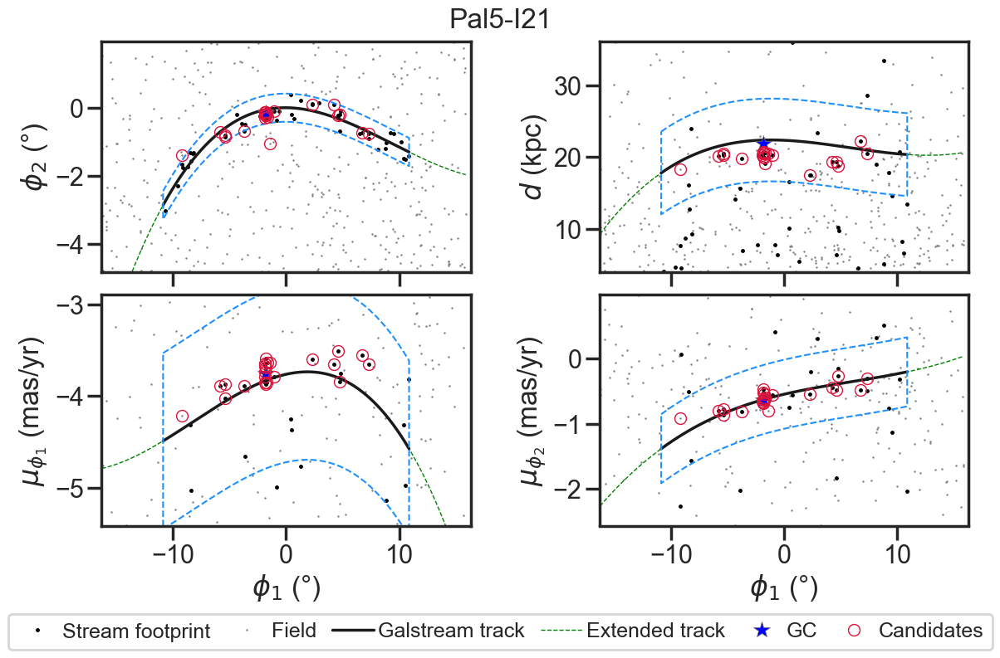




Stream: Pal5-PW19

phi1_lim: (-20.009, 11.44)
phi2_lim: (-3.501, 4.669)
d_lim: (10.283, 30.829)
pmphi1_lim: (2.112, 4.951)
pmphi2_lim: (0.196, 1.455)
ra_lim: (218.104, 247.577)
dec_lim: (-9.266, 13.211)


width: 1.805




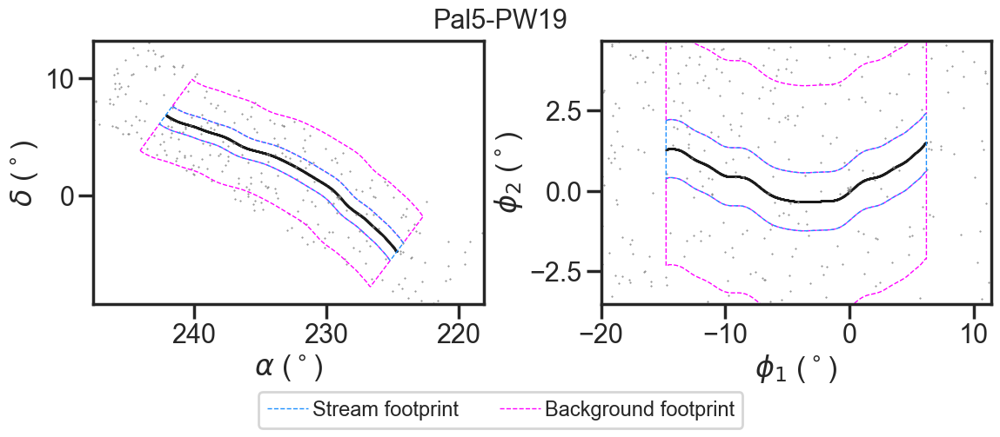


footprint_f: 20
theta: [ 3.89217784e+00  8.55031326e-01  2.00009365e+01  3.59397416e-02
  5.20904462e-02 -2.26359402e-01 -6.42299948e-04  2.83199995e-03
 -6.32699958e-03  2.44033974e-12  6.90748593e-13  3.06173993e-11
  2.86828080e+00  3.21770784e+00  2.54049810e+00  3.44827586e-01]

Number of members: 23


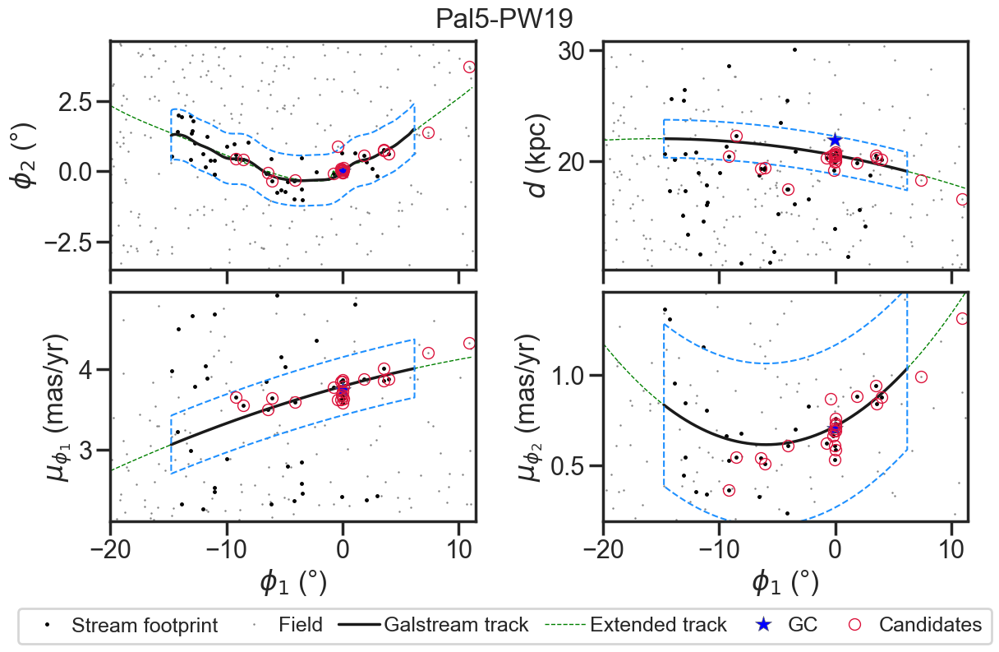




Stream: NGC1261-I21

phi1_lim: (-13.104, 12.23)
phi2_lim: (-9.1, 6.555)
d_lim: (0.0, 41.278)
pmphi1_lim: (-2.541, -0.328)
pmphi2_lim: (-2.761, -2.0)
ra_lim: (26.025, 66.126)
dec_lim: (-68.721, -41.501)


width: 3.614




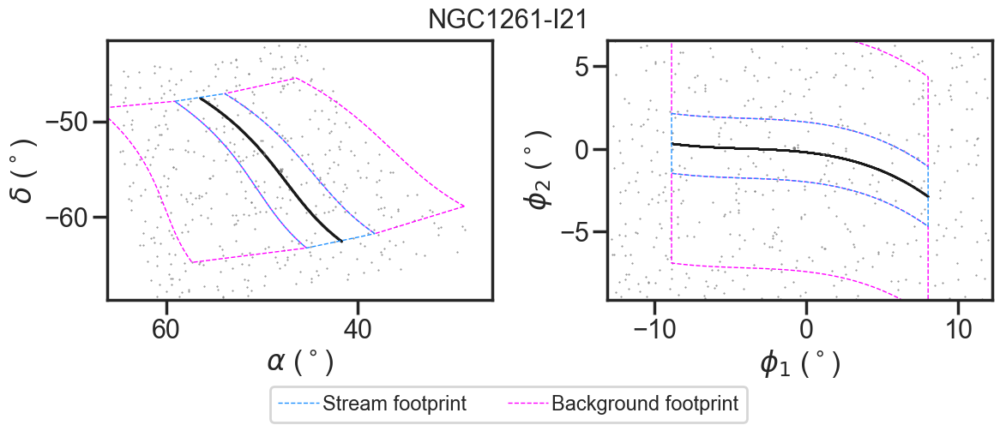


footprint_f: 14
theta: [-1.37005210e+00 -2.28446621e+00  2.05585085e+01  3.92028116e-02
  5.20613219e-03  2.79711939e-01  1.47474635e-03 -4.76151284e-04
  3.23155246e-03  1.32635563e-04  8.07481923e-05  1.17404943e-03
  2.18539705e+00  2.13371871e+00  1.85979294e+00  1.62790698e-01]

Number of members: 1


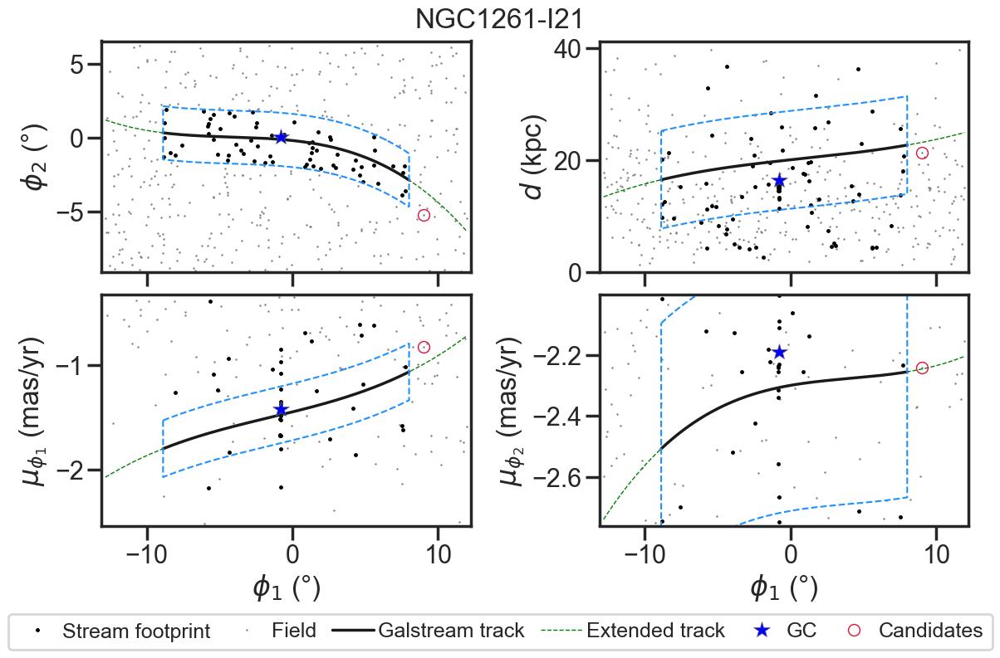




Stream: NGC1851-I21

phi1_lim: (-9.306, 11.798)
phi2_lim: (-12.241, 8.473)
d_lim: (9.923, 18.28)
pmphi1_lim: (-0.639, -0.071)
pmphi2_lim: (-2.605, -1.974)
ra_lim: (66.88, 97.041)
dec_lim: (-53.915, -32.688)


width: 4.741




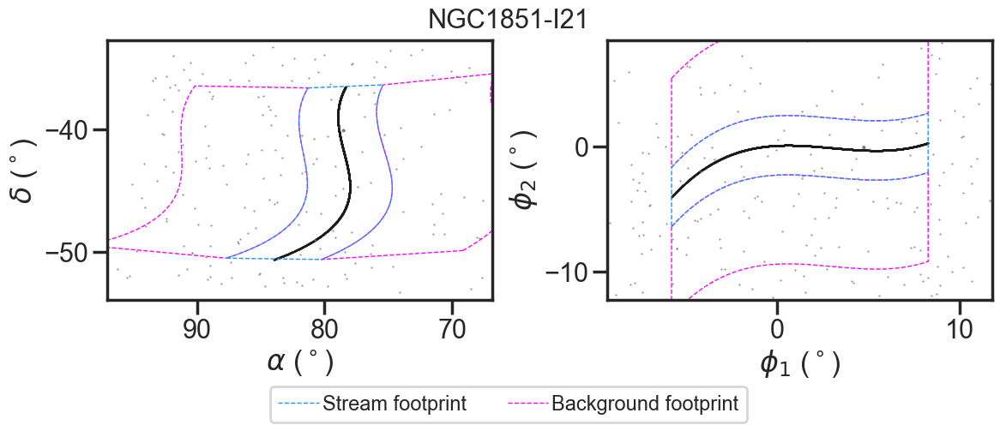


footprint_f: 3
theta: [-4.35285029e-01 -2.37695774e+00  1.36397724e+01  9.37370227e-03
  8.53838778e-03  5.06438339e-02  6.97815623e-04  1.01513872e-03
  4.50589670e-03 -3.13268443e-04 -4.36935344e-04 -2.52489658e-03
  2.87824975e+00  1.89677697e+00  1.97264418e+00  6.00000000e-02]

Number of members: 5


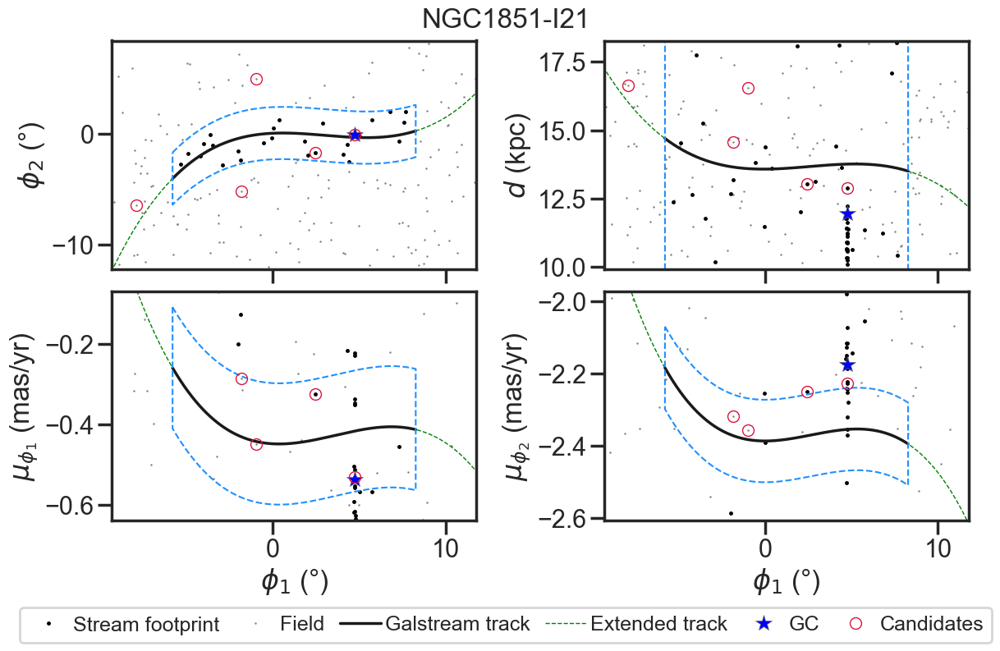




Stream: NGC2808-I21

phi1_lim: (-14.544, 14.54)
phi2_lim: (-2.473, 1.45)
d_lim: (0.0, 30.0)
pmphi1_lim: (-1.252, 10.298)
pmphi2_lim: (0.077, 3.557)
ra_lim: (117.021, 172.205)
dec_lim: (-73.607, -53.212)


width: 0.794




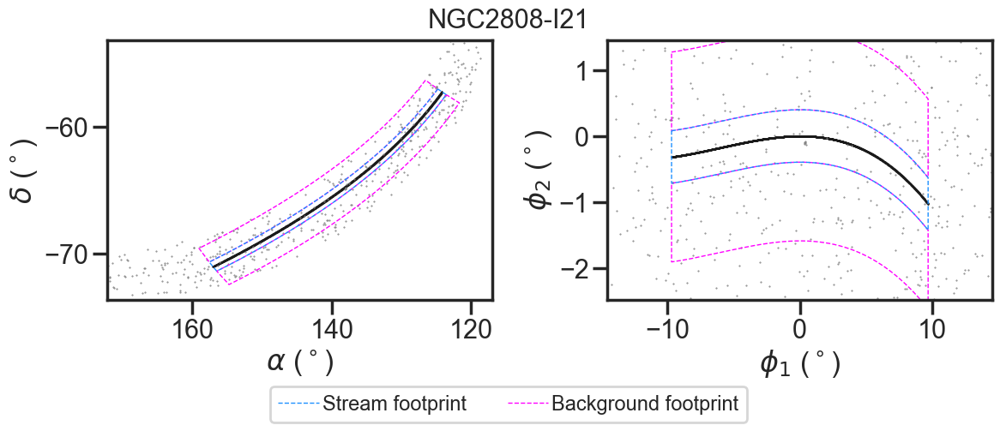


footprint_f: 16
theta: [ 2.86027284e+00  1.64776744e+00  8.93897582e+00 -1.51851832e-01
 -1.05434602e-01 -7.31932888e-03  1.96892411e-02  2.72558959e-03
 -4.47876139e-02  6.68388540e-04  5.81400062e-04  4.89815817e-04
  2.55688779e+00  2.13720359e+00  2.15517196e+00  2.53968254e-01]

Number of members: 0


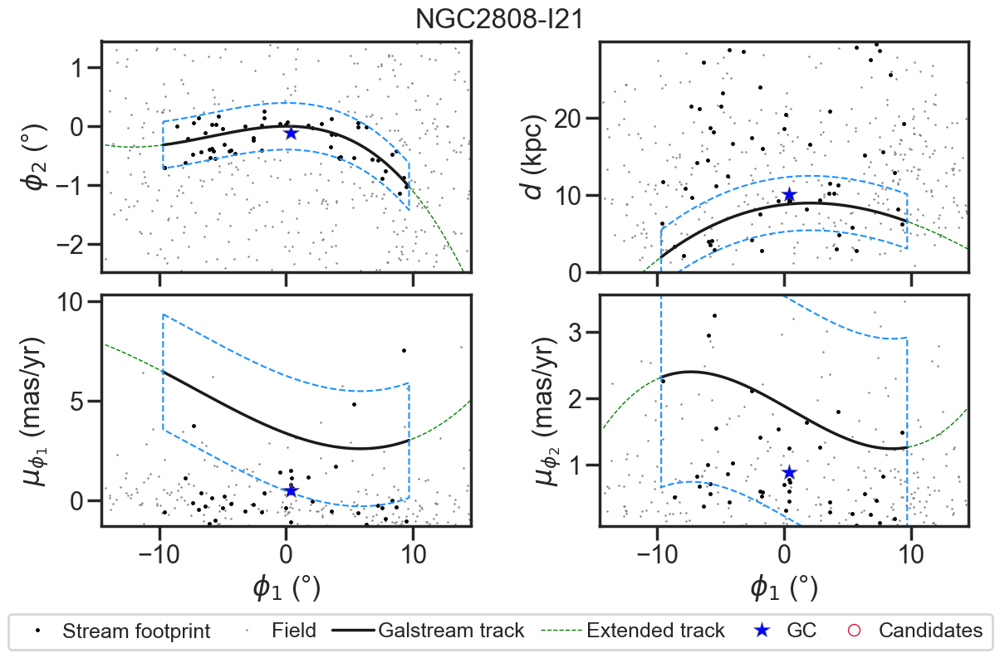




Stream: NGC6101-I21

phi1_lim: (-7.865, 7.868)
phi2_lim: (-1.415, 1.035)
d_lim: (9.946, 20.51)
pmphi1_lim: (0.996, 1.875)
pmphi2_lim: (-1.317, -0.239)
ra_lim: (234.223, 275.852)
dec_lim: (-74.141, -65.851)


width: 0.623




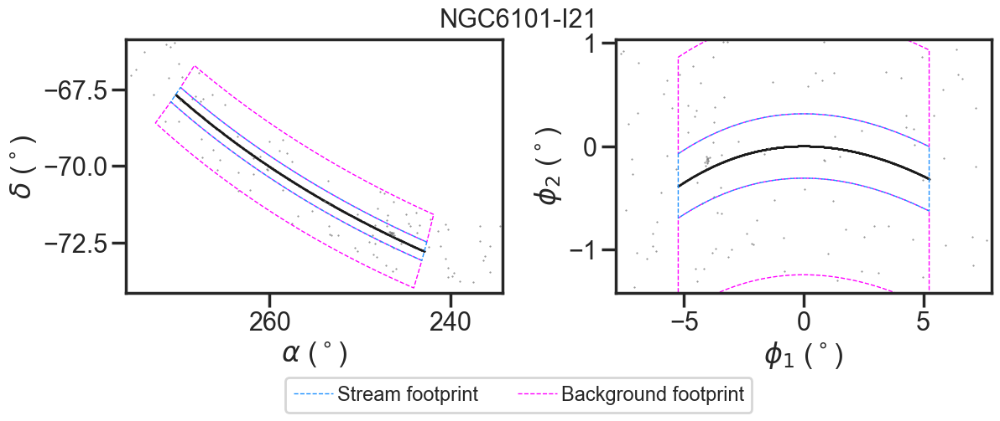


footprint_f: 15
theta: [ 1.46769604e+00 -7.03470301e-01  1.44817697e+01  6.19606007e-02
  6.11532431e-02  5.71852577e-02 -2.71651419e-03 -1.65793892e-02
  1.03093188e-01 -1.75676816e-03 -3.99663221e-03  1.21827909e-02
  1.77409270e+00  1.67079102e+00  2.17489379e+00  5.17241379e-01]

Number of members: 6


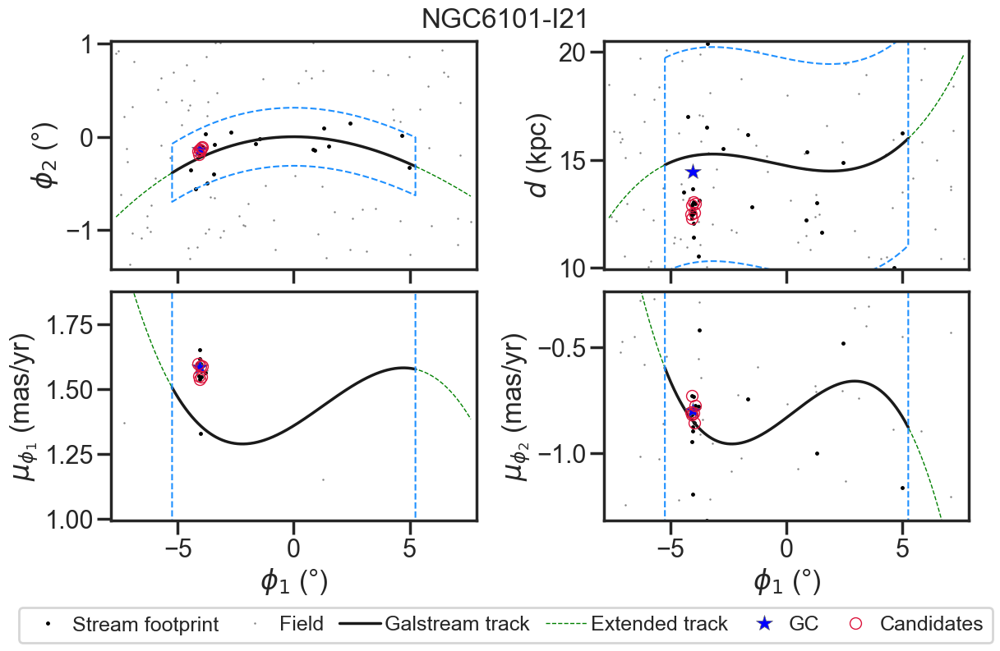




Stream: NGC6397-I21

phi1_lim: (-13.306, 13.307)
phi2_lim: (-4.525, 2.783)
d_lim: (1.775, 3.209)
pmphi1_lim: (2.541, 9.726)
pmphi2_lim: (-19.082, -12.899)
ra_lim: (250.55, 294.267)
dec_lim: (-57.929, -49.331)


width: 0.944




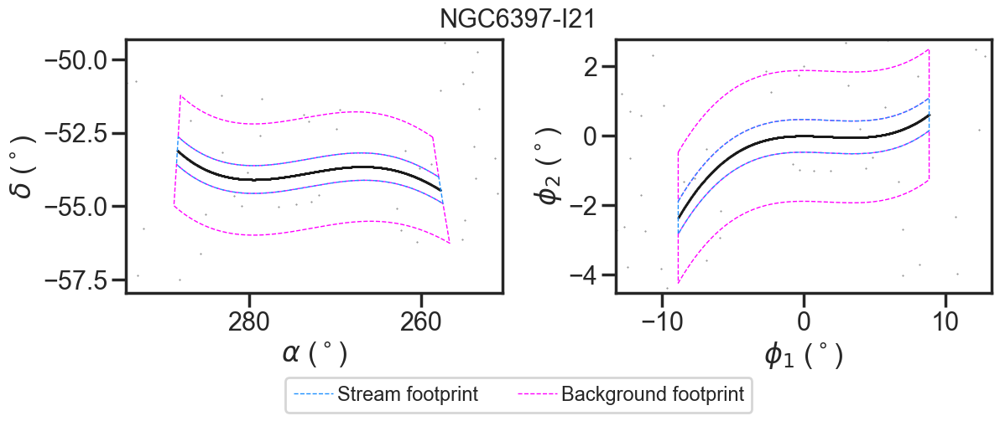


footprint_f: 0
theta: [ 5.45032413e+00 -1.55275002e+01  2.54211194e+00 -1.52442753e-01
  1.37614804e-01  8.31776811e-03  7.72967155e-03 -4.84557830e-03
 -2.45733411e-04  5.64575689e-04 -4.56527045e-04  2.35862188e-05
  2.29920711e+00  2.14093715e+00  2.13530500e+00  0.00000000e+00]

Number of members: 0


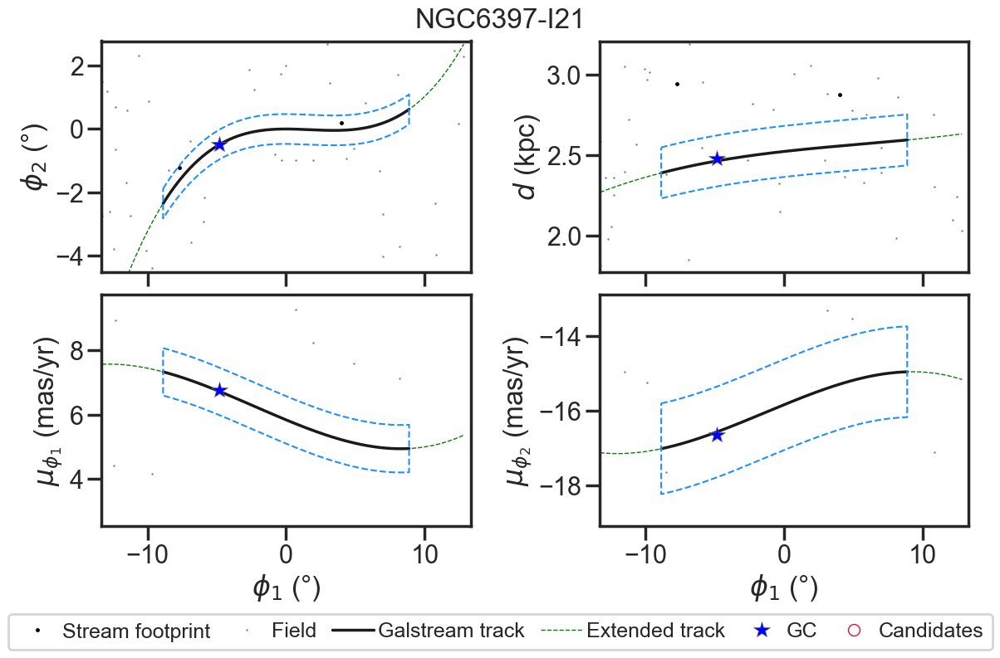




Stream: TucanaIII-S19

phi1_lim: (-10.827, 10.465)
phi2_lim: (-1.435, 1.377)
d_lim: (12.752, 37.536)
pmphi1_lim: (-0.789, 0.197)
pmphi2_lim: (-2.109, -1.134)
ra_lim: (-21.909, 16.751)
dec_lim: (-61.127, -57.331)


width: 0.459




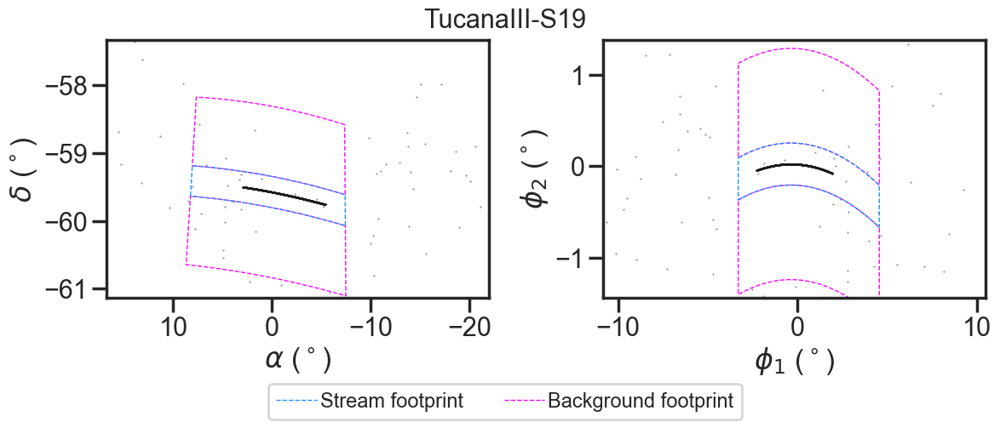


footprint_f: 6
theta: [-1.75856552e-01 -1.45954597e+00  2.68026663e+01 -7.25467852e-02
  3.84317540e-02  8.30268374e-01 -2.95819421e-02 -8.98563803e-03
 -2.97292550e-04 -4.89939472e-11 -1.90225297e-10 -3.45461414e-09
  2.24978088e+00  1.92713161e+00  1.81408394e+00  7.50000000e-01]

Number of members: 6


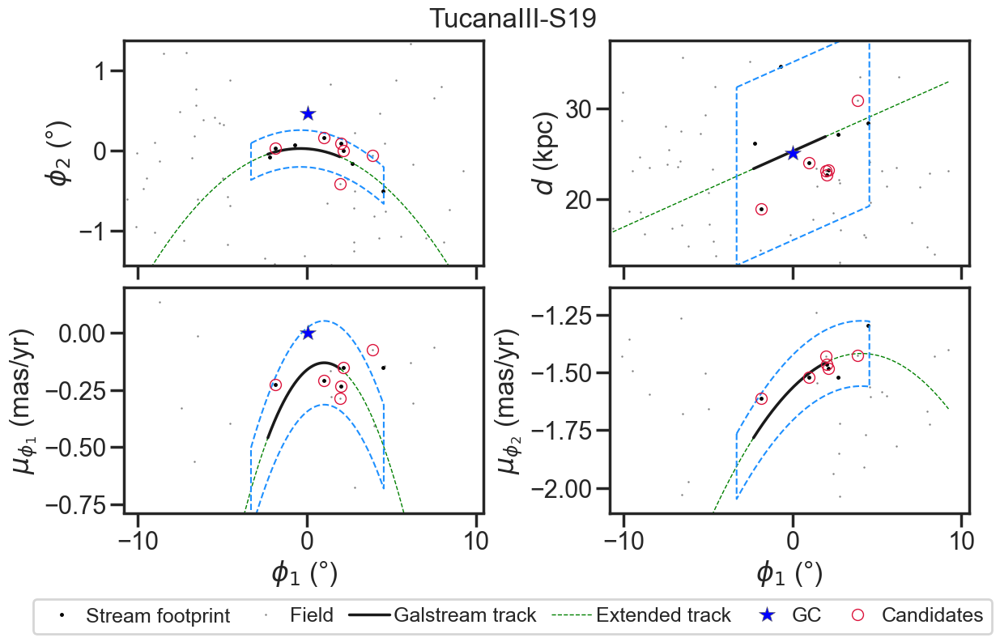

In [291]:
st_names = ['Fimbulthul-I21', 'OmegaCen-I21', 'Fjorm-I21', 'M68-I21', 'M68-P19', 'Gjoll-I21', 'NGC3201-I21', 'NGC3201-P21', 'M2-G22', 'M2-I21', 'M5-G19', 'M5-I21', 'M92-I21', 'NGC288-I21', 'NGC2298-I21', 'NGC5466-I21', 'NGC5466-J21', 'Pal5-I21', 'Pal5-PW19', 'NGC1261-I21', 'NGC1851-I21', 'NGC2808-I21', 'NGC6101-I21', 'NGC6397-I21', 'TucanaIII-S19']

for st in st_names:
    print('Stream:',st)
    
    if (st == 'Fimbulthul-I21') | (st == 'OmgeaCen-I21'):
        Name, Name_d = 'NGC 5139', 'NGC_5139'
    if (st == 'Fjorm-I21') | (st == 'M68-I21') | (st == 'M68-P19'):
        Name, Name_d = 'NGC 4590', 'NGC_4590'
    if (st == 'Gjoll-I21') | (st == 'NGC3201-I21') | (st == 'NGC3201-P21'):
        Name, Name_d = 'NGC 3201', 'NGC_3201'
    if (st == 'M2-G22') | (st == 'M2-I21') | (st == 'M5-G19'):
        Name, Name_d = 'NGC 7089', 'NGC_7089'
    if (st == 'M5-G19') | (st == 'M5-I21'):
        Name, Name_d = 'NGC 5904', 'NGC_5904'
    if (st == 'M92-I21'):
        Name, Name_d = 'NGC 6341', 'NGC_6341'
    if (st == 'NGC288-I21'):
        Name, Name_d = 'NGC 288', 'NGC_288'
    if (st == 'NGC2298-I21'):
        Name, Name_d = 'NGC 2298', 'NGC_2298'
    if (st == 'NGC5466-I21') | (st == 'NGC5466-J21'):
        Name, Name_d = 'NGC 5466', 'NGC_5466'
    if (st == 'Pal5-I21') | (st == 'Pal5-PW19'):
        Name, Name_d = 'Pal 5', 'Pal_5'
    if (st == 'NGC1261-I21'):
        Name, Name_d = 'NGC 1261', 'NGC_1261'
    if (st == 'NGC1851-I21'):
        Name, Name_d = 'NGC 1851', 'NGC_1851'
    if (st == 'NGC2808-I21'):
        Name, Name_d = 'NGC 2808', 'NGC_2808'
    if (st == 'NGC6101-I21'):
        Name, Name_d = 'NGC 6101', 'NGC_6101'
    if (st == 'NGC6397-I21'):
        Name, Name_d = 'NGC 6397', 'NGC_6397'

    if st == 'TucanaIII-S19':
        glob_g = ac.SkyCoord(ra=359.15*u.deg,
                             dec=-59.15*u.deg,
                             distance=25.1*u.kpc, #Drlica-Wagner 2015
                             pm_ra_cosdec=0*u.mas/u.yr, #HACK
                             pm_dec=0*u.mas/u.yr, #HACK
                             radial_velocity=0*u.km/u.s)
                    
        glob_st = glob_g.transform_to(mwsts[st].stream_frame)

    else:
        globs_ = globs[globs['Name'] == Name]
        globs_d_ = globs_d[globs_d.Cluster == Name_d]

        glob_g = ac.SkyCoord(ra=globs_.RAJ2000[0]*u.deg,
                             dec=globs_.DEJ2000[0]*u.deg,
                             distance=float(globs_d_.Rsun.values[0])*u.kpc,
                             pm_ra_cosdec=globs_.pmRA[0]*u.mas/u.yr,
                             pm_dec=globs_.pmDE[0]*u.mas/u.yr,
                             radial_velocity=0*u.km/u.s)

        glob_st = glob_g.transform_to(mwsts[st].stream_frame)


    #Defino caja de la muestra
    widths_st = widths.loc[st]
    
    phi1_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).phi1
    phi2_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).phi2
    pmphi1_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).pm_phi1_cosphi2
    pmphi2_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).pm_phi2
    d_t = mwsts[st].track.transform_to(mwsts[st].stream_frame).distance
    if st == 'M2-G22':
        fd = interp1d(mwsts['M2-I21'].track.transform_to(mwsts[st].stream_frame).phi1.value, mwsts['M2-I21'].track.transform_to(mwsts[st].stream_frame).distance.value, fill_value='extrapolate')
        d_t = fd(phi1_t.value)*u.kpc
    if st == 'M5-G19':
        d_t = (0.0925007163425197*(mwsts[st].track.transform_to(mwsts[st].stream_frame).phi1.value - 43.64108552237125) + 9.983783975903615)*u.kpc


    if st == 'TucanaIII-S19':
        n = 5
    else:
        n = 1.5 #n>1
    phi1o = min(phi1_t.deg)
    phi1f = max(phi1_t.deg)
    phi2o = min(phi2_t.deg) - 2*widths_st.width_phi2
    phi2f = max(phi2_t.deg) + 2*widths_st.width_phi2
    pmphi1o = min(pmphi1_t.value) - (max(pmphi1_t.value)-min(pmphi1_t.value))
    pmphi1f = max(pmphi1_t.value) + (max(pmphi1_t.value)-min(pmphi1_t.value))
    pmphi2o = min(pmphi2_t.value) - (max(pmphi2_t.value)-min(pmphi2_t.value))
    pmphi2f = max(pmphi2_t.value) + (max(pmphi2_t.value)-min(pmphi2_t.value))
    do = min(d_t.value) - (max(d_t.value)-min(d_t.value))*3
    df = max(d_t.value) + (max(d_t.value)-min(d_t.value))*3

    l_phi1 = phi1f - phi1o
    l_phi2 = phi2f - phi2o

    phi1_lim = (phi1o - (n-1)/2*l_phi1, phi1f + (n-1)/2*l_phi1)
    phi2_lim = (phi2o - (n-1)/2*l_phi2, phi2f + (n-1)/2*l_phi2)
    d_lim = (max(0,do), df)
    pmphi1_lim = (pmphi1o, pmphi1f)
    pmphi2_lim = (pmphi2o, pmphi2f)


    print('\nphi1_lim:',tuple(np.around(np.array(phi1_lim),3)))
    print('phi2_lim:',tuple(np.around(np.array(phi2_lim),3)))
    print('d_lim:',tuple(np.around(np.array(d_lim),3)))
    print('pmphi1_lim:',tuple(np.around(np.array(pmphi1_lim),3)))
    print('pmphi2_lim:',tuple(np.around(np.array(pmphi2_lim),3)))


    #Datos
    g_all = GaiaData(_tbl)
    c_all = g_all.get_skycoord(distance=g_all.Dist*u.kpc, radial_velocity = np.zeros(len(g_all.Dist))*u.km/u.s)
    c_all_st = c_all.transform_to(mwsts[st].stream_frame)


    mask1 = (c_all_st.phi1 > phi1_lim[0]*u.deg) & (c_all_st.phi1 < phi1_lim[1]*u.deg) & \
            (c_all_st.phi2 > phi2_lim[0]*u.deg) & (c_all_st.phi2 < phi2_lim[1]*u.deg) & \
            (g_all.pmra.value!=1e20) & (g_all.pmdec.value != 1e20) & \
            (g_all.pmra.value != 0.) & (g_all.pmdec.value != 0.) & \
            (g_all.Dist > d_lim[0]) & (g_all.Dist < d_lim[1])

    skip_globs = globs[(globs['RAJ2000'] > min(g_all.ra.value[mask1])) & (globs['RAJ2000'] < max(g_all.ra.value[mask1])) & 
                       (globs['DEJ2000'] > min(g_all.dec.value[mask1])) & (globs['DEJ2000'] < max(g_all.dec.value[mask1])) &
                       (globs['Name'] != Name)]

    # skip_galax = darwf_galax[(Angle(darwf_galax['RAJ2000'] + 'hours').value*15 > min((g_all.ra.value[mask1]))) & 
    #                          (Angle(darwf_galax['RAJ2000'] + 'hours').value*15 < max((g_all.ra.value[mask1]))) & 
    #                          (Angle(darwf_galax['DEJ2000'] + 'degrees').value > min((g_all.dec.value[mask1]))) & 
    #                          (Angle(darwf_galax['DEJ2000'] + 'degrees').value < max((g_all.dec.value[mask1])))]

    mask =  mask1 \
            & skip_mask_gc(g_all.ra, g_all.dec) \
            # & skip_mask_galax(g_all.ra, g_all.dec)


    g_all = g_all[mask]
    c_all = c_all[mask]
    c_all_st = c_all_st[mask]

    phi1 = c_all_st.phi1 #deg
    phi2 = c_all_st.phi2 #deg
    pmphi1 = c_all_st.pm_phi1_cosphi2 #mas/yr
    pmphi2 = c_all_st.pm_phi2 #mas/yr
    d = g_all.Dist #kpc
    e_d = g_all.Dist_err #kpc

    y = np.array([pmphi1.value, pmphi2.value, d])

    ra = g_all.ra.value #deg
    dec = g_all.dec.value #deg

    pmra = c_all.pm_ra_cosdec.value #data['pmRA'][mask] #mas/yr
    e_pmra = g_all.pmra_error.value #mas/yr
    pmdec = c_all.pm_dec.value #data['pmDE'][mask] #mas/yr
    e_pmdec = g_all.pmdec_error.value #mas/yr
    pmra_pmdec_corr = g_all.pmra_pmdec_corr

    
    if (min(mwsts[st].track.ra.value)<180) & (max(mwsts[st].track.ra.value)>180):
        ra_lim = (min(ra[ra>180]-360), max(ra[ra<=180]))
    else:
        ra_lim = (min(ra),max(ra))
    dec_lim = (min(dec),max(dec))

    print('ra_lim:',tuple(np.around(np.array(ra_lim),3)))
    print('dec_lim:',tuple(np.around(np.array(dec_lim),3)))
    print('\n')
    
    #Matriz de covarianza de las estrellas intrinsica + observacional 
    C_pm_radec = g_all.get_cov()[:, 3:5, 3:5]
    C_pm = gc.transform_pm_cov(c_all, C_pm_radec, mwsts[st].stream_frame)
    C_obs = np.zeros((len(e_pmra),3,3)) #Matriz de covarianza observacional en el frame del stream
    C_obs[:,:2,:2] = C_pm
    C_obs[:,2,2] = e_d**2


    C_int = np.diag([0.05, 0.05, 0.2])**2 #HACK, mas/yr, mas/yr, kpc
    C_tot = C_int + C_obs

    if st == 'Pal5-PW19':
        skypath = np.loadtxt('../catalogs/streams/pal5/pal5_extended_skypath.icrs.txt')
        skypath_ = ac.SkyCoord(ra=skypath[:,0]*u.deg, dec=(skypath[:,1]+skypath[:,2])*u.deg/2, frame='icrs')
        skypath_st = skypath_.transform_to(mwsts[st].stream_frame)
        fphi2 = interp1d(skypath_st.phi1.value, skypath_st.phi2.value, fill_value='extrapolate', kind='cubic')
        # gg = 150 #HACK para que extrapolacion de Pal5-Pw19 tenga sentido (?
        # fphi2 = interp1d(phi1_t[gg:-gg].value, phi2_t[gg:-gg].value, fill_value='extrapolate', kind='quadratic')
    else:
        fphi2 = interp1d(phi1_t.value, phi2_t.value, fill_value='extrapolate', kind='cubic')
    fd = interp1d(phi1_t.value, d_t.value, fill_value='extrapolate', kind='cubic')
    fpmphi1 = interp1d(phi1_t.value, pmphi1_t.value, fill_value='extrapolate', kind='cubic')
    fpmphi2 = interp1d(phi1_t.value, pmphi2_t.value, fill_value='extrapolate', kind='cubic')
 
    if st == 'TucanaIII-S19': #Extiendo el track para tomar mas estrellas para el background     
        phi1_extended = np.linspace(min(phi1_t).value - 1, max(phi1_t).value + 2.6, 1000)*u.deg #HACK
        phi2_extended = fphi2(phi1_extended.value)*u.deg
        d_extended = fd(phi1_extended.value)*u.kpc
        pmphi1_extended = fpmphi1(phi1_extended.value)*u.mas/u.yr
        pmphi2_extended = fpmphi2(phi1_extended.value)*u.mas/u.yr
        
        m = 4 #HACK
        l = 9 #HACK
        width = m*widths_st.width_phi2 # width = 1.5 #HACK Pal5
        width_bkg = l*widths_st.width_phi2
        
        phi2_N = ac.SkyCoord(phi1_extended, (phi2_extended.value + width/2)*u.deg, frame=mwsts[st].stream_frame)
        phi2_S = ac.SkyCoord(phi1_extended, (phi2_extended.value - width/2)*u.deg, frame=mwsts[st].stream_frame)
        on_poly = ac.SkyCoord(np.concatenate((phi2_N.phi1,phi2_S.phi1[::-1],phi2_N.phi1[:1])),
                              np.concatenate((phi2_N.phi2,phi2_S.phi2[::-1],phi2_N.phi2[:1])),
                              unit=u.deg, frame=mwsts[st].stream_frame)
        
        off_phi2_N_up = ac.SkyCoord(phi1_extended, (phi2_extended.value + (width/2 + width_bkg))*u.deg, frame=mwsts[st].stream_frame)
        off_phi2_S_up = ac.SkyCoord(phi1_extended, (phi2_extended.value + width/2)*u.deg, frame=mwsts[st].stream_frame)
        off_poly1 = ac.SkyCoord(np.concatenate((off_phi2_N_up.phi1,off_phi2_S_up.phi1[::-1],off_phi2_N_up.phi1[:1])),
                                np.concatenate((off_phi2_N_up.phi2,off_phi2_S_up.phi2[::-1],off_phi2_N_up.phi2[:1])),
                                unit=u.deg, frame=mwsts[st].stream_frame)
        
        off_phi2_N_down = ac.SkyCoord(phi1_extended, (phi2_extended.value - width/2)*u.deg, frame=mwsts[st].stream_frame)
        off_phi2_S_down = ac.SkyCoord(phi1_extended, (phi2_extended.value - (width/2 + width_bkg))*u.deg, frame=mwsts[st].stream_frame)
        off_poly2 = ac.SkyCoord(np.concatenate((off_phi2_N_down.phi1,off_phi2_S_down.phi1[::-1],off_phi2_N_down.phi1[:1])),
                                np.concatenate((off_phi2_N_down.phi2,off_phi2_S_down.phi2[::-1],off_phi2_N_down.phi2[:1])),
                                unit=u.deg, frame=mwsts[st].stream_frame)
        
        
    else:
        m = 2 #HACK =1*sigma para cada lado      #ANCHO IGUAL A 1*sigma PARA CADA LADO O MAS ??? <-----
        l = 3 #HACK
        width = m*widths_st.width_phi2 # width = 1.5 #HACK Pal5
        width_bkg = l*widths_st.width_phi2
        
        on_poly = mwsts[st].create_sky_polygon_footprint_from_track(width=width*u.deg, phi2_offset=0.*u.deg) 

        off_poly1 = mwsts[st].create_sky_polygon_footprint_from_track(width=width_bkg*u.deg, phi2_offset=(width+width_bkg)*u.deg/2)
        off_poly2 = mwsts[st].create_sky_polygon_footprint_from_track(width=width_bkg*u.deg, phi2_offset=-(width+width_bkg)*u.deg/2)
        
    
    field = ac.SkyCoord(ra=ra*u.deg, dec=dec*u.deg, frame='icrs')
    footprint = galstreams.get_mask_in_poly_footprint(on_poly, field, stream_frame=mwsts[st].stream_frame)
    off_footprint1 = galstreams.get_mask_in_poly_footprint(off_poly1, field, stream_frame=mwsts[st].stream_frame)
    off_footprint2 = galstreams.get_mask_in_poly_footprint(off_poly2, field, stream_frame=mwsts[st].stream_frame)
    off_footprint = off_footprint1 | off_footprint2

    print('width:',round(width,3))
    print('\n')
    
    fig=plt.figure(1,figsize=(12,5))    
    fig.subplots_adjust(wspace=0.3,hspace=0.25,top=0.905,bottom=0.30,left=0.11,right=0.97)

    ax=fig.add_subplot(121)
    if (min(mwsts[st].track.ra.value)<180) & (max(mwsts[st].track.ra.value)>180):
        ax.plot(mwsts[st].track.ra.wrap_at(180*u.deg), mwsts[st].track.dec,'.k', ms=1)
        ax.plot(ra[ra<=180],dec[ra<=180],'.', c='gray', ms=1)
        ax.plot(ra[ra>180]-360,dec[ra>180],'.', c='gray', ms=1)
        ax.plot(on_poly.transform_to(ac.ICRS).ra.wrap_at(180*u.deg),on_poly.transform_to(ac.ICRS).dec,'--',c='dodgerblue',lw=1,zorder=99)
        ax.plot(off_poly1.transform_to(ac.ICRS).ra.wrap_at(180*u.deg),off_poly1.transform_to(ac.ICRS).dec,'--',c='magenta',lw=1)
        ax.plot(off_poly2.transform_to(ac.ICRS).ra.wrap_at(180*u.deg),off_poly2.transform_to(ac.ICRS).dec,'--',c='magenta',lw=1)
    else:
        ax.plot(mwsts[st].track.ra, mwsts[st].track.dec,'.k', ms=1)
        ax.plot(ra,dec,'.', c='gray', ms=1)
        ax.plot(on_poly.transform_to(ac.ICRS).ra,on_poly.transform_to(ac.ICRS).dec,'--',c='dodgerblue',lw=1,zorder=99)
        ax.plot(off_poly1.transform_to(ac.ICRS).ra,off_poly1.transform_to(ac.ICRS).dec,'--',c='magenta',lw=1)
        ax.plot(off_poly2.transform_to(ac.ICRS).ra,off_poly2.transform_to(ac.ICRS).dec,'--',c='magenta',lw=1)
    ax.set_xlim(ra_lim)
    ax.set_ylim(dec_lim)
    ax.invert_xaxis()
    ax.set_xlabel('$\\alpha$ ($^\circ$)')
    ax.set_ylabel('$\delta$ ($^\circ$)')

    ax=fig.add_subplot(122)
    ax.plot(phi1_t, phi2_t,'.k', ms=1)
    ax.plot(phi1,phi2,'.', c='gray', ms=1)
    ax.plot(on_poly.phi1, on_poly.phi2,'--',c='dodgerblue',lw=1, label='Stream footprint',zorder=99)
    ax.plot(off_poly1.phi1, off_poly1.phi2,'--',c='magenta',lw=1, label='Background footprint')
    ax.plot(off_poly2.phi1, off_poly2.phi2,'--',c='magenta',lw=1)
    ax.set_xlim(phi1_lim)
    ax.set_ylim(phi2_lim)
    ax.set_xlabel('$\phi_1$ ($^\circ$)')
    ax.set_ylabel('$\phi_2$ ($^\circ$)');
    
    fig.legend(bbox_to_anchor=(0.5,.055) , loc='center', ncol=2, fontsize=17, handletextpad=.2);
    fig.suptitle(st, fontsize=22)
    fig.savefig('../census/' + st + '_sky.png')
    plt.show()
    plt.close()

    #Fondo    
    if (run_BIC == 'yes'):
        pmra_out, pmdec_out, d_out = pmra[off_footprint], pmdec[off_footprint], d[off_footprint]
        C_pm_radec_out, e_d_out = C_pm_radec[off_footprint], e_d[off_footprint]
    
        X = np.vstack([pmra_out, pmdec_out, d_out]).T
        Xerr = np.zeros(X.shape + X.shape[-1:])
        Xerr[:,:2,:2] = C_pm_radec_out
        Xerr[:,2,2] = e_d_out**2

        xdgmm = XDGMM()
        param_range = np.arange(2,min(off_footprint.sum()+1,16))
        # Loop over component numbers, fitting XDGMM model and computing the BIC:
        Start = datetime.datetime.now()
        bic, optimal_n_comp, lowest_bic = xdgmm.bic_test(X, Xerr, param_range)
        End = datetime.datetime.now()
        print('\ntime_BIC:',End-Start)

        N_best_xd = optimal_n_comp

        Delta_BIC = np.zeros((len(param_range),len(param_range)))
        for i in range(len(param_range)):
            for j in range(len(param_range)):
                Delta_BIC[i,j] = bic[i] - bic[j]

        print('\nN_best:', optimal_n_comp,'\n')
        i_best_xd = np.where(param_range == optimal_n_comp)[0][0]
        print('Delta_BIC[N_best]:', Delta_BIC[:,i_best_xd],'\n')
        bla = np.abs(Delta_BIC)<10
        print('Delta_BIC<10:\n',bla)


        fig2 = plt.figure(2,figsize=(7,5))
        fig2.subplots_adjust(wspace=0.3,hspace=0.34,top=0.97,bottom=0.18,left=0.22,right=0.99)
        ax2 = fig2.add_subplot(111)
        ax2.plot(param_range, bic, '--k', marker='o', lw=2, ms=6)
        ax2.grid()
        ax2.set_xticks(np.arange(2,16,2))
        ax2.set_xlabel('Nº Clusters')
        ax2.set_ylabel('BIC');

        fig2.savefig('../census/bkg/' + st + 'w' + str(round(width,3)) + '_BIC.png')
        plt.show()
        plt.close()

        # N_best_xd = 5
        X = np.vstack([pmra_out, pmdec_out, d_out]).T

        gmm_best = GaussianMixture(n_components=N_best_xd, covariance_type='full', max_iter=1000)
        gmm_best.fit(X)
        print("GMM_{0} converge:".format(N_best_xd), gmm_best.converged_)

        np.save('../census/bkg/' + st + 'w' + str(round(width,3)) + '_gmm_weights', gmm_best.weights_, allow_pickle=False)
        np.save('../census/bkg/' + st + 'w' + str(round(width,3)) + '_gmm_means', gmm_best.means_, allow_pickle=False)
        np.save('../census/bkg/' + st + 'w' + str(round(width,3)) + '_gmm_covariances', gmm_best.covariances_, allow_pickle=False)
    
    else:
        means = np.load('../census/bkg/' + st + 'w' + str(round(width,3)) + '_gmm_means.npy')
        covar = np.load('../census/bkg/' + st + 'w' + str(round(width,3)) + '_gmm_covariances.npy')
        gmm_best = GaussianMixture(n_components = len(means), covariance_type='full')
        gmm_best.precisions_cholesky_ = np.linalg.cholesky(np.linalg.inv(covar))
        gmm_best.weights_ = np.load('../census/bkg/' + st + 'w' + str(round(width,3)) + '_gmm_weights.npy')
        gmm_best.means_ = means
        gmm_best.covariances_ = covar
        
    ll_bgn = gmm_best.score_samples(np.vstack([pmra, pmdec, d]).T) #ln_likelihood del fondo para cada estrella n


    #Theta
    params_mu1, _ = curve_fit(model, phi1_t.value, pmphi1_t.value, maxfev=5000)
    params_mu2, _ = curve_fit(model, phi1_t.value, pmphi2_t.value, maxfev=5000)
    params_d, _ = curve_fit(model, phi1_t.value, d_t, maxfev=5000)

    if st == 'TucanaIII-S19': #Extiendo el track para tomar mas estrellas para el background
        d_N = ac.SkyCoord(phi1_extended, (d_extended.value + 2*widths_st.width_dist)*u.deg, frame=mwsts[st].stream_frame)
        d_S = ac.SkyCoord(phi1_extended, (d_extended.value - 2*widths_st.width_dist)*u.deg, frame=mwsts[st].stream_frame)

        pm1_N = ac.SkyCoord(phi1_extended, (pmphi1_extended.value + 2*widths_st.width_pmphi1)*u.deg, frame=mwsts[st].stream_frame)
        pm1_S = ac.SkyCoord(phi1_extended, (pmphi1_extended.value - 2*widths_st.width_pmphi1)*u.deg, frame=mwsts[st].stream_frame)

        pm2_N = ac.SkyCoord(phi1_extended, (pmphi2_extended.value + 2*widths_st.width_pmphi2)*u.deg, frame=mwsts[st].stream_frame)
        pm2_S = ac.SkyCoord(phi1_extended, (pmphi2_extended.value - 2*widths_st.width_pmphi2)*u.deg, frame=mwsts[st].stream_frame)
    else:
        d_N = ac.SkyCoord(phi1_t, (d_t.value + 2*widths_st.width_dist)*u.deg, frame=mwsts[st].stream_frame)
        d_S = ac.SkyCoord(phi1_t, (d_t.value - 2*widths_st.width_dist)*u.deg, frame=mwsts[st].stream_frame)

        pm1_N = ac.SkyCoord(phi1_t, (pmphi1_t.value + 2*widths_st.width_pmphi1)*u.deg, frame=mwsts[st].stream_frame)
        pm1_S = ac.SkyCoord(phi1_t, (pmphi1_t.value - 2*widths_st.width_pmphi1)*u.deg, frame=mwsts[st].stream_frame)

        pm2_N = ac.SkyCoord(phi1_t, (pmphi2_t.value + 2*widths_st.width_pmphi2)*u.deg, frame=mwsts[st].stream_frame)
        pm2_S = ac.SkyCoord(phi1_t, (pmphi2_t.value - 2*widths_st.width_pmphi2)*u.deg, frame=mwsts[st].stream_frame)

    # Concatenate N track, S-flipped track and add first point at the end to close the polygon (needed for ADQL)
    on_poly_d = ac.SkyCoord(np.concatenate((d_N.phi1,d_S.phi1[::-1],d_N.phi1[:1])),
                            np.concatenate((d_N.phi2,d_S.phi2[::-1],d_N.phi2[:1])),
                            unit=u.deg, frame=mwsts[st].stream_frame)

    on_poly_pm1 = ac.SkyCoord(np.concatenate((pm1_N.phi1,pm1_S.phi1[::-1],pm1_N.phi1[:1])),
                              np.concatenate((pm1_N.phi2,pm1_S.phi2[::-1],pm1_N.phi2[:1])),
                              unit=u.deg, frame=mwsts[st].stream_frame)

    on_poly_pm2 = ac.SkyCoord(np.concatenate((pm2_N.phi1,pm2_S.phi1[::-1],pm2_N.phi1[:1])),
                              np.concatenate((pm2_N.phi2,pm2_S.phi2[::-1],pm2_N.phi2[:1])),
                              unit=u.deg, frame=mwsts[st].stream_frame)


    field_d = ac.SkyCoord(phi1[(d<90) & (pmphi1.value<90) & (pmphi1.value>-90) & (pmphi2.value<90) & (pmphi2.value>-90)], 
                          d[(d<90) & (pmphi1.value<90) & (pmphi1.value>-90) & (pmphi2.value<90) & (pmphi2.value>-90)]*u.deg, 
                          frame=mwsts[st].stream_frame)
    footprint_d = galstreams.get_mask_in_poly_footprint(on_poly_d, field_d, stream_frame=mwsts[st].stream_frame)

    
    field_pm1 = ac.SkyCoord(phi1[(d<90) & (pmphi1.value<90) & (pmphi1.value>-90) & (pmphi2.value<90) & (pmphi2.value>-90)], 
                            pmphi1[(d<90) & (pmphi1.value<90) & (pmphi1.value>-90) & (pmphi2.value<90) & (pmphi2.value>-90)].value*u.deg, 
                            frame=mwsts[st].stream_frame)
    footprint_pm1 = galstreams.get_mask_in_poly_footprint(on_poly_pm1, field_pm1, stream_frame=mwsts[st].stream_frame)

    
    field_pm2 = ac.SkyCoord(phi1[(d<90) & (pmphi1.value<90) & (pmphi1.value>-90) & (pmphi2.value<90) & (pmphi2.value>-90)], 
                            pmphi2[(d<90) & (pmphi1.value<90) & (pmphi1.value>-90) & (pmphi2.value<90) & (pmphi2.value>-90)].value*u.deg, 
                            frame=mwsts[st].stream_frame)
    footprint_pm2 = galstreams.get_mask_in_poly_footprint(on_poly_pm2, field_pm2, stream_frame=mwsts[st].stream_frame)

    footprint_f = footprint_d & footprint_pm1 & footprint_pm2
    print('\nfootprint_f:',footprint_f.sum())
    
    f = footprint_f.sum()/footprint.sum()
    theta = np.array([params_mu1[0], params_mu2[0], params_d[0], 
                      params_mu1[1], params_mu2[1], params_d[1], 
                      params_mu1[2], params_mu2[2], params_d[2], 
                      params_mu1[3], params_mu2[3], params_d[3], 
                      params_mu1[4], params_mu2[4], params_d[4], 
                      f])
    print('theta:',theta)



    #Membership
    ln_l, arg1 , arg2 = ln_likelihood(theta)
    memb = f*np.exp(lnlike_st(theta))/np.exp(ln_l)
    star = (memb>0.5) & ((abs(phi2.value - fphi2(phi1.value)) < 3*widths_st.width_phi2) | ((abs(np.ones(len(phi1))*glob_st.phi2.value - phi2.value) < widths_st.width_phi2) & (abs(np.ones(len(phi1))*glob_st.phi1.value - phi1.value) < widths_st.width_phi2)))
    print('\nNumber of members:',star.sum())

    Memb = pd.DataFrame({'SolID': g_all.solution_id, 'DR3Name': g_all.source_id_dr3_0, 'Memb': memb, 'inside': star})
    Memb.to_csv('../census/' + st + '_memb_prob.csv', index=False)

    
    inside = footprint
    out = ~footprint
    
    phi1_aux = np.linspace(min(phi1.value),max(phi1.value),1000)
    fig3=plt.figure(3,figsize=(12,8))
    fig3.subplots_adjust(wspace=0.35,hspace=0.1,top=0.93,bottom=0.2,left=0.1,right=0.97)
    ax3=fig3.add_subplot(221)
    ax3.xaxis.set_major_formatter(plt.NullFormatter())
    ax3.plot(phi1[inside],phi2[inside],'.', color = 'black', ms=5, label='Stream footprint',zorder=0)
    ax3.plot(phi1[out],phi2[out],'.',ms=1.5, color = 'gray', label='Field')
    # if st == 'TucanaIII-S19':
    #     ax3.plot(phi1_extended,phi2_extended,'--',c='green',lw=1.5)#,label='Extended track')
    ax3.plot(phi1_t,phi2_t,'k-',lw=2.5,label='Galstream track',zorder=1)
    ax3.plot(phi1_aux, fphi2(phi1_aux), '--', c='green', lw=1, label='Extended track',zorder=0)
    ax3.plot(on_poly.transform_to(mwsts[st].stream_frame).phi1, on_poly.transform_to(mwsts[st].stream_frame).phi2, ls='--', lw=1.5, color='dodgerblue')
    ax3.plot(glob_st.phi1, glob_st.phi2, '*', c='dimgray', mfc='blue',ms=15, mew=.5, label='GC')
    ax3.set_ylabel('$\phi_2$ (°)')
    ax3.set_xlim(phi1_lim)
    ax3.set_ylim(phi2_lim)

    ax3.plot(phi1[star],phi2[star], 'o', c='crimson', mfc='None', ms=10, mew=1, label='Candidates')


    ax3=fig3.add_subplot(222)
    ax3.xaxis.set_major_formatter(plt.NullFormatter())
    ax3.plot(phi1[inside],d[inside],'.',color='black',ms=5,zorder=1)
    ax3.plot(phi1[out],d[out],'.', color='gray',ms=1.5,zorder=0)
    # if st == 'TucanaIII-S19':
    #     ax3.plot(phi1_extended,d_extended,'--',c='green',lw=1.5)
    ax3.plot(phi1_t,d_t,'k-',lw=2.5,zorder=1)
    ax3.plot(phi1_aux, fd(phi1_aux), '--', c='green', lw=1,zorder=0)
    ax3.plot(on_poly_d.phi1, on_poly_d.phi2, ls='--', lw=1.5, color='dodgerblue')
    ax3.plot(glob_st.phi1, glob_st.distance, '*', c='dimgray', mfc='blue',ms=15, mew=.5)
    ax3.set_ylabel('$d$ (kpc)')
    ax3.set_xlim(phi1_lim)
    ax3.set_ylim(d_lim)

    ax3.plot(phi1[star],d[star], 'o', c='crimson', mfc='None', ms=10, mew=1)


    ax3=fig3.add_subplot(223)
    ax3.plot(phi1[inside],pmphi1[inside],'.', color='black',ms=5,zorder=1)
    ax3.plot(phi1[out],pmphi1[out],'.', color='gray',ms=1.5,zorder=0)
    # if st == 'TucanaIII-S19':
    #     ax3.plot(phi1_extended,pmphi1_extended,'--',c='green',lw=1.5)
    ax3.plot(phi1_t,pmphi1_t,'k-',lw=2.5,zorder=1)
    ax3.plot(phi1_aux, fpmphi1(phi1_aux), '--', c='green', lw=1,zorder=0)
    ax3.plot(on_poly_pm1.phi1, on_poly_pm1.phi2, ls='--', lw=1.5, color='dodgerblue')
    ax3.plot(glob_st.phi1, glob_st.pm_phi1_cosphi2, '*', c='dimgray', mfc='blue',ms=15, mew=.5)
    ax3.set_xlabel('$\phi_1$ (°)')
    ax3.set_ylabel('$\mu_{\phi_1}$ (mas/yr)')
    ax3.set_xlim(phi1_lim)
    ax3.set_ylim(pmphi1_lim)

    ax3.plot(phi1[star],pmphi1[star], 'o', c='crimson', mfc='None', ms=10, mew=1)


    ax3=fig3.add_subplot(224)
    ax3.plot(phi1[inside],pmphi2[inside],'.',color='black',ms=5,zorder=1)
    ax3.plot(phi1[out],pmphi2[out],'.',color='gray',ms=1.5,zorder=0)
    # if st == 'TucanaIII-S19':
    #     ax3.plot(phi1_extended,pmphi2_extended,'--',c='green',lw=1.5)
    ax3.plot(phi1_t,pmphi2_t,'k-',lw=2.5,zorder=1)
    ax3.plot(phi1_aux, fpmphi2(phi1_aux), '--', c='green', lw=1,zorder=0)
    ax3.plot(on_poly_pm2.phi1, on_poly_pm2.phi2, ls='--', lw=1.5, color='dodgerblue')
    ax3.plot(glob_st.phi1, glob_st.pm_phi2, '*', c='dimgray', mfc='blue',ms=15, mew=.5)
    ax3.set_xlabel('$\phi_1$ (°)')
    ax3.set_ylabel('$\mu_{\phi_2}$ (mas/yr)')
    ax3.set_xlim(phi1_lim)
    ax3.set_ylim(pmphi2_lim);

    ax3.plot(phi1[star],pmphi2[star], 'o', c='crimson', mfc='None', ms=10, mew=1)

    fig3.legend(bbox_to_anchor=(0.5,.04) , loc='center', ncol=6, fontsize=18, columnspacing=.75, handletextpad=.2);
    fig3.suptitle(st, fontsize=24)
    
    fig3.savefig('../census/' + st + '_results.png')
    plt.show()
    plt.close()
    print('\n\n')

In [268]:
phi1_t[5:-5].shape

(2087,)

In [156]:
phi2[star]

<Latitude [-17.59996438, -17.57967836, -17.53221123] deg>

In [160]:
widths_st.width_phi2

1.6153976611508631

In [163]:
glob_st.phi2

<Latitude -17.58760814 deg>

In [161]:
(abs(np.ones(len(phi1[star]))*glob_st.phi2.value - phi2(phi1[star].value)))# < 3*widths_st.width_phi2)

array([13.26599445, 13.26678549, 13.25658287])